## Setup

In [1]:
# autoreload
%load_ext autoreload
%autoreload 1
# write code that works in both Python 2 (2.7+) and 3 (3.5+)
from __future__ import absolute_import, division, print_function, unicode_literals
try:
    input = raw_input
    range = xrange
except NameError:
    pass

import csv
import os
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf

import keras
from keras.layers.core import Dense, Activation, Dropout
from keras.layers.recurrent import LSTM
from keras.models import Sequential

import pprint
pp = pprint.PrettyPrinter(indent=2).pprint
from IPython.display import display as dd
from IPython.display import Image

%matplotlib inline

%aimport lib.helpers
%aimport lib.etl
%aimport lib.visualization
%aimport lib.walk_forward_predict
%aimport models.rnn
%aimport models.lr
from lib.helpers import (
    timing, print_shapes, fix_all_rngs,
    date_str_to_ts
)
from lib.visualization import (
    simple_plot,
    plot_train_val_losses
)
from lib.walk_forward_predict import (
    run_walk_forward_validation_rnn,
    run_walk_forward_validation_arima,
    run_walk_forward_validation_rnn_retraining
)
import lib.etl as etl
from models.rnn import make_rnn_model_constructor
from models.lr import LRModel

/home/paperspace/anaconda3/envs/py27/lib/python2.7/site-packages/h5py/__init__.py:34: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.
/home/paperspace/anaconda3/envs/py27/lib/python2.7/site-packages/statsmodels/compat/pandas.py:56: FutureWarning: The pandas.core.datetools module is deprecated and will be removed in a future version. Please use the pandas.tseries module instead.
  from pandas.core import datetools


## Load data

> size: 1351


close      float64
open       float64
high       float64
low        float64
volume     float64
missing      int64
weekday      int64
dtype: object

,close,open,high,low,volume,missing,weekday
datetime,,,,,,,
2015-02-01,214.8,218.0,220.8,208.5,6.19,0,6
2015-02-02,238.0,214.8,242.0,214.8,6.42,0,0
2015-02-03,227.4,238.0,244.4,223.8,17.76,0,1
2015-02-04,227.0,227.4,231.0,220.0,14.31,0,2
2015-02-05,217.0,227.0,228.9,213.6,4.31,0,3


,close,open,high,low,volume,missing,weekday
datetime,,,,,,,
2018-10-09,6588.8,6604.8,6623.1,6553.1,2.25,0,1
2018-10-10,6517.5,6588.7,6589.8,6400.0,5.18,0,2
2018-10-11,6161.0,6517.5,6518.4,6067.0,9.62,0,3
2018-10-12,6184.9,6152.8,6238.3,6109.8,3.25,0,4
2018-10-13,6195.0,6180.8,6214.1,6168.8,2.27,0,5


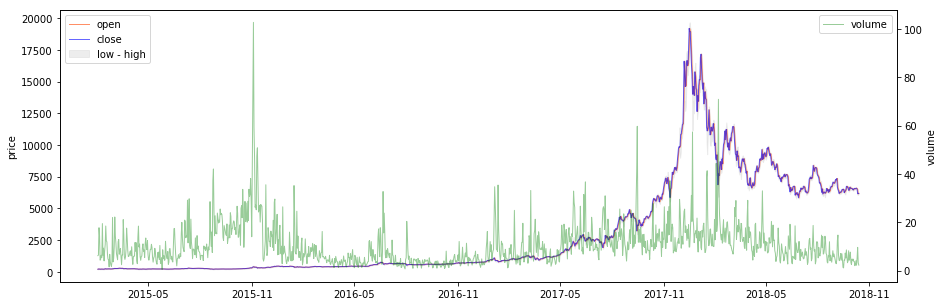

In [2]:
BC24H_FILENAME = './data_clean/btc_usd_24h_bitstamp.csv'
data24h = pd.read_csv(
    BC24H_FILENAME,
    index_col='datetime',
    parse_dates=['datetime']
)
print('> size:', len(data24h))
data24h['weekday'] = data24h.index.dayofweek
dd(data24h.dtypes)
dd(data24h.head())
dd(data24h.tail())
simple_plot(data24h, show_xlabels=False)

## Size 3|3

### LR=1e-3

data ~ (600, 1)
--- 0.014s to model compilation time


--- Created model id: 140222899281232
Tensor("lstm_11_input:0", shape=(?, 7, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_11 (LSTM)               (None, 7, 3)              60        
_________________________________________________________________
lstm_12 (LSTM)               (None, 3)                 84        
_________________________________________________________________
dense_6 (Dense)              (None, 1)                 4         
Total params: 148
Trainable params: 148
Non-trainable params: 0
_________________________________________________________________
None
Tensor("dense_6/BiasAdd:0", shape=(?, 1), dtype=float32)

Train on 277 samples, validate on 15 samples
Epoch 1/100
277/277 [==============================] - 2s 6ms/step - loss: 0.0048 - val_loss: 0.0073
Epoch 2/100
277/277 [===========================

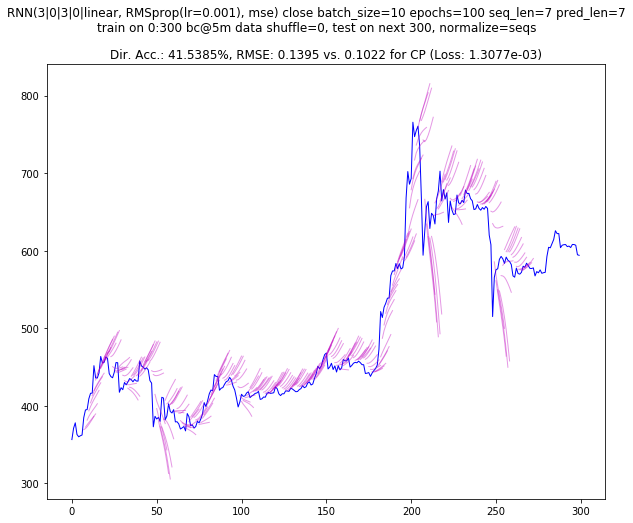

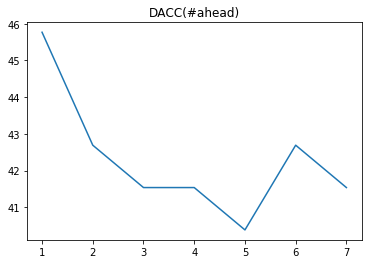

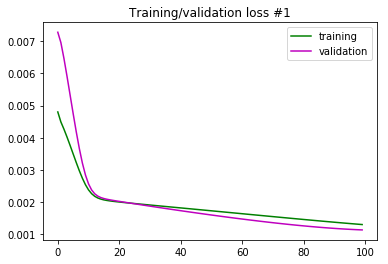

--- 25.167s to run experiment



In [8]:
with timing('run experiment'):
    res = run_walk_forward_validation_rnn(
        # data to extract:
        data24h,
        features=['close'],
        from_i=0,
        train_sz=300,
        test_sz=300,
        # data processing:
        normalize='seqs',  # 'seqs' | 'data'
        detrend=False,
        # model and prediction arrangement:
        seq_len=7,
        pred_len=7,
        model_maker=make_rnn_model_constructor(
            [3, 0, 3, 0],
            lr=1e-3,
        ),
        # training:
        epochs=100,
        batch_size=10,
        shuffle=False,
        # experiment setup:
        times=1,
        skip=False,
        fix_all_rngs_to=False,
        fix_rngs_before_each=False,
        # plotting:
        fig_size=(10, 8),
        fast=True,
    )
    plot_train_val_losses(res['train_val_losses'])

data ~ (600, 1)
--- 0.017s to model compilation time


--- Created model id: 140221660907088
Tensor("lstm_121_input:0", shape=(?, 7, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_121 (LSTM)              (None, 7, 3)              60        
_________________________________________________________________
lstm_122 (LSTM)              (None, 3)                 84        
_________________________________________________________________
dense_61 (Dense)             (None, 1)                 4         
Total params: 148
Trainable params: 148
Non-trainable params: 0
_________________________________________________________________
None
Tensor("dense_61/BiasAdd:0", shape=(?, 1), dtype=float32)

Train on 277 samples, validate on 15 samples
Epoch 1/50
277/277 [==============================] - 9s 33ms/step - loss: 0.0045 - val_loss: 0.0071
Epoch 2/50
277/277 [==========================

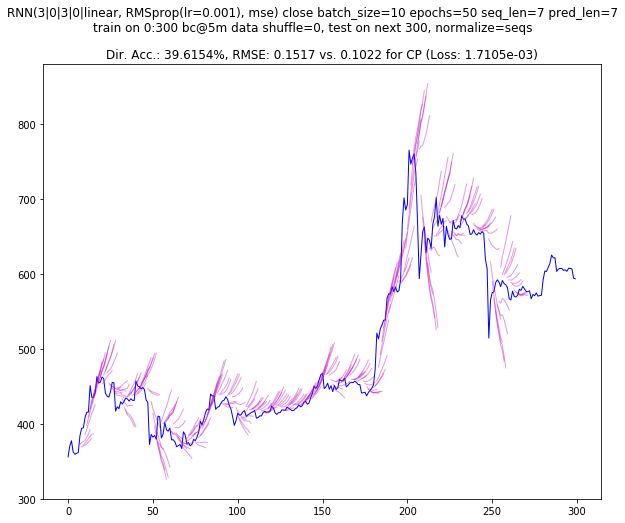

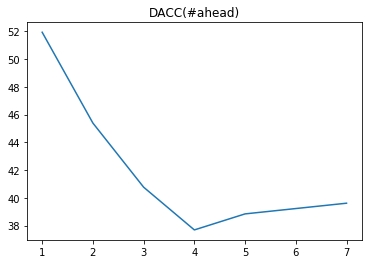

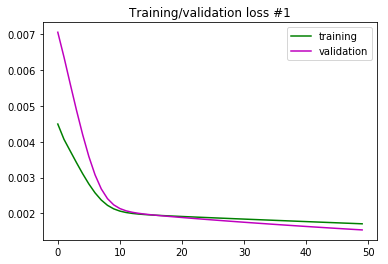

--- 28.899s to run experiment



In [39]:
with timing('run experiment'):
    res = run_walk_forward_validation_rnn(
        # data to extract:
        data24h,
        features=['close'],
        from_i=0,
        train_sz=300,
        test_sz=300,
        # data processing:
        normalize='seqs',  # 'seqs' | 'data'
        detrend=False,
        # model and prediction arrangement:
        seq_len=7,
        pred_len=7,
        model_maker=make_rnn_model_constructor(
            [3, 0, 3, 0],
            lr=1e-3,
        ),
        # training:
        epochs=50,
        batch_size=10,
        shuffle=False,
        # experiment setup:
        times=1,
        skip=False,
        fix_all_rngs_to=False,
        fix_rngs_before_each=False,
        # plotting:
        fig_size=(10, 8),
        fast=True,
    )
    plot_train_val_losses(res['train_val_losses'])

data ~ (600, 1)
--- 0.017s to model compilation time


--- Created model id: 140221813754704
Tensor("lstm_103_input:0", shape=(?, 7, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_103 (LSTM)              (None, 7, 3)              60        
_________________________________________________________________
lstm_104 (LSTM)              (None, 3)                 84        
_________________________________________________________________
dense_52 (Dense)             (None, 1)                 4         
Total params: 148
Trainable params: 148
Non-trainable params: 0
_________________________________________________________________
None
Tensor("dense_52/BiasAdd:0", shape=(?, 1), dtype=float32)

Train on 277 samples, validate on 15 samples
Epoch 1/6
277/277 [==============================] - 9s 31ms/step - loss: 0.0058 - val_loss: 0.0097
Epoch 2/6
277/277 [============================

Train on 277 samples, validate on 15 samples
Epoch 1/6
277/277 [==============================] - 8s 29ms/step - loss: 0.0058 - val_loss: 0.0094
Epoch 2/6
277/277 [==============================] - 0s 740us/step - loss: 0.0056 - val_loss: 0.0095
Epoch 3/6
277/277 [==============================] - 0s 801us/step - loss: 0.0056 - val_loss: 0.0094
Epoch 4/6
277/277 [==============================] - 0s 870us/step - loss: 0.0055 - val_loss: 0.0093
Epoch 5/6
277/277 [==============================] - 0s 832us/step - loss: 0.0054 - val_loss: 0.0091
Epoch 6/6
277/277 [==============================] - 0s 815us/step - loss: 0.0053 - val_loss: 0.0090
--- 10.764s to train model

> Predicting (now at 0)...
> Predicting (now at 10)...
> Predicting (now at 20)...
> Predicting (now at 30)...
> Predicting (now at 40)...
> Predicting (now at 50)...
> Predicting (now at 60)...
> Predicting (now at 70)...
> Predicting (now at 80)...
> Predicting (now at 90)...
> Predicting (now at 100)...
> Predicting (

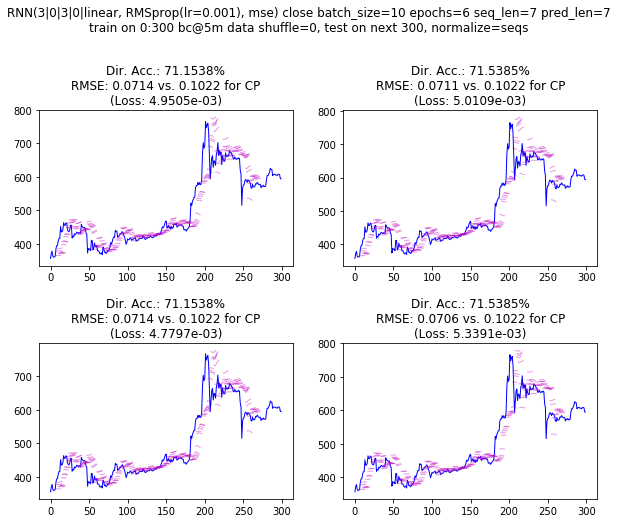

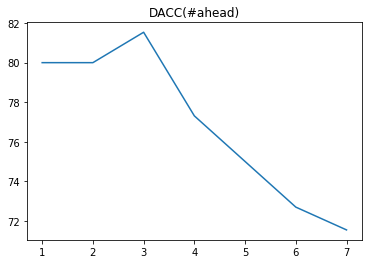

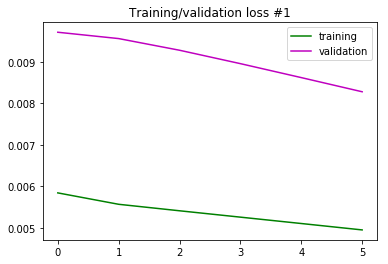

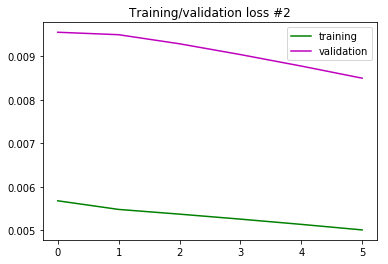

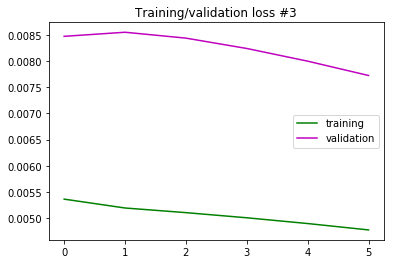

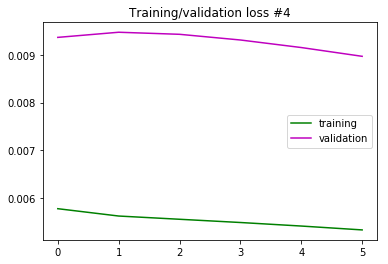

--- 60.672s to run experiment



In [36]:
with timing('run experiment'):
    res = run_walk_forward_validation_rnn(
        # data to extract:
        data24h,
        features=['close'],
        from_i=0,
        train_sz=300,
        test_sz=300,
        # data processing:
        normalize='seqs',  # 'seqs' | 'data'
        detrend=False,
        # model and prediction arrangement:
        seq_len=7,
        pred_len=7,
        model_maker=make_rnn_model_constructor(
            [3, 0, 3, 0],
            lr=1e-3,
        ),
        # training:
        epochs=6,
        batch_size=10,
        shuffle=False,
        # experiment setup:
        times=4,
        skip=False,
        fix_all_rngs_to=False,
        fix_rngs_before_each=False,
        # plotting:
        fig_size=(10, 8),
        fast=True,
    )
    plot_train_val_losses(res['train_val_losses'])

#### add dropout

data ~ (600, 1)
--- 0.018s to model compilation time


--- Created model id: 140221638166224
Tensor("lstm_123_input:0", shape=(?, 7, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_123 (LSTM)              (None, 7, 3)              60        
_________________________________________________________________
dropout_9 (Dropout)          (None, 7, 3)              0         
_________________________________________________________________
lstm_124 (LSTM)              (None, 3)                 84        
_________________________________________________________________
dropout_10 (Dropout)         (None, 3)                 0         
_________________________________________________________________
dense_62 (Dense)             (None, 1)                 4         
Total params: 148
Trainable params: 148
Non-trainable params: 0
__________________________________________________________

Train on 277 samples, validate on 15 samples
Epoch 1/6
277/277 [==============================] - 10s 36ms/step - loss: 0.0062 - val_loss: 0.0106
Epoch 2/6
277/277 [==============================] - 0s 786us/step - loss: 0.0059 - val_loss: 0.0106
Epoch 3/6
277/277 [==============================] - 0s 840us/step - loss: 0.0058 - val_loss: 0.0102
Epoch 4/6
277/277 [==============================] - 0s 925us/step - loss: 0.0057 - val_loss: 0.0098
Epoch 5/6
277/277 [==============================] - 0s 908us/step - loss: 0.0053 - val_loss: 0.0094
Epoch 6/6
277/277 [==============================] - 0s 829us/step - loss: 0.0053 - val_loss: 0.0089
--- 13.258s to train model

> Predicting (now at 0)...
> Predicting (now at 10)...
> Predicting (now at 20)...
> Predicting (now at 30)...
> Predicting (now at 40)...
> Predicting (now at 50)...
> Predicting (now at 60)...
> Predicting (now at 70)...
> Predicting (now at 80)...
> Predicting (now at 90)...
> Predicting (now at 100)...
> Predicting 

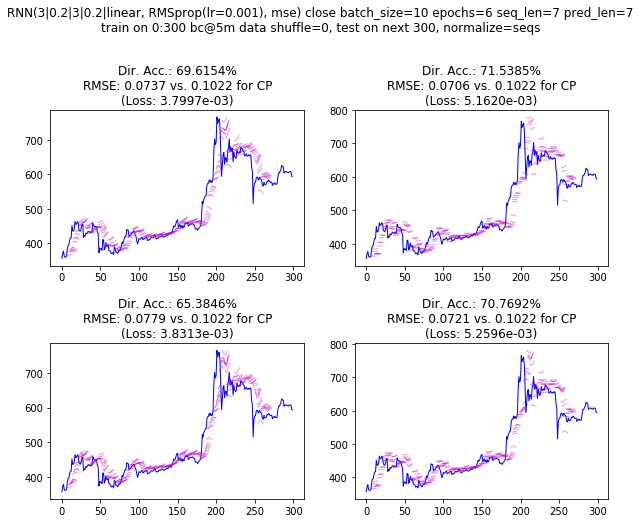

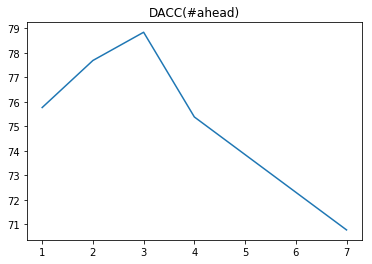

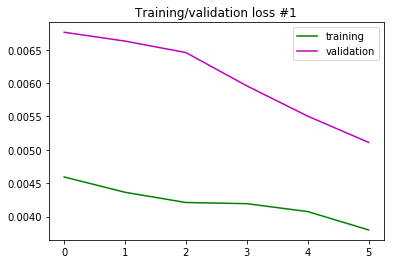

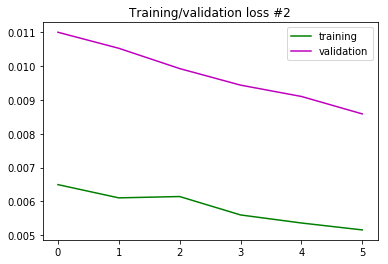

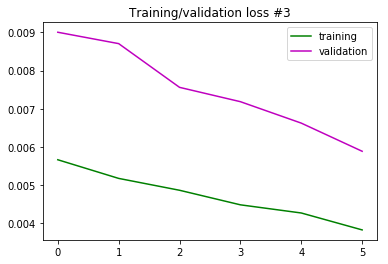

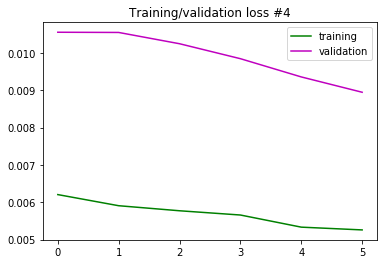

--- 74.148s to run experiment



In [40]:
with timing('run experiment'):
    res = run_walk_forward_validation_rnn(
        # data to extract:
        data24h,
        features=['close'],
        from_i=0,
        train_sz=300,
        test_sz=300,
        # data processing:
        normalize='seqs',  # 'seqs' | 'data'
        detrend=False,
        # model and prediction arrangement:
        seq_len=7,
        pred_len=7,
        model_maker=make_rnn_model_constructor(
            [3, 0.2, 3, 0.2],
            lr=1e-3,
        ),
        # training:
        epochs=6,
        batch_size=10,
        shuffle=False,
        # experiment setup:
        times=4,
        skip=False,
        fix_all_rngs_to=False,
        fix_rngs_before_each=False,
        # plotting:
        fig_size=(10, 8),
        fast=True,
    )
    plot_train_val_losses(res['train_val_losses'])

### LR=1e-2

data ~ (600, 1)
--- 0.014s to model compilation time


--- Created model id: 140222899172176
Tensor("lstm_13_input:0", shape=(?, 7, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_13 (LSTM)               (None, 7, 3)              60        
_________________________________________________________________
lstm_14 (LSTM)               (None, 3)                 84        
_________________________________________________________________
dense_7 (Dense)              (None, 1)                 4         
Total params: 148
Trainable params: 148
Non-trainable params: 0
_________________________________________________________________
None
Tensor("dense_7/BiasAdd:0", shape=(?, 1), dtype=float32)

Train on 277 samples, validate on 15 samples
Epoch 1/100
277/277 [==============================] - 2s 6ms/step - loss: 0.0046 - val_loss: 0.0101
Epoch 2/100
277/277 [===========================

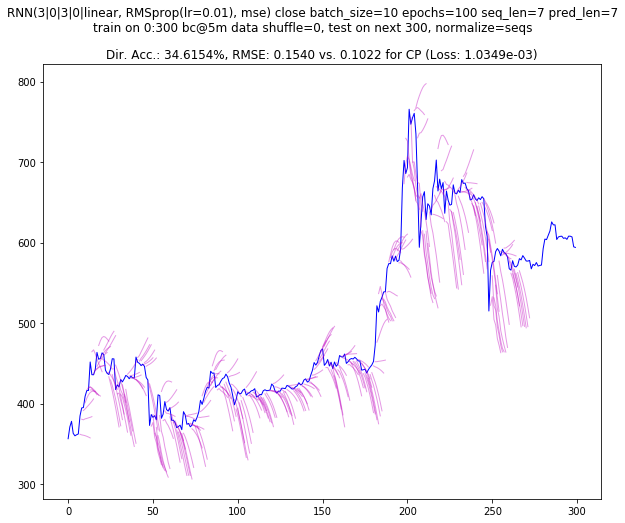

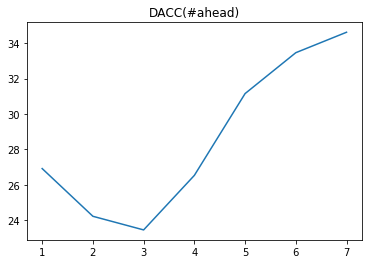

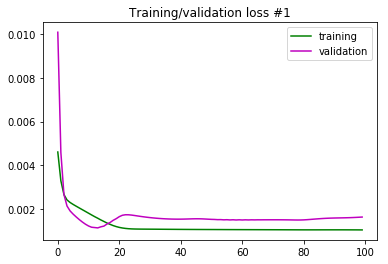

--- 25.620s to run experiment



In [9]:
with timing('run experiment'):
    res = run_walk_forward_validation_rnn(
        # data to extract:
        data24h,
        features=['close'],
        from_i=0,
        train_sz=300,
        test_sz=300,
        # data processing:
        normalize='seqs',  # 'seqs' | 'data'
        detrend=False,
        # model and prediction arrangement:
        seq_len=7,
        pred_len=7,
        model_maker=make_rnn_model_constructor(
            [3, 0, 3, 0],
            lr=1e-2,
        ),
        # training:
        epochs=100,
        batch_size=10,
        shuffle=False,
        # experiment setup:
        times=1,
        skip=False,
        fix_all_rngs_to=False,
        fix_rngs_before_each=False,
        # plotting:
        fig_size=(10, 8),
        fast=True,
    )
    plot_train_val_losses(res['train_val_losses'])

data ~ (600, 1)
--- 0.016s to model compilation time


--- Created model id: 140222329290192
Tensor("lstm_41_input:0", shape=(?, 7, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_41 (LSTM)               (None, 7, 3)              60        
_________________________________________________________________
lstm_42 (LSTM)               (None, 3)                 84        
_________________________________________________________________
dense_21 (Dense)             (None, 1)                 4         
Total params: 148
Trainable params: 148
Non-trainable params: 0
_________________________________________________________________
None
Tensor("dense_21/BiasAdd:0", shape=(?, 1), dtype=float32)

Train on 277 samples, validate on 15 samples
Epoch 1/50
277/277 [==============================] - 4s 13ms/step - loss: 0.0053 - val_loss: 0.0085
Epoch 2/50
277/277 [===========================

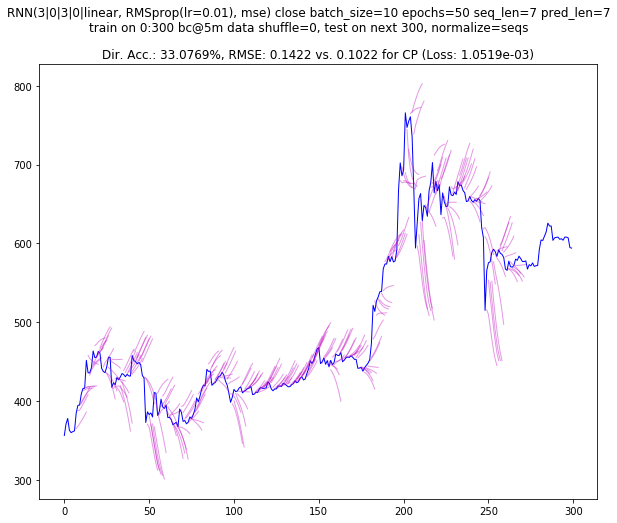

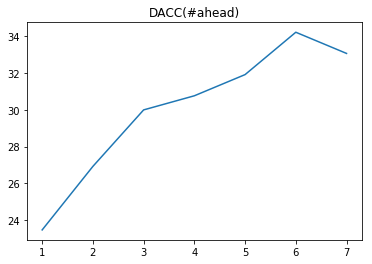

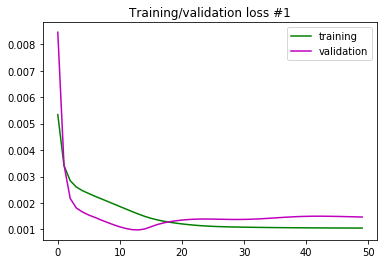

--- 18.178s to run experiment



In [17]:
with timing('run experiment'):
    res = run_walk_forward_validation_rnn(
        # data to extract:
        data24h,
        features=['close'],
        from_i=0,
        train_sz=300,
        test_sz=300,
        # data processing:
        normalize='seqs',  # 'seqs' | 'data'
        detrend=False,
        # model and prediction arrangement:
        seq_len=7,
        pred_len=7,
        model_maker=make_rnn_model_constructor(
            [3, 0, 3, 0],
            lr=1e-2,
        ),
        # training:
        epochs=50,
        batch_size=10,
        shuffle=False,
        # experiment setup:
        times=1,
        skip=False,
        fix_all_rngs_to=False,
        fix_rngs_before_each=False,
        # plotting:
        fig_size=(10, 8),
        fast=True,
    )
    plot_train_val_losses(res['train_val_losses'])

data ~ (600, 1)
--- 0.016s to model compilation time


--- Created model id: 140222203025424
Tensor("lstm_57_input:0", shape=(?, 7, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_57 (LSTM)               (None, 7, 3)              60        
_________________________________________________________________
lstm_58 (LSTM)               (None, 3)                 84        
_________________________________________________________________
dense_29 (Dense)             (None, 1)                 4         
Total params: 148
Trainable params: 148
Non-trainable params: 0
_________________________________________________________________
None
Tensor("dense_29/BiasAdd:0", shape=(?, 1), dtype=float32)

Train on 277 samples, validate on 15 samples
Epoch 1/12
277/277 [==============================] - 5s 17ms/step - loss: 0.0042 - val_loss: 0.0078
Epoch 2/12
277/277 [===========================

277/277 [==============================] - 0s 770us/step - loss: 0.0018 - val_loss: 0.0011
--- 8.404s to train model

> Predicting (now at 0)...
> Predicting (now at 10)...
> Predicting (now at 20)...
> Predicting (now at 30)...
> Predicting (now at 40)...
> Predicting (now at 50)...
> Predicting (now at 60)...
> Predicting (now at 70)...
> Predicting (now at 80)...
> Predicting (now at 90)...
> Predicting (now at 100)...
> Predicting (now at 110)...
> Predicting (now at 120)...
> Predicting (now at 130)...
> Predicting (now at 140)...
> Predicting (now at 150)...
> Predicting (now at 160)...
> Predicting (now at 170)...
> Predicting (now at 180)...
> Predicting (now at 190)...
> Predicting (now at 200)...
> Predicting (now at 210)...
> Predicting (now at 220)...
> Predicting (now at 230)...
> Predicting (now at 240)...
> Predicting (now at 250)...
--- 1.915s to walk and predict

--- 0.264s to plot incremental predictions

--- 0.016s to model compilation time


--- Created model id: 14

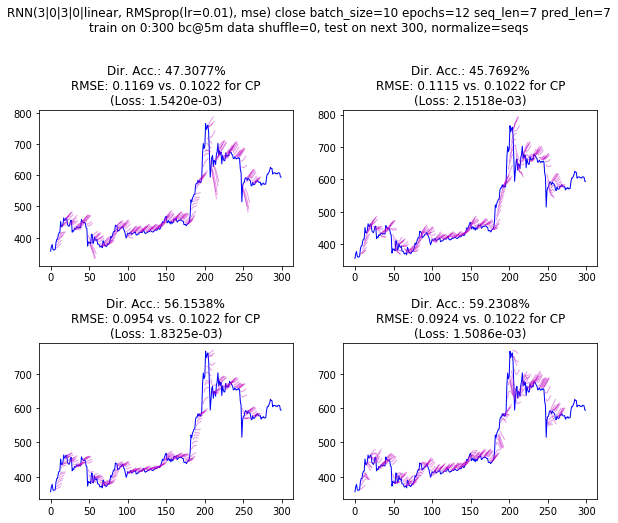

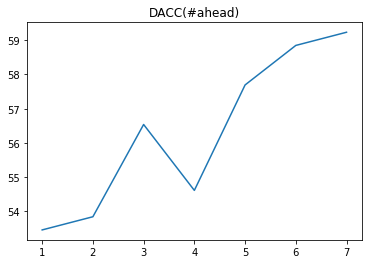

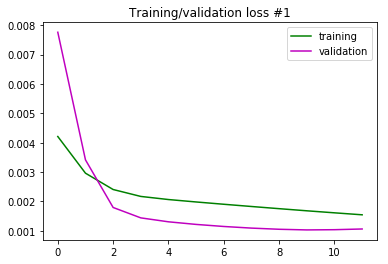

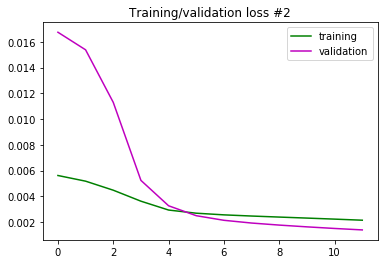

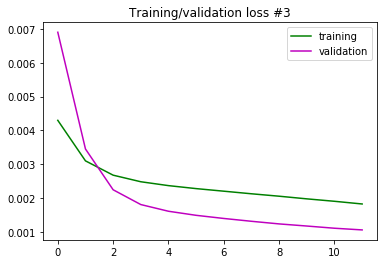

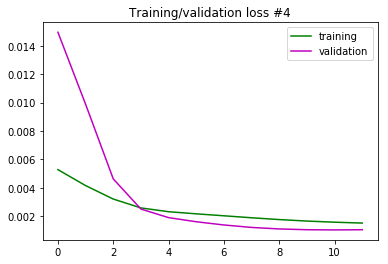

--- 45.033s to run experiment



In [25]:
with timing('run experiment'):
    res = run_walk_forward_validation_rnn(
        # data to extract:
        data24h,
        features=['close'],
        from_i=0,
        train_sz=300,
        test_sz=300,
        # data processing:
        normalize='seqs',  # 'seqs' | 'data'
        detrend=False,
        # model and prediction arrangement:
        seq_len=7,
        pred_len=7,
        model_maker=make_rnn_model_constructor(
            [3, 0, 3, 0],
            lr=1e-2,
        ),
        # training:
        epochs=12,
        batch_size=10,
        shuffle=False,
        # experiment setup:
        times=4,
        skip=False,
        fix_all_rngs_to=False,
        fix_rngs_before_each=False,
        # plotting:
        fig_size=(10, 8),
        fast=True,
    )
    plot_train_val_losses(res['train_val_losses'])

data ~ (600, 1)
--- 0.034s to model compilation time


--- Created model id: 140222116334288
Tensor("lstm_65_input:0", shape=(?, 7, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_65 (LSTM)               (None, 7, 3)              60        
_________________________________________________________________
lstm_66 (LSTM)               (None, 3)                 84        
_________________________________________________________________
dense_33 (Dense)             (None, 1)                 4         
Total params: 148
Trainable params: 148
Non-trainable params: 0
_________________________________________________________________
None
Tensor("dense_33/BiasAdd:0", shape=(?, 1), dtype=float32)

Train on 277 samples, validate on 15 samples
Epoch 1/6
277/277 [==============================] - 5s 19ms/step - loss: 0.0059 - val_loss: 0.0176
Epoch 2/6
277/277 [=============================

277/277 [==============================] - 5s 20ms/step - loss: 0.0055 - val_loss: 0.0161
Epoch 2/6
277/277 [==============================] - 0s 861us/step - loss: 0.0044 - val_loss: 0.0109
Epoch 3/6
277/277 [==============================] - 0s 934us/step - loss: 0.0033 - val_loss: 0.0047
Epoch 4/6
277/277 [==============================] - 0s 935us/step - loss: 0.0026 - val_loss: 0.0025
Epoch 5/6
277/277 [==============================] - 0s 815us/step - loss: 0.0023 - val_loss: 0.0019
Epoch 6/6
277/277 [==============================] - 0s 822us/step - loss: 0.0022 - val_loss: 0.0017
--- 7.970s to train model

> Predicting (now at 0)...
> Predicting (now at 10)...
> Predicting (now at 20)...
> Predicting (now at 30)...
> Predicting (now at 40)...
> Predicting (now at 50)...
> Predicting (now at 60)...
> Predicting (now at 70)...
> Predicting (now at 80)...
> Predicting (now at 90)...
> Predicting (now at 100)...
> Predicting (now at 110)...
> Predicting (now at 120)...
> Predicting

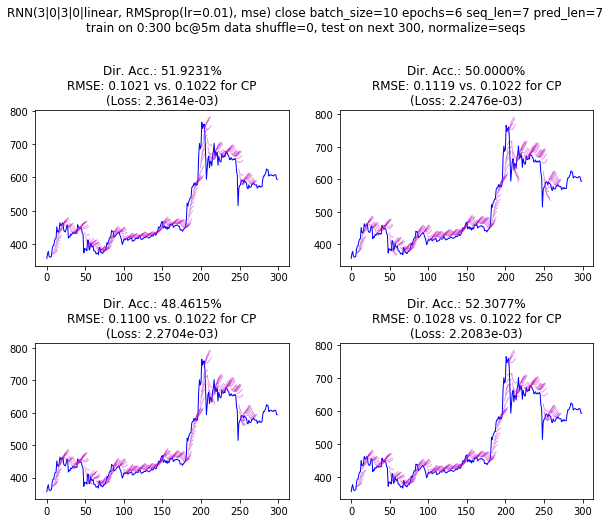

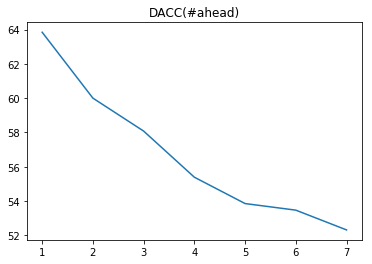

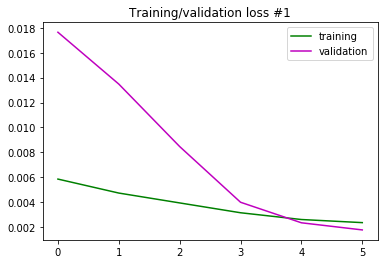

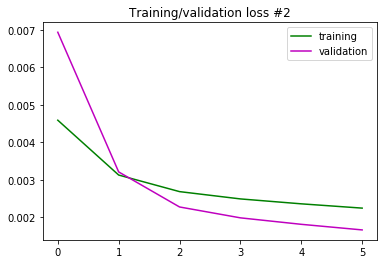

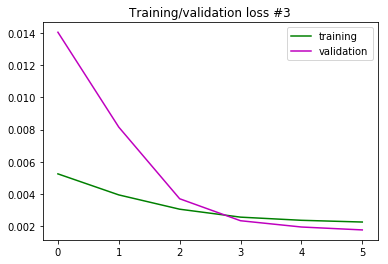

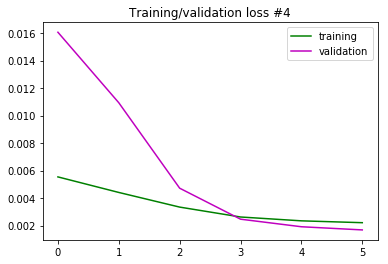

--- 47.236s to run experiment



In [26]:
with timing('run experiment'):
    res = run_walk_forward_validation_rnn(
        # data to extract:
        data24h,
        features=['close'],
        from_i=0,
        train_sz=300,
        test_sz=300,
        # data processing:
        normalize='seqs',  # 'seqs' | 'data'
        detrend=False,
        # model and prediction arrangement:
        seq_len=7,
        pred_len=7,
        model_maker=make_rnn_model_constructor(
            [3, 0, 3, 0],
            lr=1e-2,
        ),
        # training:
        epochs=6,
        batch_size=10,
        shuffle=False,
        # experiment setup:
        times=4,
        skip=False,
        fix_all_rngs_to=False,
        fix_rngs_before_each=False,
        # plotting:
        fig_size=(10, 8),
        fast=True,
    )
    plot_train_val_losses(res['train_val_losses'])

### LR=1e-4

data ~ (600, 1)
--- 0.017s to model compilation time


--- Created model id: 140221909708048
Tensor("lstm_93_input:0", shape=(?, 7, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_93 (LSTM)               (None, 7, 3)              60        
_________________________________________________________________
lstm_94 (LSTM)               (None, 3)                 84        
_________________________________________________________________
dense_47 (Dense)             (None, 1)                 4         
Total params: 148
Trainable params: 148
Non-trainable params: 0
_________________________________________________________________
None
Tensor("dense_47/BiasAdd:0", shape=(?, 1), dtype=float32)

Train on 277 samples, validate on 15 samples
Epoch 1/80
277/277 [==============================] - 7s 25ms/step - loss: 0.0063 - val_loss: 0.0089
Epoch 2/80
277/277 [===========================

277/277 [==============================] - 0s 764us/step - loss: 0.0044 - val_loss: 0.0065
Epoch 72/80
277/277 [==============================] - 0s 788us/step - loss: 0.0043 - val_loss: 0.0064
Epoch 73/80
277/277 [==============================] - 0s 782us/step - loss: 0.0043 - val_loss: 0.0064
Epoch 74/80
277/277 [==============================] - 0s 793us/step - loss: 0.0043 - val_loss: 0.0063
Epoch 75/80
277/277 [==============================] - 0s 783us/step - loss: 0.0043 - val_loss: 0.0063
Epoch 76/80
277/277 [==============================] - 0s 792us/step - loss: 0.0043 - val_loss: 0.0062
Epoch 77/80
277/277 [==============================] - 0s 760us/step - loss: 0.0042 - val_loss: 0.0062
Epoch 78/80
277/277 [==============================] - 0s 826us/step - loss: 0.0042 - val_loss: 0.0061
Epoch 79/80
277/277 [==============================] - 0s 933us/step - loss: 0.0042 - val_loss: 0.0061
Epoch 80/80
277/277 [==============================] - 0s 954us/step - loss: 0.0042 -

277/277 [==============================] - 0s 1ms/step - loss: 0.0053 - val_loss: 0.0088
Epoch 36/80
277/277 [==============================] - 0s 1ms/step - loss: 0.0053 - val_loss: 0.0088
Epoch 37/80
277/277 [==============================] - 0s 1ms/step - loss: 0.0053 - val_loss: 0.0087
Epoch 38/80
277/277 [==============================] - 0s 1ms/step - loss: 0.0053 - val_loss: 0.0087
Epoch 39/80
277/277 [==============================] - 0s 1ms/step - loss: 0.0053 - val_loss: 0.0087
Epoch 40/80
277/277 [==============================] - 0s 1ms/step - loss: 0.0053 - val_loss: 0.0087
Epoch 41/80
277/277 [==============================] - 0s 1ms/step - loss: 0.0052 - val_loss: 0.0086
Epoch 42/80
277/277 [==============================] - 0s 1ms/step - loss: 0.0052 - val_loss: 0.0086
Epoch 43/80
277/277 [==============================] - 0s 1ms/step - loss: 0.0052 - val_loss: 0.0086
Epoch 44/80
277/277 [==============================] - 0s 1ms/step - loss: 0.0052 - val_loss: 0.0086
Ep

Epoch 18/80
277/277 [==============================] - 0s 815us/step - loss: 0.0056 - val_loss: 0.0094
Epoch 19/80
277/277 [==============================] - 0s 849us/step - loss: 0.0056 - val_loss: 0.0094
Epoch 20/80
277/277 [==============================] - 0s 841us/step - loss: 0.0056 - val_loss: 0.0094
Epoch 21/80
277/277 [==============================] - 0s 863us/step - loss: 0.0056 - val_loss: 0.0093
Epoch 22/80
277/277 [==============================] - ETA: 0s - loss: 0.003 - 0s 981us/step - loss: 0.0055 - val_loss: 0.0093
Epoch 23/80
277/277 [==============================] - 0s 818us/step - loss: 0.0055 - val_loss: 0.0093
Epoch 24/80
277/277 [==============================] - 0s 767us/step - loss: 0.0055 - val_loss: 0.0092
Epoch 25/80
277/277 [==============================] - 0s 909us/step - loss: 0.0055 - val_loss: 0.0092
Epoch 26/80
277/277 [==============================] - 0s 939us/step - loss: 0.0055 - val_loss: 0.0092
Epoch 27/80
277/277 [============================

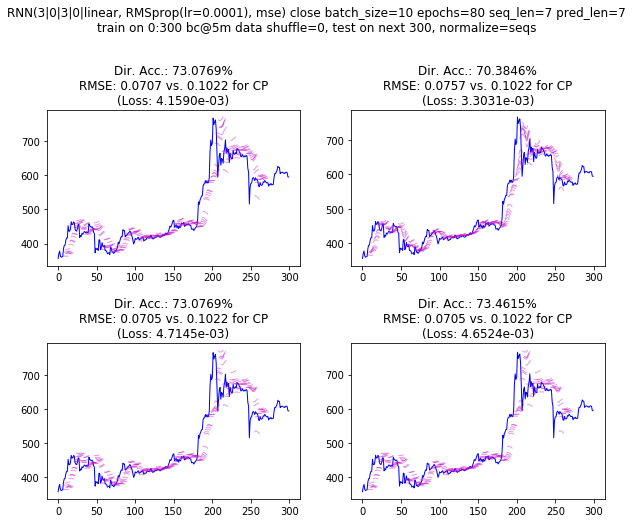

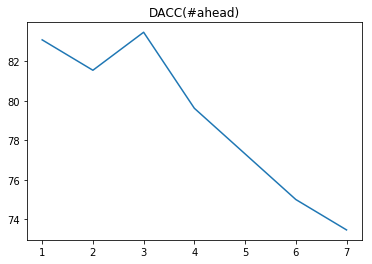

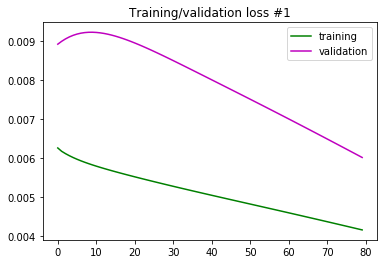

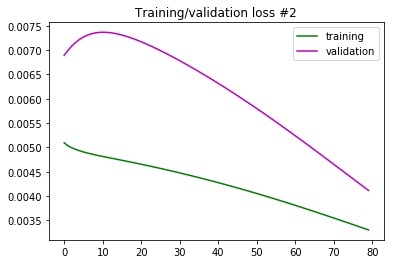

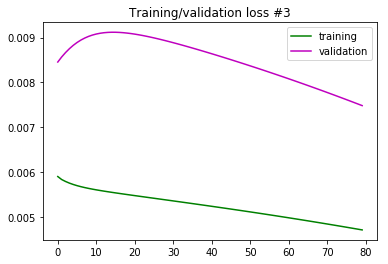

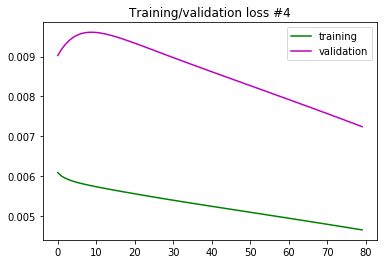

--- 135.517s to run experiment



In [34]:
with timing('run experiment'):
    res = run_walk_forward_validation_rnn(
        # data to extract:
        data24h,
        features=['close'],
        from_i=0,
        train_sz=300,
        test_sz=300,
        # data processing:
        normalize='seqs',  # 'seqs' | 'data'
        detrend=False,
        # model and prediction arrangement:
        seq_len=7,
        pred_len=7,
        model_maker=make_rnn_model_constructor(
            [3, 0, 3, 0],
            lr=1e-4,
        ),
        # training:
        epochs=80,
        batch_size=10,
        shuffle=False,
        # experiment setup:
        times=4,
        skip=False,
        fix_all_rngs_to=False,
        fix_rngs_before_each=False,
        # plotting:
        fig_size=(10, 8),
        fast=True,
    )
    plot_train_val_losses(res['train_val_losses'])

## Size 7|7

### LR=1e-3

In [ ]:
with timing('run experiment'):
    res = run_walk_forward_validation_rnn(
        # data to extract:
        data24h,
        features=['close'],
        from_i=0,
        train_sz=300,
        test_sz=300,
        # data processing:
        normalize='seqs',  # 'seqs' | 'data'
        detrend=False,
        # model and prediction arrangement:
        seq_len=7,
        pred_len=7,
        model_maker=make_rnn_model_constructor(
            [3, 0, 3, 0],
            lr=1e-3,
        ),
        # training:
        epochs=100,
        batch_size=10,
        shuffle=False,
        # experiment setup:
        times=1,
        skip=False,
        fix_all_rngs_to=False,
        fix_rngs_before_each=False,
        # plotting:
        fig_size=(10, 8),
        fast=True,
    )
    plot_train_val_losses(res['train_val_losses'])

data ~ (600, 1)
--- 0.017s to model compilation time


--- Created model id: 140221548157008
Tensor("lstm_131_input:0", shape=(?, 7, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_131 (LSTM)              (None, 7, 7)              252       
_________________________________________________________________
lstm_132 (LSTM)              (None, 7)                 420       
_________________________________________________________________
dense_66 (Dense)             (None, 1)                 8         
Total params: 680
Trainable params: 680
Non-trainable params: 0
_________________________________________________________________
None
Tensor("dense_66/BiasAdd:0", shape=(?, 1), dtype=float32)

Train on 277 samples, validate on 15 samples
Epoch 1/100
277/277 [==============================] - 10s 35ms/step - loss: 0.0060 - val_loss: 0.0100
Epoch 2/100
277/277 [=======================

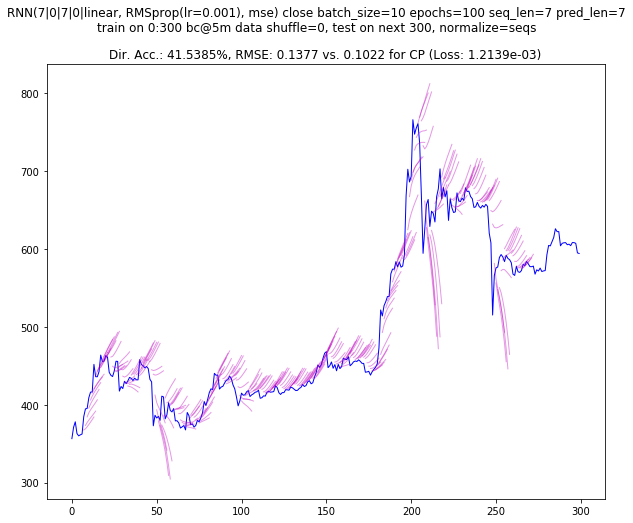

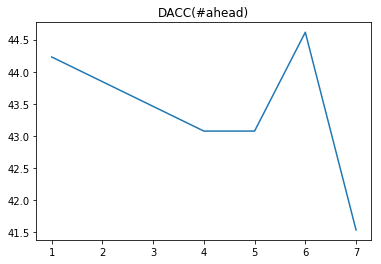

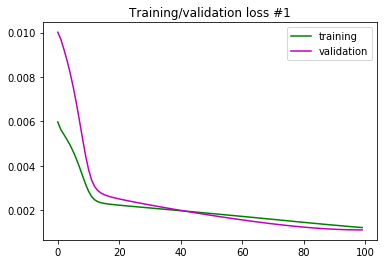

--- 42.704s to run experiment



In [41]:
with timing('run experiment'):
    res = run_walk_forward_validation_rnn(
        # data to extract:
        data24h,
        features=['close'],
        from_i=0,
        train_sz=300,
        test_sz=300,
        # data processing:
        normalize='seqs',  # 'seqs' | 'data'
        detrend=False,
        # model and prediction arrangement:
        seq_len=7,
        pred_len=7,
        model_maker=make_rnn_model_constructor(
            [7, 0, 7, 0],
            lr=1e-3,
        ),
        # training:
        epochs=100,
        batch_size=10,
        shuffle=False,
        # experiment setup:
        times=1,
        skip=False,
        fix_all_rngs_to=False,
        fix_rngs_before_each=False,
        # plotting:
        fig_size=(10, 8),
        fast=True,
    )
    plot_train_val_losses(res['train_val_losses'])

data ~ (600, 1)
--- 0.017s to model compilation time


--- Created model id: 140221680324688
Tensor("lstm_139_input:0", shape=(?, 7, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_139 (LSTM)              (None, 7, 7)              252       
_________________________________________________________________
lstm_140 (LSTM)              (None, 7)                 420       
_________________________________________________________________
dense_70 (Dense)             (None, 1)                 8         
Total params: 680
Trainable params: 680
Non-trainable params: 0
_________________________________________________________________
None
Tensor("dense_70/BiasAdd:0", shape=(?, 1), dtype=float32)

Train on 277 samples, validate on 15 samples
Epoch 1/6
277/277 [==============================] - 10s 38ms/step - loss: 0.0050 - val_loss: 0.0084
Epoch 2/6
277/277 [===========================

Train on 277 samples, validate on 15 samples
Epoch 1/6
277/277 [==============================] - 11s 40ms/step - loss: 0.0049 - val_loss: 0.0079
Epoch 2/6
277/277 [==============================] - 0s 948us/step - loss: 0.0046 - val_loss: 0.0076
Epoch 3/6
277/277 [==============================] - 0s 1ms/step - loss: 0.0044 - val_loss: 0.0071
Epoch 4/6
277/277 [==============================] - 0s 1ms/step - loss: 0.0041 - val_loss: 0.0066
Epoch 5/6
277/277 [==============================] - 0s 1ms/step - loss: 0.0038 - val_loss: 0.0059
Epoch 6/6
277/277 [==============================] - 0s 1ms/step - loss: 0.0035 - val_loss: 0.0053
--- 14.421s to train model

> Predicting (now at 0)...
> Predicting (now at 10)...
> Predicting (now at 20)...
> Predicting (now at 30)...
> Predicting (now at 40)...
> Predicting (now at 50)...
> Predicting (now at 60)...
> Predicting (now at 70)...
> Predicting (now at 80)...
> Predicting (now at 90)...
> Predicting (now at 100)...
> Predicting (now at 

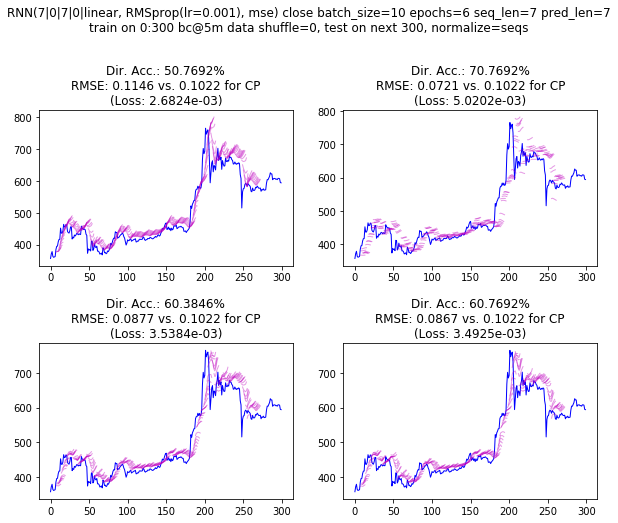

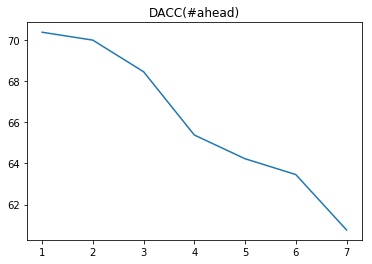

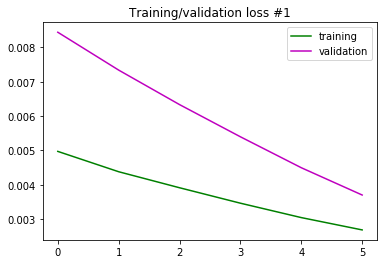

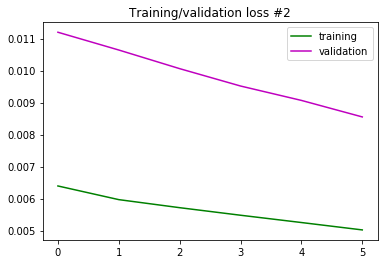

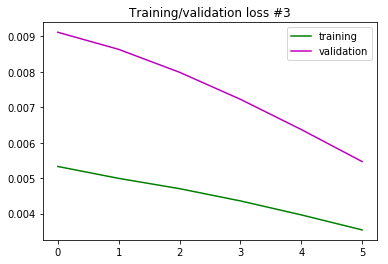

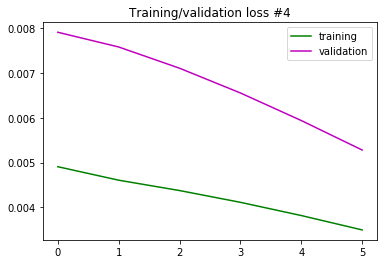

--- 79.096s to run experiment



In [45]:
with timing('run experiment'):
    res = run_walk_forward_validation_rnn(
        # data to extract:
        data24h,
        features=['close'],
        from_i=0,
        train_sz=300,
        test_sz=300,
        # data processing:
        normalize='seqs',  # 'seqs' | 'data'
        detrend=False,
        # model and prediction arrangement:
        seq_len=7,
        pred_len=7,
        model_maker=make_rnn_model_constructor(
            [7, 0, 7, 0],
            lr=1e-3,
        ),
        # training:
        epochs=6,
        batch_size=10,
        shuffle=False,
        # experiment setup:
        times=4,
        skip=False,
        fix_all_rngs_to=False,
        fix_rngs_before_each=False,
        # plotting:
        fig_size=(10, 8),
        fast=True,
    )
    plot_train_val_losses(res['train_val_losses'])

#### add dropout

data ~ (600, 1)
--- 0.019s to model compilation time


--- Created model id: 140221349035984
Tensor("lstm_155_input:0", shape=(?, 7, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_155 (LSTM)              (None, 7, 7)              252       
_________________________________________________________________
dropout_25 (Dropout)         (None, 7, 7)              0         
_________________________________________________________________
lstm_156 (LSTM)              (None, 7)                 420       
_________________________________________________________________
dropout_26 (Dropout)         (None, 7)                 0         
_________________________________________________________________
dense_78 (Dense)             (None, 1)                 8         
Total params: 680
Trainable params: 680
Non-trainable params: 0
__________________________________________________________

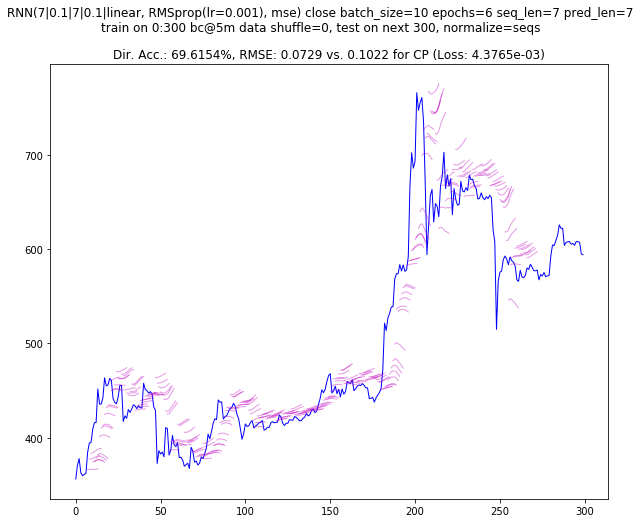

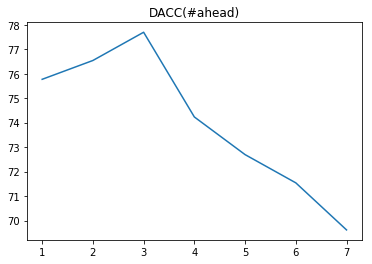

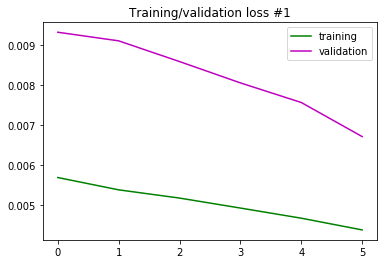

--- 21.522s to run experiment



In [47]:
with timing('run experiment'):
    res = run_walk_forward_validation_rnn(
        # data to extract:
        data24h,
        features=['close'],
        from_i=0,
        train_sz=300,
        test_sz=300,
        # data processing:
        normalize='seqs',  # 'seqs' | 'data'
        detrend=False,
        # model and prediction arrangement:
        seq_len=7,
        pred_len=7,
        model_maker=make_rnn_model_constructor(
            [7, 0.1, 7, 0.2],
            lr=1e-3,
        ),
        # training:
        epochs=6,
        batch_size=10,
        shuffle=False,
        # experiment setup:
        times=4,
        skip=False,
        fix_all_rngs_to=False,
        fix_rngs_before_each=False,
        # plotting:
        fig_size=(10, 8),
        fast=True,
    )
    plot_train_val_losses(res['train_val_losses'])

### LR=1e-2

data ~ (600, 1)
--- 0.018s to model compilation time


--- Created model id: 140221325722384
Tensor("lstm_157_input:0", shape=(?, 7, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_157 (LSTM)              (None, 7, 7)              252       
_________________________________________________________________
lstm_158 (LSTM)              (None, 7)                 420       
_________________________________________________________________
dense_79 (Dense)             (None, 1)                 8         
Total params: 680
Trainable params: 680
Non-trainable params: 0
_________________________________________________________________
None
Tensor("dense_79/BiasAdd:0", shape=(?, 1), dtype=float32)

Train on 277 samples, validate on 15 samples
Epoch 1/50
277/277 [==============================] - 12s 43ms/step - loss: 0.0054 - val_loss: 0.0050
Epoch 2/50
277/277 [=========================

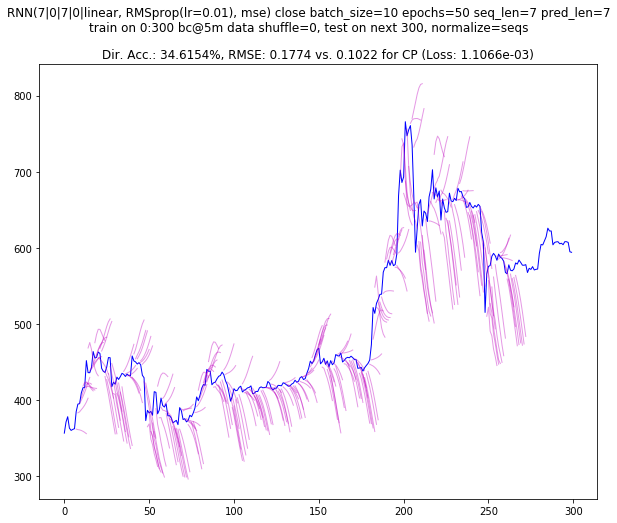

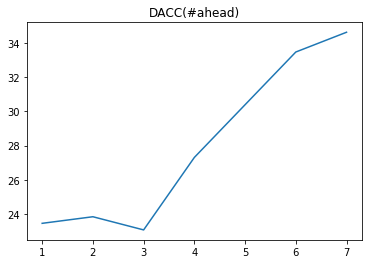

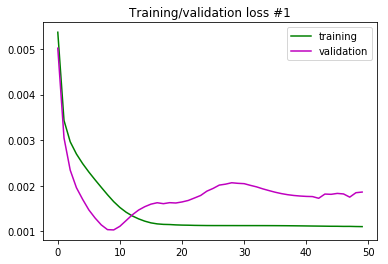

--- 33.564s to run experiment



In [48]:
with timing('run experiment'):
    res = run_walk_forward_validation_rnn(
        # data to extract:
        data24h,
        features=['close'],
        from_i=0,
        train_sz=300,
        test_sz=300,
        # data processing:
        normalize='seqs',  # 'seqs' | 'data'
        detrend=False,
        # model and prediction arrangement:
        seq_len=7,
        pred_len=7,
        model_maker=make_rnn_model_constructor(
            [7, 0, 7, 0],
            lr=1e-2,
        ),
        # training:
        epochs=50,
        batch_size=10,
        shuffle=False,
        # experiment setup:
        times=1,
        skip=False,
        fix_all_rngs_to=False,
        fix_rngs_before_each=False,
        # plotting:
        fig_size=(10, 8),
        fast=True,
    )
    plot_train_val_losses(res['train_val_losses'])

data ~ (600, 1)
--- 0.018s to model compilation time


--- Created model id: 140221237474832
Tensor("lstm_165_input:0", shape=(?, 7, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_165 (LSTM)              (None, 7, 7)              252       
_________________________________________________________________
lstm_166 (LSTM)              (None, 7)                 420       
_________________________________________________________________
dense_83 (Dense)             (None, 1)                 8         
Total params: 680
Trainable params: 680
Non-trainable params: 0
_________________________________________________________________
None
Tensor("dense_83/BiasAdd:0", shape=(?, 1), dtype=float32)

Train on 277 samples, validate on 15 samples
Epoch 1/15
277/277 [==============================] - 12s 44ms/step - loss: 0.0057 - val_loss: 0.0165
Epoch 2/15
277/277 [=========================

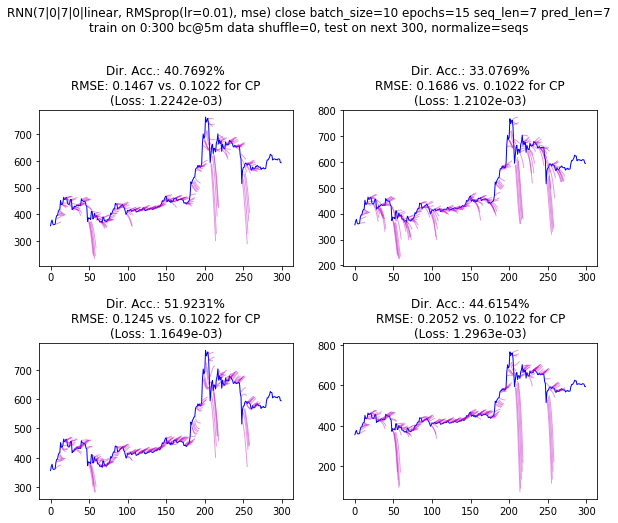

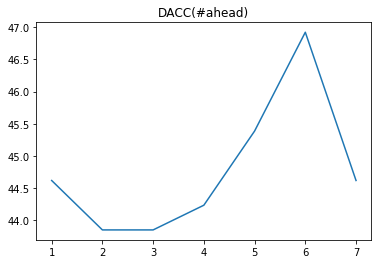

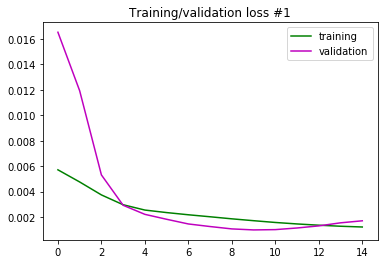

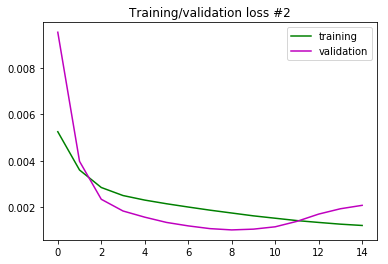

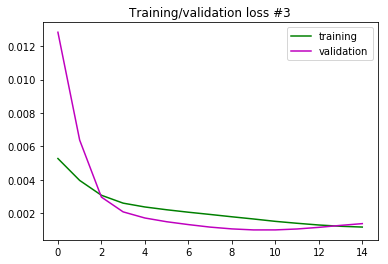

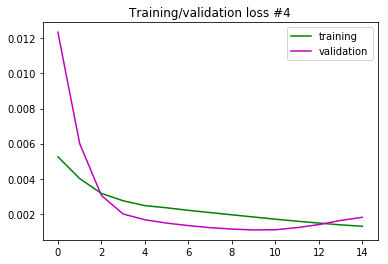

--- 111.546s to run experiment



In [52]:
with timing('run experiment'):
    res = run_walk_forward_validation_rnn(
        # data to extract:
        data24h,
        features=['close'],
        from_i=0,
        train_sz=300,
        test_sz=300,
        # data processing:
        normalize='seqs',  # 'seqs' | 'data'
        detrend=False,
        # model and prediction arrangement:
        seq_len=7,
        pred_len=7,
        model_maker=make_rnn_model_constructor(
            [7, 0, 7, 0],
            lr=1e-2,
        ),
        # training:
        epochs=15,
        batch_size=10,
        shuffle=False,
        # experiment setup:
        times=4,
        skip=False,
        fix_all_rngs_to=False,
        fix_rngs_before_each=False,
        # plotting:
        fig_size=(10, 8),
        fast=True,
    )
    plot_train_val_losses(res['train_val_losses'])

### LR=1e-4

data ~ (600, 1)
--- 0.018s to model compilation time


--- Created model id: 140221203521232
Tensor("lstm_175_input:0", shape=(?, 7, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_175 (LSTM)              (None, 7, 7)              252       
_________________________________________________________________
lstm_176 (LSTM)              (None, 7)                 420       
_________________________________________________________________
dense_88 (Dense)             (None, 1)                 8         
Total params: 680
Trainable params: 680
Non-trainable params: 0
_________________________________________________________________
None
Tensor("dense_88/BiasAdd:0", shape=(?, 1), dtype=float32)

Train on 277 samples, validate on 15 samples
Epoch 1/200
277/277 [==============================] - 14s 51ms/step - loss: 0.0057 - val_loss: 0.0081
Epoch 2/200
277/277 [=======================

Epoch 71/200
277/277 [==============================] - 0s 981us/step - loss: 0.0026 - val_loss: 0.0028
Epoch 72/200
277/277 [==============================] - 0s 1ms/step - loss: 0.0026 - val_loss: 0.0027
Epoch 73/200
277/277 [==============================] - 0s 1ms/step - loss: 0.0026 - val_loss: 0.0027
Epoch 74/200
277/277 [==============================] - 0s 1ms/step - loss: 0.0025 - val_loss: 0.0026
Epoch 75/200
277/277 [==============================] - 0s 959us/step - loss: 0.0025 - val_loss: 0.0026
Epoch 76/200
277/277 [==============================] - 0s 1ms/step - loss: 0.0025 - val_loss: 0.0025
Epoch 77/200
277/277 [==============================] - 0s 1ms/step - loss: 0.0024 - val_loss: 0.0025
Epoch 78/200
277/277 [==============================] - 0s 993us/step - loss: 0.0024 - val_loss: 0.0024
Epoch 79/200
277/277 [==============================] - 0s 981us/step - loss: 0.0024 - val_loss: 0.0024
Epoch 80/200
277/277 [==============================] - 0s 965us/step - lo

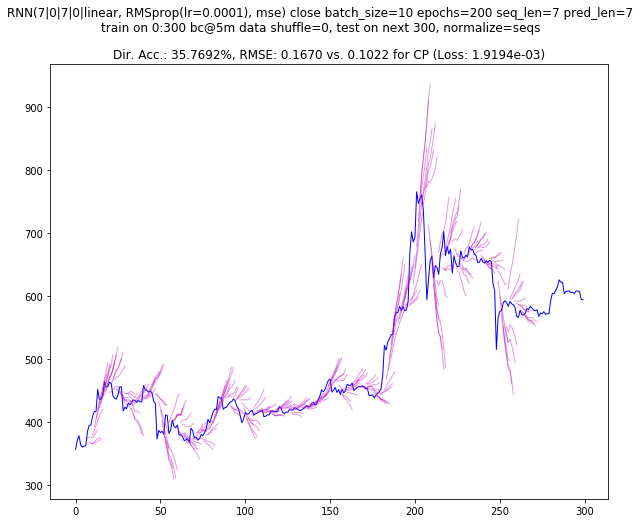

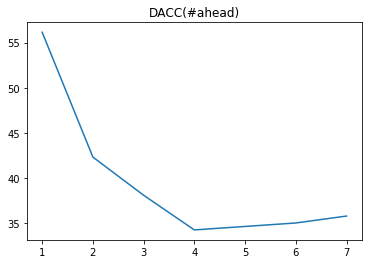

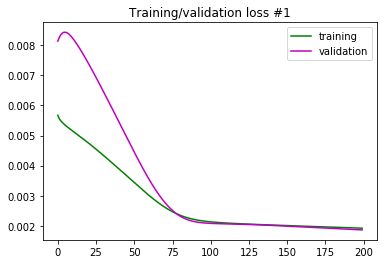

--- 81.078s to run experiment



In [55]:
with timing('run experiment'):
    res = run_walk_forward_validation_rnn(
        # data to extract:
        data24h,
        features=['close'],
        from_i=0,
        train_sz=300,
        test_sz=300,
        # data processing:
        normalize='seqs',  # 'seqs' | 'data'
        detrend=False,
        # model and prediction arrangement:
        seq_len=7,
        pred_len=7,
        model_maker=make_rnn_model_constructor(
            [7, 0, 7, 0],
            lr=1e-4,
        ),
        # training:
        epochs=200,
        batch_size=10,
        shuffle=False,
        # experiment setup:
        times=1,
        skip=False,
        fix_all_rngs_to=False,
        fix_rngs_before_each=False,
        # plotting:
        fig_size=(10, 8),
        fast=True,
    )
    plot_train_val_losses(res['train_val_losses'])

data ~ (600, 1)
--- 0.019s to model compilation time


--- Created model id: 140221159541904
Tensor("lstm_179_input:0", shape=(?, 7, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_179 (LSTM)              (None, 7, 7)              252       
_________________________________________________________________
lstm_180 (LSTM)              (None, 7)                 420       
_________________________________________________________________
dense_90 (Dense)             (None, 1)                 8         
Total params: 680
Trainable params: 680
Non-trainable params: 0
_________________________________________________________________
None
Tensor("dense_90/BiasAdd:0", shape=(?, 1), dtype=float32)

Train on 277 samples, validate on 15 samples
Epoch 1/60
277/277 [==============================] - 14s 51ms/step - loss: 0.0047 - val_loss: 0.0064
Epoch 2/60
277/277 [=========================

Train on 277 samples, validate on 15 samples
Epoch 1/60
277/277 [==============================] - 14s 52ms/step - loss: 0.0055 - val_loss: 0.0078
Epoch 2/60
277/277 [==============================] - 0s 980us/step - loss: 0.0054 - val_loss: 0.0079
Epoch 3/60
277/277 [==============================] - 0s 1ms/step - loss: 0.0053 - val_loss: 0.0080
Epoch 4/60
277/277 [==============================] - 0s 1ms/step - loss: 0.0053 - val_loss: 0.0081
Epoch 5/60
277/277 [==============================] - 0s 1ms/step - loss: 0.0052 - val_loss: 0.0081
Epoch 6/60
277/277 [==============================] - 0s 987us/step - loss: 0.0052 - val_loss: 0.0081
Epoch 7/60
277/277 [==============================] - 0s 1ms/step - loss: 0.0052 - val_loss: 0.0081
Epoch 8/60
277/277 [==============================] - 0s 1ms/step - loss: 0.0051 - val_loss: 0.0081
Epoch 9/60
277/277 [==============================] - 0s 1ms/step - loss: 0.0051 - val_loss: 0.0081
Epoch 10/60
277/277 [============================

277/277 [==============================] - 0s 1ms/step - loss: 0.0064 - val_loss: 0.0108
Epoch 7/60
277/277 [==============================] - 0s 1ms/step - loss: 0.0063 - val_loss: 0.0108
Epoch 8/60
277/277 [==============================] - 0s 1ms/step - loss: 0.0063 - val_loss: 0.0108
Epoch 9/60
277/277 [==============================] - 0s 1ms/step - loss: 0.0063 - val_loss: 0.0107
Epoch 10/60
277/277 [==============================] - 0s 1ms/step - loss: 0.0062 - val_loss: 0.0107
Epoch 11/60
277/277 [==============================] - 0s 1ms/step - loss: 0.0062 - val_loss: 0.0106
Epoch 12/60
277/277 [==============================] - 0s 1ms/step - loss: 0.0061 - val_loss: 0.0106
Epoch 13/60
277/277 [==============================] - 0s 1ms/step - loss: 0.0061 - val_loss: 0.0105
Epoch 14/60
277/277 [==============================] - 0s 1ms/step - loss: 0.0060 - val_loss: 0.0104
Epoch 15/60
277/277 [==============================] - 0s 1ms/step - loss: 0.0060 - val_loss: 0.0104
Epoch

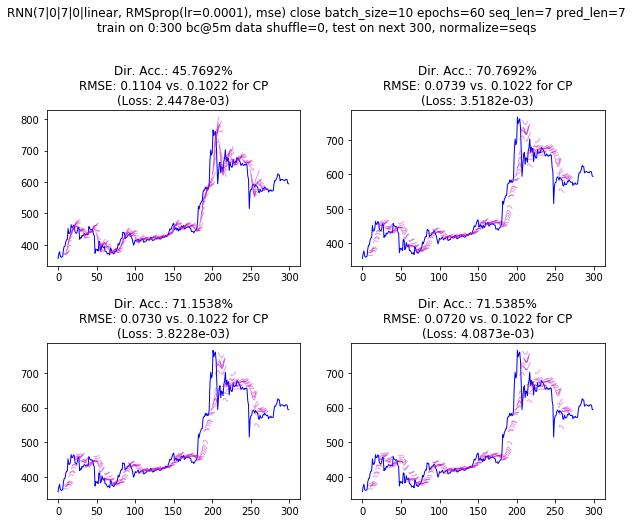

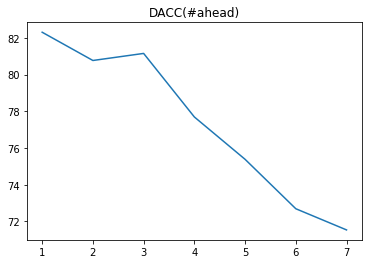

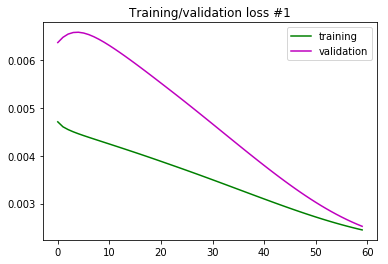

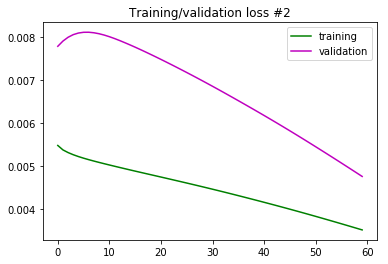

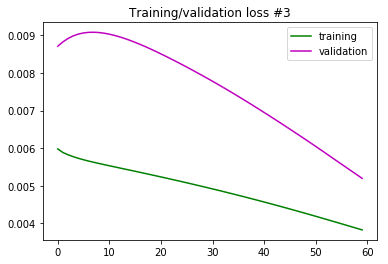

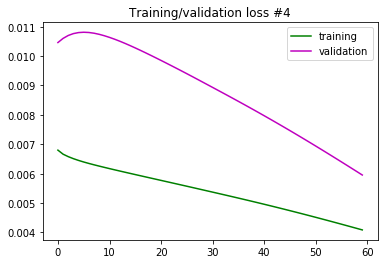

--- 166.952s to run experiment



In [57]:
with timing('run experiment'):
    res = run_walk_forward_validation_rnn(
        # data to extract:
        data24h,
        features=['close'],
        from_i=0,
        train_sz=300,
        test_sz=300,
        # data processing:
        normalize='seqs',  # 'seqs' | 'data'
        detrend=False,
        # model and prediction arrangement:
        seq_len=7,
        pred_len=7,
        model_maker=make_rnn_model_constructor(
            [7, 0, 7, 0],
            lr=1e-4,
        ),
        # training:
        epochs=60,
        batch_size=10,
        shuffle=False,
        # experiment setup:
        times=4,
        skip=False,
        fix_all_rngs_to=False,
        fix_rngs_before_each=False,
        # plotting:
        fig_size=(10, 8),
        fast=True,
    )
    plot_train_val_losses(res['train_val_losses'])

data ~ (600, 1)
--- 0.022s to model compilation time


--- Created model id: 140220913931600
Tensor("lstm_203_input:0", shape=(?, 7, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_203 (LSTM)              (None, 7, 7)              252       
_________________________________________________________________
lstm_204 (LSTM)              (None, 7)                 420       
_________________________________________________________________
dense_102 (Dense)            (None, 1)                 8         
Total params: 680
Trainable params: 680
Non-trainable params: 0
_________________________________________________________________
None
Tensor("dense_102/BiasAdd:0", shape=(?, 1), dtype=float32)

Train on 277 samples, validate on 15 samples
Epoch 1/40
277/277 [==============================] - 24s 85ms/step - loss: 0.0052 - val_loss: 0.0073
Epoch 2/40
277/277 [========================

277/277 [==============================] - 0s 1ms/step - loss: 0.0034 - val_loss: 0.0044
Epoch 38/40
277/277 [==============================] - 0s 1ms/step - loss: 0.0033 - val_loss: 0.0043
Epoch 39/40
277/277 [==============================] - 0s 1ms/step - loss: 0.0033 - val_loss: 0.0042
Epoch 40/40
277/277 [==============================] - 0s 1ms/step - loss: 0.0033 - val_loss: 0.0041
--- 30.755s to train model

> Predicting (now at 0)...
> Predicting (now at 10)...
> Predicting (now at 20)...
> Predicting (now at 30)...
> Predicting (now at 40)...
> Predicting (now at 50)...
> Predicting (now at 60)...
> Predicting (now at 70)...
> Predicting (now at 80)...
> Predicting (now at 90)...
> Predicting (now at 100)...
> Predicting (now at 110)...
> Predicting (now at 120)...
> Predicting (now at 130)...
> Predicting (now at 140)...
> Predicting (now at 150)...
> Predicting (now at 160)...
> Predicting (now at 170)...
> Predicting (now at 180)...
> Predicting (now at 190)...
> Predictin

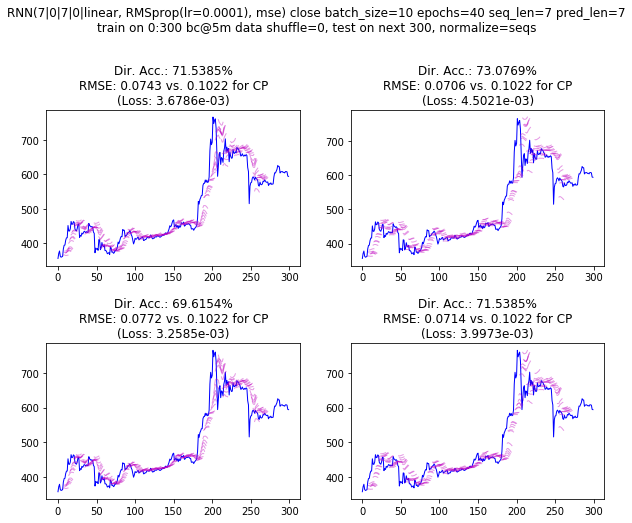

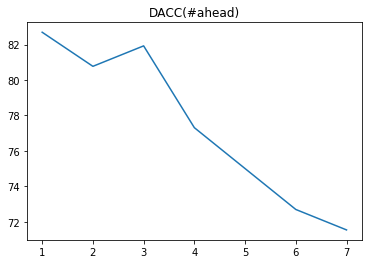

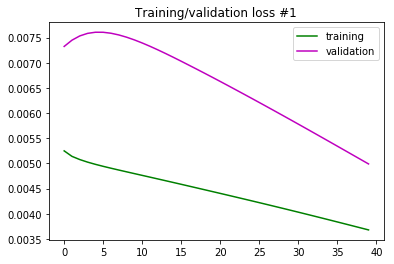

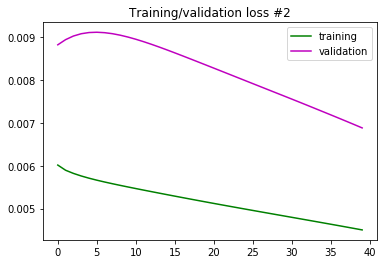

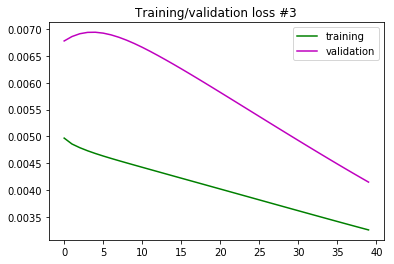

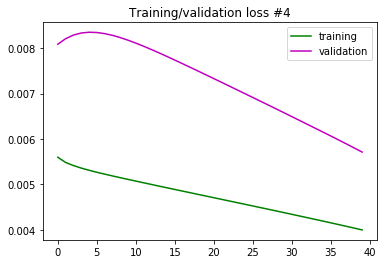

--- 162.962s to run experiment



In [60]:
with timing('run experiment'):
    res = run_walk_forward_validation_rnn(
        # data to extract:
        data24h,
        features=['close'],
        from_i=0,
        train_sz=300,
        test_sz=300,
        # data processing:
        normalize='seqs',  # 'seqs' | 'data'
        detrend=False,
        # model and prediction arrangement:
        seq_len=7,
        pred_len=7,
        model_maker=make_rnn_model_constructor(
            [7, 0, 7, 0],
            lr=1e-4,
        ),
        # training:
        epochs=40,
        batch_size=10,
        shuffle=False,
        # experiment setup:
        times=4,
        skip=False,
        fix_all_rngs_to=False,
        fix_rngs_before_each=False,
        # plotting:
        fig_size=(10, 8),
        fast=True,
    )
    plot_train_val_losses(res['train_val_losses'])

#### add dropout

data ~ (600, 1)
--- 0.019s to model compilation time


--- Created model id: 140220822748048
Tensor("lstm_217_input:0", shape=(?, 7, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_217 (LSTM)              (None, 7, 7)              252       
_________________________________________________________________
dropout_33 (Dropout)         (None, 7, 7)              0         
_________________________________________________________________
lstm_218 (LSTM)              (None, 7)                 420       
_________________________________________________________________
dropout_34 (Dropout)         (None, 7)                 0         
_________________________________________________________________
dense_109 (Dense)            (None, 1)                 8         
Total params: 680
Trainable params: 680
Non-trainable params: 0
__________________________________________________________

Epoch 149/150
277/277 [==============================] - 0s 1ms/step - loss: 0.0022 - val_loss: 0.0020
Epoch 150/150
277/277 [==============================] - 0s 1ms/step - loss: 0.0024 - val_loss: 0.0020
--- 67.555s to train model

> Predicting (now at 0)...
> Predicting (now at 10)...
> Predicting (now at 20)...
> Predicting (now at 30)...
> Predicting (now at 40)...
> Predicting (now at 50)...
> Predicting (now at 60)...
> Predicting (now at 70)...
> Predicting (now at 80)...
> Predicting (now at 90)...
> Predicting (now at 100)...
> Predicting (now at 110)...
> Predicting (now at 120)...
> Predicting (now at 130)...
> Predicting (now at 140)...
> Predicting (now at 150)...
> Predicting (now at 160)...
> Predicting (now at 170)...
> Predicting (now at 180)...
> Predicting (now at 190)...
> Predicting (now at 200)...
> Predicting (now at 210)...
> Predicting (now at 220)...
> Predicting (now at 230)...
> Predicting (now at 240)...
> Predicting (now at 250)...
--- 7.441s to walk and 

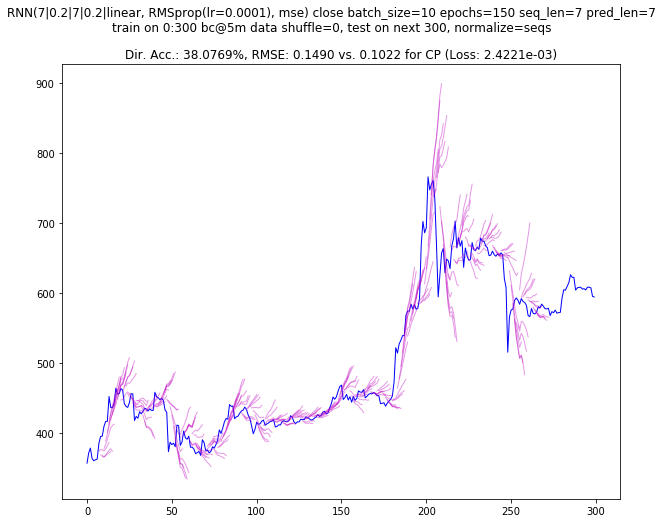

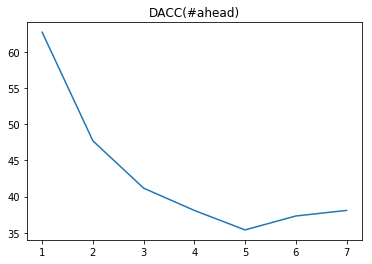

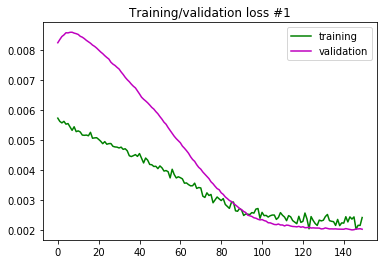

--- 76.437s to run experiment



In [63]:
with timing('run experiment'):
    res = run_walk_forward_validation_rnn(
        # data to extract:
        data24h,
        features=['close'],
        from_i=0,
        train_sz=300,
        test_sz=300,
        # data processing:
        normalize='seqs',  # 'seqs' | 'data'
        detrend=False,
        # model and prediction arrangement:
        seq_len=7,
        pred_len=7,
        model_maker=make_rnn_model_constructor(
            [7, 0.2, 7, 0.2],
            lr=1e-4,
        ),
        # training:
        epochs=150,
        batch_size=10,
        shuffle=False,
        # experiment setup:
        times=1,
        skip=False,
        fix_all_rngs_to=False,
        fix_rngs_before_each=False,
        # plotting:
        fig_size=(10, 8),
        fast=True,
    )
    plot_train_val_losses(res['train_val_losses'])

data ~ (600, 1)
--- 0.019s to model compilation time


--- Created model id: 140220578299088
Tensor("lstm_239_input:0", shape=(?, 7, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_239 (LSTM)              (None, 7, 7)              252       
_________________________________________________________________
dropout_55 (Dropout)         (None, 7, 7)              0         
_________________________________________________________________
lstm_240 (LSTM)              (None, 7)                 420       
_________________________________________________________________
dropout_56 (Dropout)         (None, 7)                 0         
_________________________________________________________________
dense_120 (Dense)            (None, 1)                 8         
Total params: 680
Trainable params: 680
Non-trainable params: 0
__________________________________________________________

Epoch 149/150
277/277 [==============================] - 0s 1ms/step - loss: 0.0020 - val_loss: 0.0020
Epoch 150/150
277/277 [==============================] - 0s 1ms/step - loss: 0.0022 - val_loss: 0.0020
--- 70.911s to train model

> Predicting (now at 0)...
> Predicting (now at 10)...
> Predicting (now at 20)...
> Predicting (now at 30)...
> Predicting (now at 40)...
> Predicting (now at 50)...
> Predicting (now at 60)...
> Predicting (now at 70)...
> Predicting (now at 80)...
> Predicting (now at 90)...
> Predicting (now at 100)...
> Predicting (now at 110)...
> Predicting (now at 120)...
> Predicting (now at 130)...
> Predicting (now at 140)...
> Predicting (now at 150)...
> Predicting (now at 160)...
> Predicting (now at 170)...
> Predicting (now at 180)...
> Predicting (now at 190)...
> Predicting (now at 200)...
> Predicting (now at 210)...
> Predicting (now at 220)...
> Predicting (now at 230)...
> Predicting (now at 240)...
> Predicting (now at 250)...
--- 8.497s to walk and 

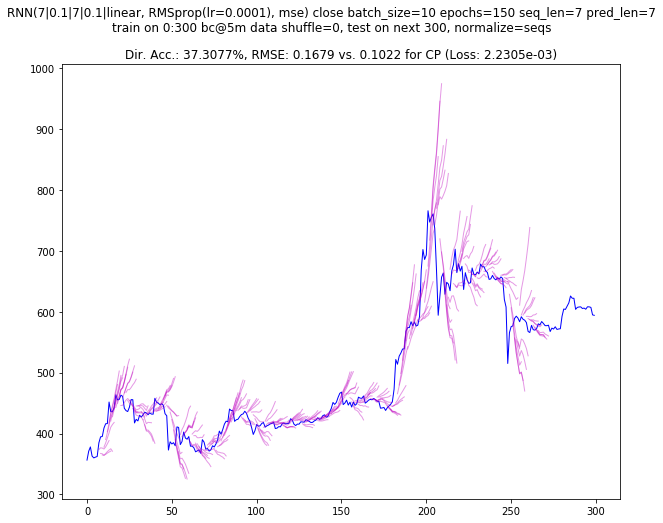

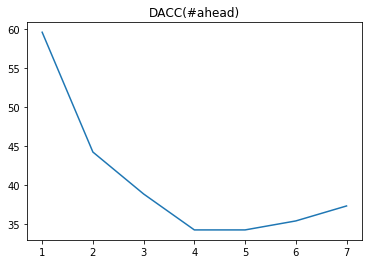

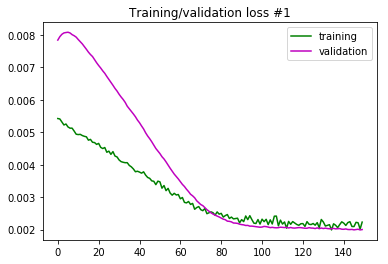

--- 80.891s to run experiment



In [68]:
with timing('run experiment'):
    res = run_walk_forward_validation_rnn(
        # data to extract:
        data24h,
        features=['close'],
        from_i=0,
        train_sz=300,
        test_sz=300,
        # data processing:
        normalize='seqs',  # 'seqs' | 'data'
        detrend=False,
        # model and prediction arrangement:
        seq_len=7,
        pred_len=7,
        model_maker=make_rnn_model_constructor(
            [7, 0.1, 7, 0.1],
            lr=1e-4,
        ),
        # training:
        epochs=150,
        batch_size=10,
        shuffle=False,
        # experiment setup:
        times=1,
        skip=False,
        fix_all_rngs_to=False,
        fix_rngs_before_each=False,
        # plotting:
        fig_size=(10, 8),
        fast=True,
    )
    plot_train_val_losses(res['train_val_losses'])

data ~ (600, 1)
--- 0.020s to model compilation time


--- Created model id: 140220667856912
Tensor("lstm_231_input:0", shape=(?, 7, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_231 (LSTM)              (None, 7, 7)              252       
_________________________________________________________________
dropout_47 (Dropout)         (None, 7, 7)              0         
_________________________________________________________________
lstm_232 (LSTM)              (None, 7)                 420       
_________________________________________________________________
dropout_48 (Dropout)         (None, 7)                 0         
_________________________________________________________________
dense_116 (Dense)            (None, 1)                 8         
Total params: 680
Trainable params: 680
Non-trainable params: 0
__________________________________________________________

277/277 [==============================] - 0s 1ms/step - loss: 0.0047 - val_loss: 0.0071
Epoch 20/45
277/277 [==============================] - 0s 1ms/step - loss: 0.0046 - val_loss: 0.0070
Epoch 21/45
277/277 [==============================] - 0s 1ms/step - loss: 0.0046 - val_loss: 0.0069
Epoch 22/45
277/277 [==============================] - 0s 1ms/step - loss: 0.0045 - val_loss: 0.0069
Epoch 23/45
277/277 [==============================] - 0s 1ms/step - loss: 0.0046 - val_loss: 0.0068
Epoch 24/45
277/277 [==============================] - 0s 1ms/step - loss: 0.0044 - val_loss: 0.0067
Epoch 25/45
277/277 [==============================] - 0s 1ms/step - loss: 0.0044 - val_loss: 0.0066
Epoch 26/45
277/277 [==============================] - 0s 1ms/step - loss: 0.0044 - val_loss: 0.0066
Epoch 27/45
277/277 [==============================] - 0s 1ms/step - loss: 0.0045 - val_loss: 0.0065
Epoch 28/45
277/277 [==============================] - 0s 1ms/step - loss: 0.0043 - val_loss: 0.0064
Ep

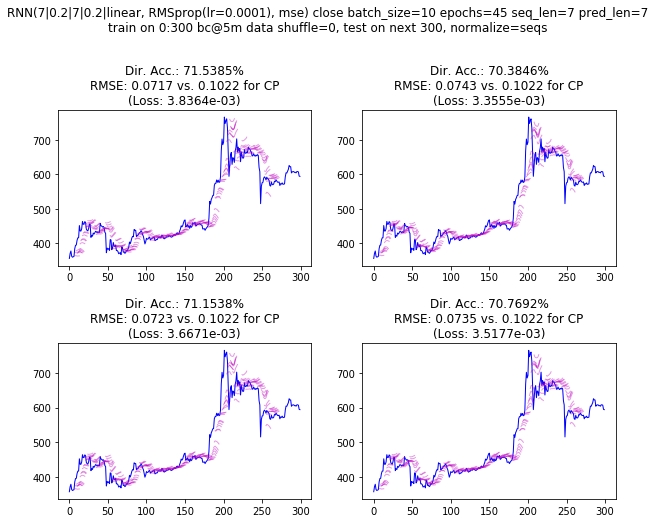

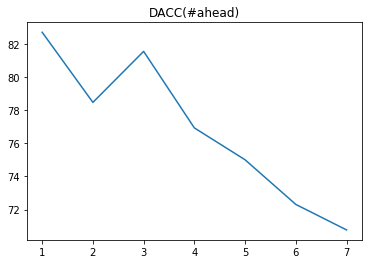

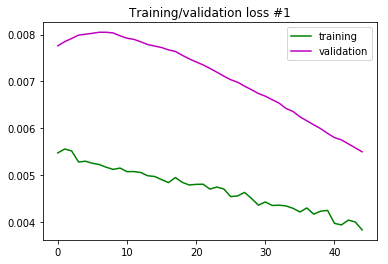

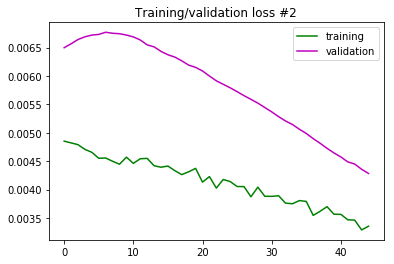

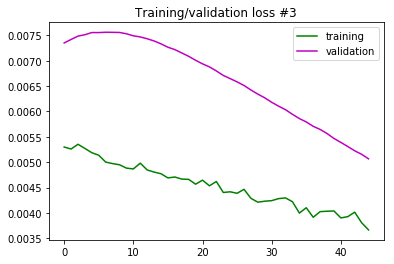

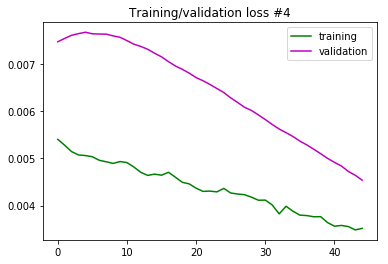

--- 182.017s to run experiment



In [67]:
with timing('run experiment'):
    res = run_walk_forward_validation_rnn(
        # data to extract:
        data24h,
        features=['close'],
        from_i=0,
        train_sz=300,
        test_sz=300,
        # data processing:
        normalize='seqs',  # 'seqs' | 'data'
        detrend=False,
        # model and prediction arrangement:
        seq_len=7,
        pred_len=7,
        model_maker=make_rnn_model_constructor(
            [7, 0.2, 7, 0.2],
            lr=1e-4,
        ),
        # training:
        epochs=45,
        batch_size=10,
        shuffle=False,
        # experiment setup:
        times=4,
        skip=False,
        fix_all_rngs_to=False,
        fix_rngs_before_each=False,
        # plotting:
        fig_size=(10, 8),
        fast=True,
    )
    plot_train_val_losses(res['train_val_losses'])

data ~ (600, 1)
--- 0.019s to model compilation time


--- Created model id: 140220531214800
Tensor("lstm_243_input:0", shape=(?, 7, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_243 (LSTM)              (None, 7, 7)              252       
_________________________________________________________________
dropout_59 (Dropout)         (None, 7, 7)              0         
_________________________________________________________________
lstm_244 (LSTM)              (None, 7)                 420       
_________________________________________________________________
dropout_60 (Dropout)         (None, 7)                 0         
_________________________________________________________________
dense_122 (Dense)            (None, 1)                 8         
Total params: 680
Trainable params: 680
Non-trainable params: 0
__________________________________________________________

277/277 [==============================] - 0s 1ms/step - loss: 0.0047 - val_loss: 0.0072
Epoch 20/45
277/277 [==============================] - 0s 1ms/step - loss: 0.0046 - val_loss: 0.0072
Epoch 21/45
277/277 [==============================] - 0s 1ms/step - loss: 0.0047 - val_loss: 0.0071
Epoch 22/45
277/277 [==============================] - 0s 1ms/step - loss: 0.0046 - val_loss: 0.0070
Epoch 23/45
277/277 [==============================] - 0s 1ms/step - loss: 0.0045 - val_loss: 0.0069
Epoch 24/45
277/277 [==============================] - 0s 1ms/step - loss: 0.0046 - val_loss: 0.0069
Epoch 25/45
277/277 [==============================] - 0s 1ms/step - loss: 0.0045 - val_loss: 0.0068
Epoch 26/45
277/277 [==============================] - 0s 1ms/step - loss: 0.0045 - val_loss: 0.0067
Epoch 27/45
277/277 [==============================] - 0s 1ms/step - loss: 0.0043 - val_loss: 0.0066
Epoch 28/45
277/277 [==============================] - 0s 1ms/step - loss: 0.0044 - val_loss: 0.0066
Ep

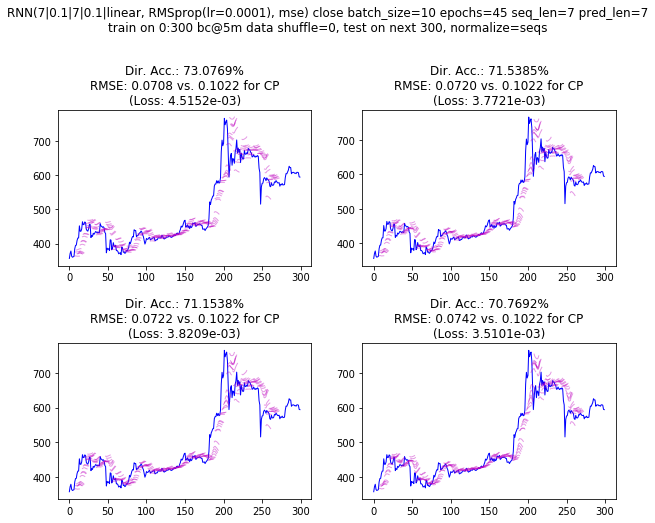

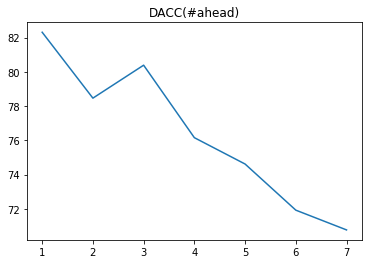

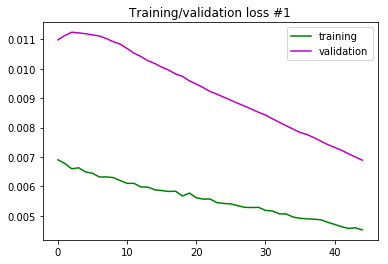

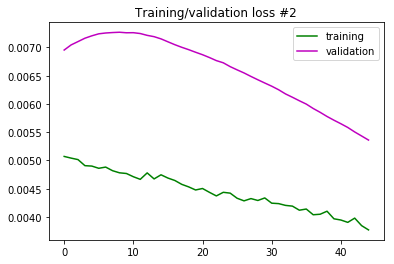

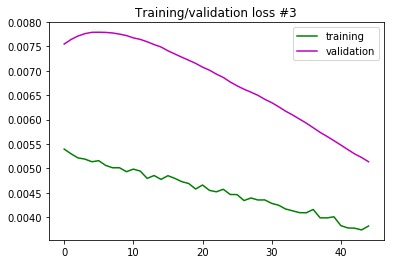

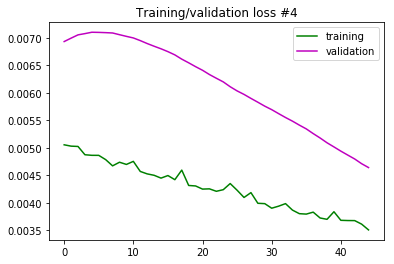

--- 316.223s to run experiment



In [70]:
with timing('run experiment'):
    res = run_walk_forward_validation_rnn(
        # data to extract:
        data24h,
        features=['close'],
        from_i=0,
        train_sz=300,
        test_sz=300,
        # data processing:
        normalize='seqs',  # 'seqs' | 'data'
        detrend=False,
        # model and prediction arrangement:
        seq_len=7,
        pred_len=7,
        model_maker=make_rnn_model_constructor(
            [7, 0.1, 7, 0.1],
            lr=1e-4,
        ),
        # training:
        epochs=45,
        batch_size=10,
        shuffle=False,
        # experiment setup:
        times=4,
        skip=False,
        fix_all_rngs_to=False,
        fix_rngs_before_each=False,
        # plotting:
        fig_size=(10, 8),
        fast=True,
    )
    plot_train_val_losses(res['train_val_losses'])

data ~ (600, 1)
--- 0.020s to model compilation time


--- Created model id: 140220524987664
Tensor("lstm_253_input:0", shape=(?, 7, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_253 (LSTM)              (None, 7, 7)              252       
_________________________________________________________________
dropout_69 (Dropout)         (None, 7, 7)              0         
_________________________________________________________________
lstm_254 (LSTM)              (None, 7)                 420       
_________________________________________________________________
dropout_70 (Dropout)         (None, 7)                 0         
_________________________________________________________________
dense_127 (Dense)            (None, 1)                 8         
Total params: 680
Trainable params: 680
Non-trainable params: 0
__________________________________________________________

277/277 [==============================] - 0s 1ms/step - loss: 0.0050 - val_loss: 0.0078
Epoch 20/45
277/277 [==============================] - 0s 1ms/step - loss: 0.0050 - val_loss: 0.0077
Epoch 21/45
277/277 [==============================] - 0s 1ms/step - loss: 0.0050 - val_loss: 0.0077
Epoch 22/45
277/277 [==============================] - 0s 1ms/step - loss: 0.0048 - val_loss: 0.0076
Epoch 23/45
277/277 [==============================] - 0s 1ms/step - loss: 0.0048 - val_loss: 0.0075
Epoch 24/45
277/277 [==============================] - 0s 1ms/step - loss: 0.0049 - val_loss: 0.0075
Epoch 25/45
277/277 [==============================] - 0s 1ms/step - loss: 0.0048 - val_loss: 0.0074
Epoch 26/45
277/277 [==============================] - 0s 1ms/step - loss: 0.0048 - val_loss: 0.0073
Epoch 27/45
277/277 [==============================] - 0s 1ms/step - loss: 0.0047 - val_loss: 0.0073
Epoch 28/45
277/277 [==============================] - 0s 1ms/step - loss: 0.0048 - val_loss: 0.0072
Ep

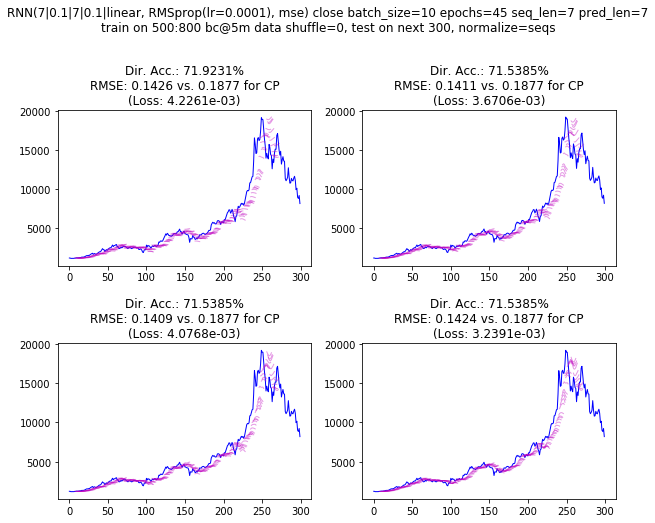

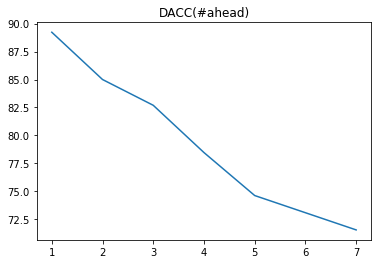

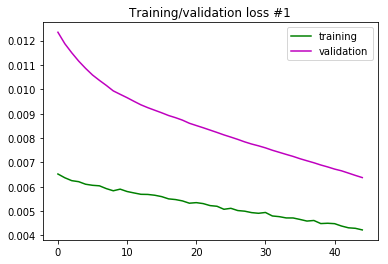

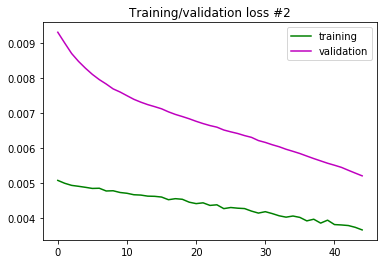

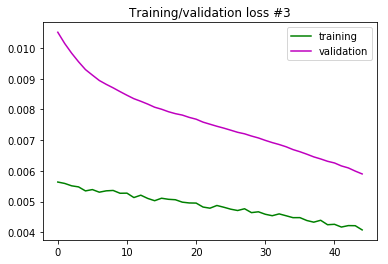

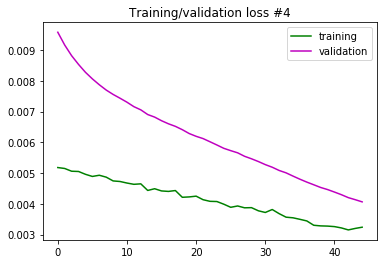

--- 200.965s to run experiment



In [72]:
with timing('run experiment'):
    res = run_walk_forward_validation_rnn(
        # data to extract:
        data24h,
        features=['close'],
        from_i=500,
        train_sz=300,
        test_sz=300,
        # data processing:
        normalize='seqs',  # 'seqs' | 'data'
        detrend=False,
        # model and prediction arrangement:
        seq_len=7,
        pred_len=7,
        model_maker=make_rnn_model_constructor(
            [7, 0.1, 7, 0.1],
            lr=1e-4,
        ),
        # training:
        epochs=45,
        batch_size=10,
        shuffle=False,
        # experiment setup:
        times=4,
        skip=False,
        fix_all_rngs_to=False,
        fix_rngs_before_each=False,
        # plotting:
        fig_size=(10, 8),
        fast=True,
    )
    plot_train_val_losses(res['train_val_losses'])

#### batch_sz=32

data ~ (600, 1)
--- 0.016s to model compilation time


--- Created model id: 139625385221712
Tensor("lstm_3_input:0", shape=(?, 7, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_3 (LSTM)                (None, 7, 7)              252       
_________________________________________________________________
dropout_3 (Dropout)          (None, 7, 7)              0         
_________________________________________________________________
lstm_4 (LSTM)                (None, 7)                 420       
_________________________________________________________________
dropout_4 (Dropout)          (None, 7)                 0         
_________________________________________________________________
dense_2 (Dense)              (None, 1)                 8         
Total params: 680
Trainable params: 680
Non-trainable params: 0
____________________________________________________________

277/277 [==============================] - 0s 680us/step - loss: 0.0042 - val_loss: 0.0065
Epoch 146/300
277/277 [==============================] - 0s 720us/step - loss: 0.0042 - val_loss: 0.0065
Epoch 147/300
277/277 [==============================] - 0s 733us/step - loss: 0.0043 - val_loss: 0.0065
Epoch 148/300
277/277 [==============================] - 0s 684us/step - loss: 0.0042 - val_loss: 0.0064
Epoch 149/300
277/277 [==============================] - 0s 703us/step - loss: 0.0042 - val_loss: 0.0064
Epoch 150/300
277/277 [==============================] - 0s 681us/step - loss: 0.0043 - val_loss: 0.0064
Epoch 151/300
277/277 [==============================] - 0s 725us/step - loss: 0.0042 - val_loss: 0.0064
Epoch 152/300
277/277 [==============================] - 0s 681us/step - loss: 0.0042 - val_loss: 0.0063
Epoch 153/300
277/277 [==============================] - 0s 705us/step - loss: 0.0042 - val_loss: 0.0063
Epoch 154/300
277/277 [==============================] - 0s 730us/ste

--- 61.850s to train model

> Predicting (now at 0)...
> Predicting (now at 32)...
> Predicting (now at 64)...
> Predicting (now at 96)...
> Predicting (now at 128)...
> Predicting (now at 160)...
> Predicting (now at 192)...
--- 0.406s to walk and predict

--- 0.446s to plot incremental predictions



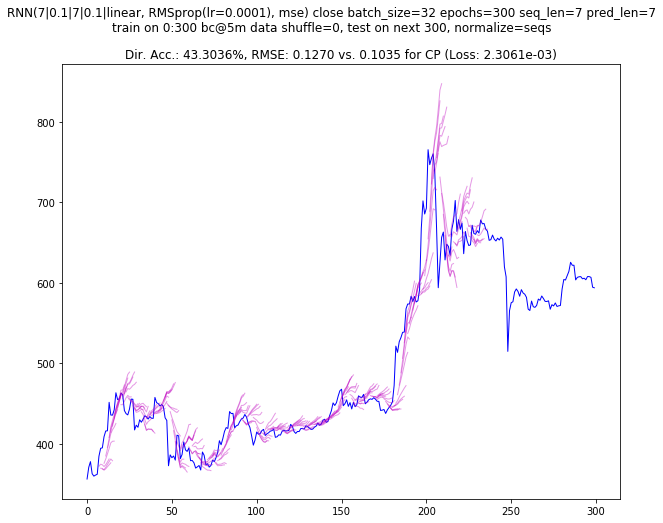

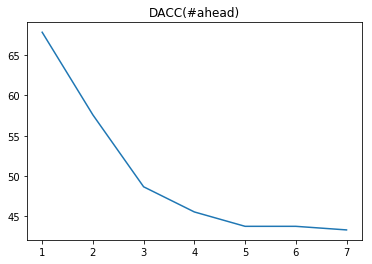

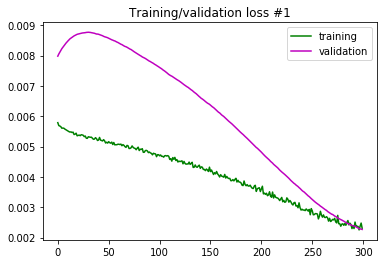

--- 63.416s to run experiment



In [4]:
with timing('run experiment'):
    res = run_walk_forward_validation_rnn(
        # data to extract:
        data24h,
        features=['close'],
        from_i=0,
        train_sz=300,
        test_sz=300,
        # data processing:
        normalize='seqs',  # 'seqs' | 'data'
        detrend=False,
        # model and prediction arrangement:
        seq_len=7,
        pred_len=7,
        model_maker=make_rnn_model_constructor(
            [7, 0.1, 7, 0.1],
            lr=1e-4,
        ),
        # training:
        epochs=300,
        batch_size=32,
        shuffle=False,
        # experiment setup:
        times=1,
        skip=False,
        fix_all_rngs_to=False,
        fix_rngs_before_each=False,
        # plotting:
        fig_size=(10, 8),
        fast=True,
    )
    plot_train_val_losses(res['train_val_losses'])

data ~ (600, 1)
--- 0.020s to model compilation time


--- Created model id: 140220244024912
Tensor("lstm_287_input:0", shape=(?, 7, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_287 (LSTM)              (None, 7, 7)              252       
_________________________________________________________________
dropout_103 (Dropout)        (None, 7, 7)              0         
_________________________________________________________________
lstm_288 (LSTM)              (None, 7)                 420       
_________________________________________________________________
dropout_104 (Dropout)        (None, 7)                 0         
_________________________________________________________________
dense_144 (Dense)            (None, 1)                 8         
Total params: 680
Trainable params: 680
Non-trainable params: 0
__________________________________________________________

Epoch 68/100
277/277 [==============================] - 0s 423us/step - loss: 0.0047 - val_loss: 0.0077
Epoch 69/100
277/277 [==============================] - 0s 442us/step - loss: 0.0047 - val_loss: 0.0077
Epoch 70/100
277/277 [==============================] - 0s 433us/step - loss: 0.0047 - val_loss: 0.0077
Epoch 71/100
277/277 [==============================] - 0s 434us/step - loss: 0.0047 - val_loss: 0.0077
Epoch 72/100
277/277 [==============================] - 0s 419us/step - loss: 0.0047 - val_loss: 0.0076
Epoch 73/100
277/277 [==============================] - 0s 445us/step - loss: 0.0048 - val_loss: 0.0076
Epoch 74/100
277/277 [==============================] - 0s 442us/step - loss: 0.0047 - val_loss: 0.0076
Epoch 75/100
277/277 [==============================] - 0s 473us/step - loss: 0.0046 - val_loss: 0.0076
Epoch 76/100
277/277 [==============================] - 0s 441us/step - loss: 0.0047 - val_loss: 0.0075
Epoch 77/100
277/277 [==============================] - 0s 471us

277/277 [==============================] - 0s 419us/step - loss: 0.0056 - val_loss: 0.0095
Epoch 33/100
277/277 [==============================] - 0s 427us/step - loss: 0.0056 - val_loss: 0.0095
Epoch 34/100
277/277 [==============================] - 0s 434us/step - loss: 0.0056 - val_loss: 0.0095
Epoch 35/100
277/277 [==============================] - 0s 431us/step - loss: 0.0056 - val_loss: 0.0095
Epoch 36/100
277/277 [==============================] - 0s 422us/step - loss: 0.0055 - val_loss: 0.0095
Epoch 37/100
277/277 [==============================] - 0s 430us/step - loss: 0.0056 - val_loss: 0.0094
Epoch 38/100
277/277 [==============================] - 0s 422us/step - loss: 0.0056 - val_loss: 0.0094
Epoch 39/100
277/277 [==============================] - 0s 425us/step - loss: 0.0056 - val_loss: 0.0094
Epoch 40/100
277/277 [==============================] - 0s 427us/step - loss: 0.0055 - val_loss: 0.0094
Epoch 41/100
277/277 [==============================] - 0s 435us/step - loss:

Train on 277 samples, validate on 15 samples
Epoch 1/100
277/277 [==============================] - 24s 88ms/step - loss: 0.0072 - val_loss: 0.0108
Epoch 2/100
277/277 [==============================] - 0s 445us/step - loss: 0.0071 - val_loss: 0.0109
Epoch 3/100
277/277 [==============================] - 0s 466us/step - loss: 0.0071 - val_loss: 0.0110
Epoch 4/100
277/277 [==============================] - 0s 450us/step - loss: 0.0070 - val_loss: 0.0111
Epoch 5/100
277/277 [==============================] - 0s 446us/step - loss: 0.0070 - val_loss: 0.0112
Epoch 6/100
277/277 [==============================] - 0s 438us/step - loss: 0.0069 - val_loss: 0.0112
Epoch 7/100
277/277 [==============================] - 0s 437us/step - loss: 0.0068 - val_loss: 0.0113
Epoch 8/100
277/277 [==============================] - 0s 433us/step - loss: 0.0069 - val_loss: 0.0113
Epoch 9/100
277/277 [==============================] - 0s 452us/step - loss: 0.0069 - val_loss: 0.0114
Epoch 10/100
277/277 [======

277/277 [==============================] - 1s 4ms/step - loss: 0.0059 - val_loss: 0.0102
Epoch 44/100
277/277 [==============================] - 0s 305us/step - loss: 0.0059 - val_loss: 0.0102
Epoch 45/100
277/277 [==============================] - 0s 437us/step - loss: 0.0058 - val_loss: 0.0102
Epoch 46/100
277/277 [==============================] - 0s 486us/step - loss: 0.0058 - val_loss: 0.0101
Epoch 47/100
277/277 [==============================] - 0s 446us/step - loss: 0.0058 - val_loss: 0.0101
Epoch 48/100
277/277 [==============================] - 0s 464us/step - loss: 0.0058 - val_loss: 0.0101
Epoch 49/100
277/277 [==============================] - 0s 454us/step - loss: 0.0058 - val_loss: 0.0100
Epoch 50/100
277/277 [==============================] - 0s 448us/step - loss: 0.0057 - val_loss: 0.0100
Epoch 51/100
277/277 [==============================] - 0s 460us/step - loss: 0.0058 - val_loss: 0.0100
Epoch 52/100
277/277 [==============================] - 0s 470us/step - loss: 0

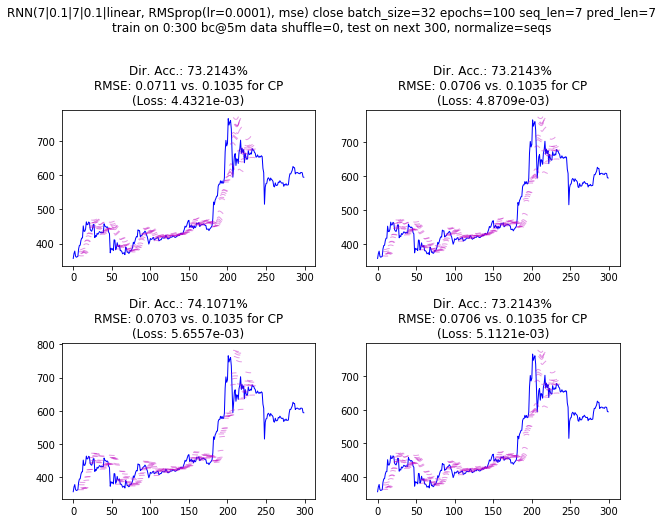

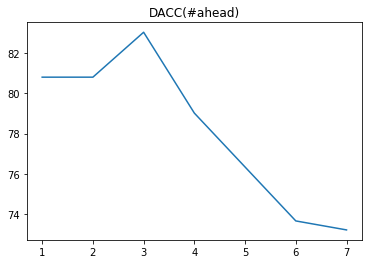

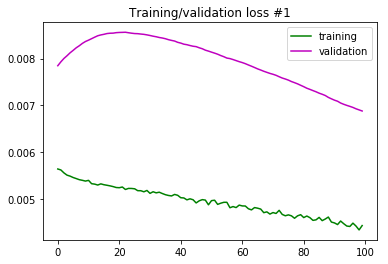

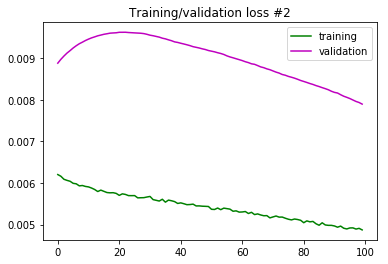

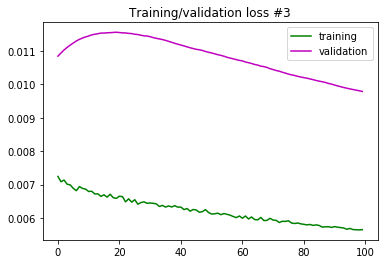

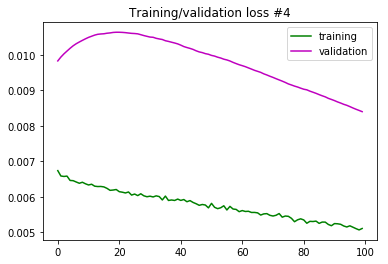

--- 411.606s to run experiment



In [82]:
with timing('run experiment'):
    res = run_walk_forward_validation_rnn(
        # data to extract:
        data24h,
        features=['close'],
        from_i=0,
        train_sz=300,
        test_sz=300,
        # data processing:
        normalize='seqs',  # 'seqs' | 'data'
        detrend=False,
        # model and prediction arrangement:
        seq_len=7,
        pred_len=7,
        model_maker=make_rnn_model_constructor(
            [7, 0.1, 7, 0.1],
            lr=1e-4,
        ),
        # training:
        epochs=100,
        batch_size=32,
        shuffle=False,
        # experiment setup:
        times=4,
        skip=False,
        fix_all_rngs_to=False,
        fix_rngs_before_each=False,
        # plotting:
        fig_size=(10, 8),
        fast=True,
    )
    plot_train_val_losses(res['train_val_losses'])

data ~ (600, 1)
--- 0.015s to model compilation time


--- Created model id: 140697288193552
Tensor("lstm_45_input:0", shape=(?, 7, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_45 (LSTM)               (None, 7, 7)              252       
_________________________________________________________________
dropout_45 (Dropout)         (None, 7, 7)              0         
_________________________________________________________________
lstm_46 (LSTM)               (None, 7)                 420       
_________________________________________________________________
dropout_46 (Dropout)         (None, 7)                 0         
_________________________________________________________________
dense_23 (Dense)             (None, 1)                 8         
Total params: 680
Trainable params: 680
Non-trainable params: 0
___________________________________________________________

Epoch 43/90
262/262 [==============================] - 0s 715us/step - loss: 0.0030 - val_loss: 0.0205
Epoch 44/90
262/262 [==============================] - 0s 710us/step - loss: 0.0030 - val_loss: 0.0204
Epoch 45/90
262/262 [==============================] - 0s 720us/step - loss: 0.0030 - val_loss: 0.0204
Epoch 46/90
262/262 [==============================] - 0s 729us/step - loss: 0.0030 - val_loss: 0.0203
Epoch 47/90
262/262 [==============================] - 0s 739us/step - loss: 0.0030 - val_loss: 0.0202
Epoch 48/90
262/262 [==============================] - 0s 768us/step - loss: 0.0030 - val_loss: 0.0202
Epoch 49/90
262/262 [==============================] - 0s 787us/step - loss: 0.0030 - val_loss: 0.0201
Epoch 50/90
262/262 [==============================] - 0s 727us/step - loss: 0.0030 - val_loss: 0.0201
Epoch 51/90
262/262 [==============================] - 0s 756us/step - loss: 0.0030 - val_loss: 0.0200
Epoch 52/90
262/262 [==============================] - 0s 764us/step - lo

Train on 262 samples, validate on 30 samples
Epoch 1/90
262/262 [==============================] - 4s 17ms/step - loss: 0.0038 - val_loss: 0.0261
Epoch 2/90
262/262 [==============================] - 0s 758us/step - loss: 0.0037 - val_loss: 0.0259
Epoch 3/90
262/262 [==============================] - 0s 736us/step - loss: 0.0037 - val_loss: 0.0256
Epoch 4/90
262/262 [==============================] - 0s 866us/step - loss: 0.0036 - val_loss: 0.0254
Epoch 5/90
262/262 [==============================] - 0s 762us/step - loss: 0.0037 - val_loss: 0.0252
Epoch 6/90
262/262 [==============================] - 0s 775us/step - loss: 0.0036 - val_loss: 0.0250
Epoch 7/90
262/262 [==============================] - 0s 788us/step - loss: 0.0035 - val_loss: 0.0248
Epoch 8/90
262/262 [==============================] - 0s 768us/step - loss: 0.0036 - val_loss: 0.0246
Epoch 9/90
262/262 [==============================] - 0s 818us/step - loss: 0.0035 - val_loss: 0.0244
Epoch 10/90
262/262 [=================

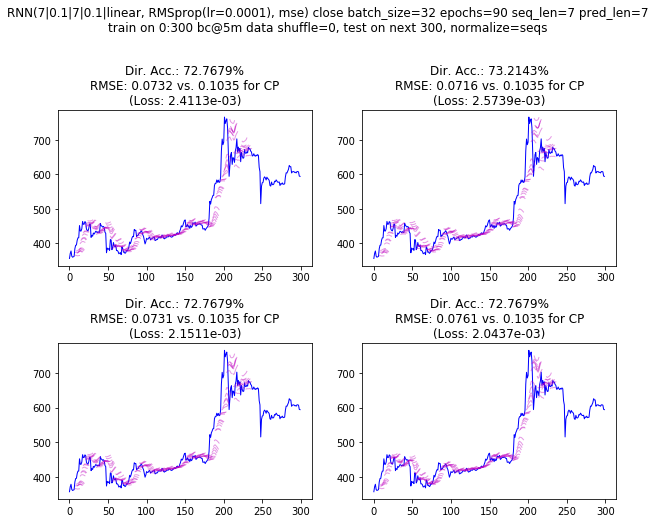

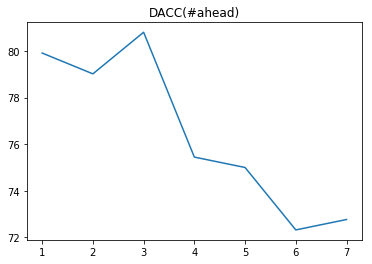

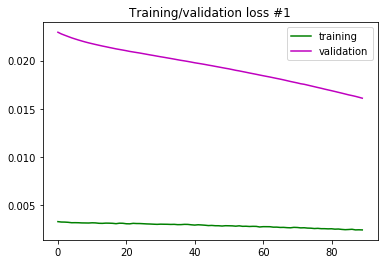

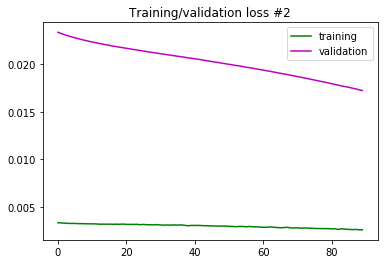

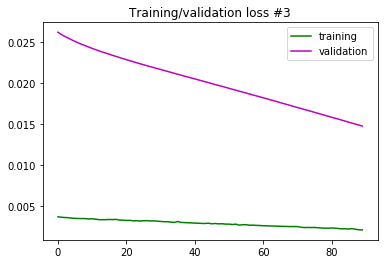

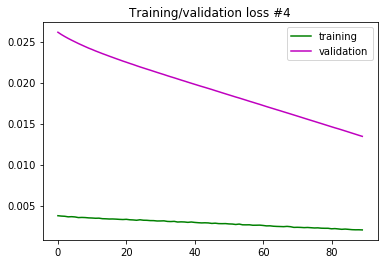

--- 104.120s to run experiment



In [16]:
### recheck above
with timing('run experiment'):
    res = run_walk_forward_validation_rnn(
        # data to extract:
        data24h,
        features=['close'],
        from_i=0,
        train_sz=300,
        test_sz=300,
        # data processing:
        normalize='seqs',  # 'seqs' | 'data'
        detrend=False,
        # model and prediction arrangement:
        seq_len=7,
        pred_len=7,
        model_maker=make_rnn_model_constructor(
            [7, 0.1, 7, 0.1],
            lr=1e-4,
        ),
        # training:
        epochs=90,
        batch_size=32,
        shuffle=False,
        # experiment setup:
        times=4,
        skip=False,
        fix_all_rngs_to=False,
        fix_rngs_before_each=False,
        # plotting:
        fig_size=(10, 8),
        fast=True,
    )
    plot_train_val_losses(res['train_val_losses'])

data ~ (600, 1)
--- 0.014s to model compilation time


--- Created model id: 139626438632720
Tensor("lstm_1_input:0", shape=(?, 7, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 7, 7)              252       
_________________________________________________________________
dropout_1 (Dropout)          (None, 7, 7)              0         
_________________________________________________________________
lstm_2 (LSTM)                (None, 7)                 420       
_________________________________________________________________
dropout_2 (Dropout)          (None, 7)                 0         
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 8         
Total params: 680
Trainable params: 680
Non-trainable params: 0
____________________________________________________________

Epoch 68/100
277/277 [==============================] - 0s 698us/step - loss: 0.0038 - val_loss: 0.0059
Epoch 69/100
277/277 [==============================] - 0s 696us/step - loss: 0.0038 - val_loss: 0.0058
Epoch 70/100
277/277 [==============================] - 0s 733us/step - loss: 0.0038 - val_loss: 0.0058
Epoch 71/100
277/277 [==============================] - 0s 697us/step - loss: 0.0037 - val_loss: 0.0057
Epoch 72/100
277/277 [==============================] - 0s 687us/step - loss: 0.0037 - val_loss: 0.0057
Epoch 73/100
277/277 [==============================] - 0s 741us/step - loss: 0.0037 - val_loss: 0.0056
Epoch 74/100
277/277 [==============================] - 0s 694us/step - loss: 0.0038 - val_loss: 0.0056
Epoch 75/100
277/277 [==============================] - 0s 673us/step - loss: 0.0036 - val_loss: 0.0056
Epoch 76/100
277/277 [==============================] - 0s 653us/step - loss: 0.0036 - val_loss: 0.0055
Epoch 77/100
277/277 [==============================] - 0s 663us

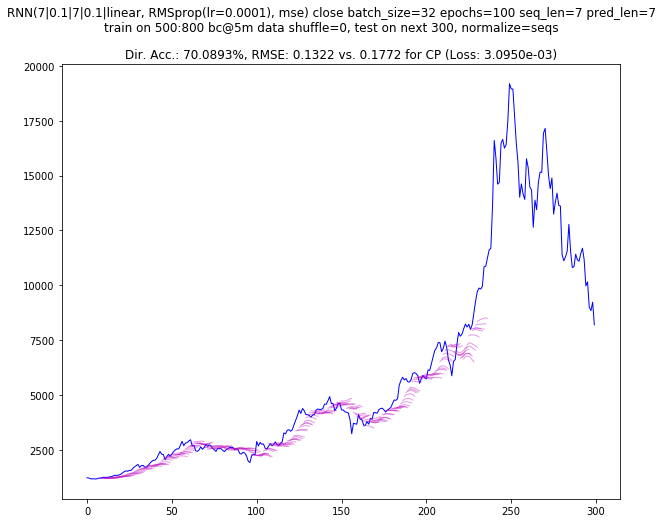

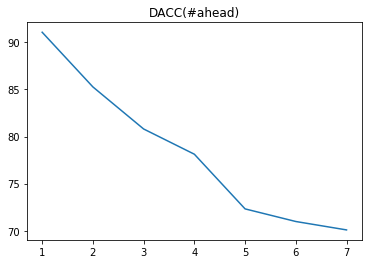

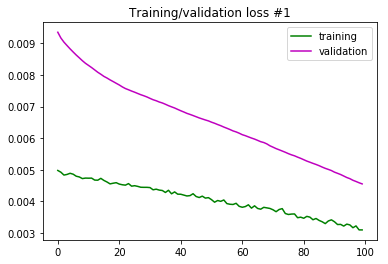

--- 24.904s to run experiment



In [3]:
with timing('run experiment'):
    res = run_walk_forward_validation_rnn(
        # data to extract:
        data24h,
        features=['close'],
        from_i=500,
        train_sz=300,
        test_sz=300,
        # data processing:
        normalize='seqs',  # 'seqs' | 'data'
        detrend=False,
        # model and prediction arrangement:
        seq_len=7,
        pred_len=7,
        model_maker=make_rnn_model_constructor(
            [7, 0.1, 7, 0.1],
            lr=1e-4,
        ),
        # training:
        epochs=100,
        batch_size=32,
        shuffle=False,
        # experiment setup:
        times=1,
        skip=False,
        fix_all_rngs_to=False,
        fix_rngs_before_each=False,
        # plotting:
        fig_size=(10, 8),
        fast=True,
    )
    plot_train_val_losses(res['train_val_losses'])

#### batch_sz=64

data ~ (600, 1)
--- 0.015s to model compilation time


--- Created model id: 139624574199504
Tensor("lstm_7_input:0", shape=(?, 7, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_7 (LSTM)                (None, 7, 7)              252       
_________________________________________________________________
dropout_7 (Dropout)          (None, 7, 7)              0         
_________________________________________________________________
lstm_8 (LSTM)                (None, 7)                 420       
_________________________________________________________________
dropout_8 (Dropout)          (None, 7)                 0         
_________________________________________________________________
dense_4 (Dense)              (None, 1)                 8         
Total params: 680
Trainable params: 680
Non-trainable params: 0
____________________________________________________________

Epoch 68/600
277/277 [==============================] - 0s 388us/step - loss: 0.0044 - val_loss: 0.0074
Epoch 69/600
277/277 [==============================] - 0s 447us/step - loss: 0.0044 - val_loss: 0.0074
Epoch 70/600
277/277 [==============================] - 0s 402us/step - loss: 0.0043 - val_loss: 0.0074
Epoch 71/600
277/277 [==============================] - 0s 407us/step - loss: 0.0043 - val_loss: 0.0074
Epoch 72/600
277/277 [==============================] - 0s 412us/step - loss: 0.0044 - val_loss: 0.0074
Epoch 73/600
277/277 [==============================] - 0s 416us/step - loss: 0.0043 - val_loss: 0.0073
Epoch 74/600
277/277 [==============================] - 0s 398us/step - loss: 0.0043 - val_loss: 0.0073
Epoch 75/600
277/277 [==============================] - 0s 397us/step - loss: 0.0043 - val_loss: 0.0073
Epoch 76/600
277/277 [==============================] - 0s 390us/step - loss: 0.0043 - val_loss: 0.0073
Epoch 77/600
277/277 [==============================] - 0s 408us

277/277 [==============================] - 0s 403us/step - loss: 0.0030 - val_loss: 0.0040
Epoch 225/600
277/277 [==============================] - 0s 411us/step - loss: 0.0029 - val_loss: 0.0040
Epoch 226/600
277/277 [==============================] - 0s 403us/step - loss: 0.0030 - val_loss: 0.0040
Epoch 227/600
277/277 [==============================] - 0s 389us/step - loss: 0.0030 - val_loss: 0.0039
Epoch 228/600
277/277 [==============================] - 0s 404us/step - loss: 0.0030 - val_loss: 0.0039
Epoch 229/600
277/277 [==============================] - 0s 397us/step - loss: 0.0030 - val_loss: 0.0039
Epoch 230/600
277/277 [==============================] - 0s 402us/step - loss: 0.0029 - val_loss: 0.0039
Epoch 231/600
277/277 [==============================] - 0s 385us/step - loss: 0.0030 - val_loss: 0.0039
Epoch 232/600
277/277 [==============================] - 0s 388us/step - loss: 0.0030 - val_loss: 0.0038
Epoch 233/600
277/277 [==============================] - 0s 429us/ste

277/277 [==============================] - 0s 416us/step - loss: 0.0022 - val_loss: 0.0018
Epoch 381/600
277/277 [==============================] - 0s 412us/step - loss: 0.0021 - val_loss: 0.0018
Epoch 382/600
277/277 [==============================] - 0s 408us/step - loss: 0.0021 - val_loss: 0.0018
Epoch 383/600
277/277 [==============================] - 0s 399us/step - loss: 0.0020 - val_loss: 0.0018
Epoch 384/600
277/277 [==============================] - 0s 417us/step - loss: 0.0020 - val_loss: 0.0018
Epoch 385/600
277/277 [==============================] - 0s 391us/step - loss: 0.0019 - val_loss: 0.0018
Epoch 386/600
277/277 [==============================] - 0s 414us/step - loss: 0.0020 - val_loss: 0.0018
Epoch 387/600
277/277 [==============================] - 0s 405us/step - loss: 0.0022 - val_loss: 0.0018
Epoch 388/600
277/277 [==============================] - 0s 429us/step - loss: 0.0022 - val_loss: 0.0018
Epoch 389/600
277/277 [==============================] - 0s 436us/ste

277/277 [==============================] - 0s 449us/step - loss: 0.0018 - val_loss: 0.0017
Epoch 537/600
277/277 [==============================] - 0s 383us/step - loss: 0.0019 - val_loss: 0.0017
Epoch 538/600
277/277 [==============================] - 0s 400us/step - loss: 0.0021 - val_loss: 0.0017
Epoch 539/600
277/277 [==============================] - 0s 388us/step - loss: 0.0021 - val_loss: 0.0017
Epoch 540/600
277/277 [==============================] - 0s 392us/step - loss: 0.0019 - val_loss: 0.0017
Epoch 541/600
277/277 [==============================] - 0s 412us/step - loss: 0.0019 - val_loss: 0.0017
Epoch 542/600
277/277 [==============================] - 0s 397us/step - loss: 0.0019 - val_loss: 0.0017
Epoch 543/600
277/277 [==============================] - 0s 411us/step - loss: 0.0020 - val_loss: 0.0017
Epoch 544/600
277/277 [==============================] - 0s 412us/step - loss: 0.0019 - val_loss: 0.0017
Epoch 545/600
277/277 [==============================] - 0s 414us/ste

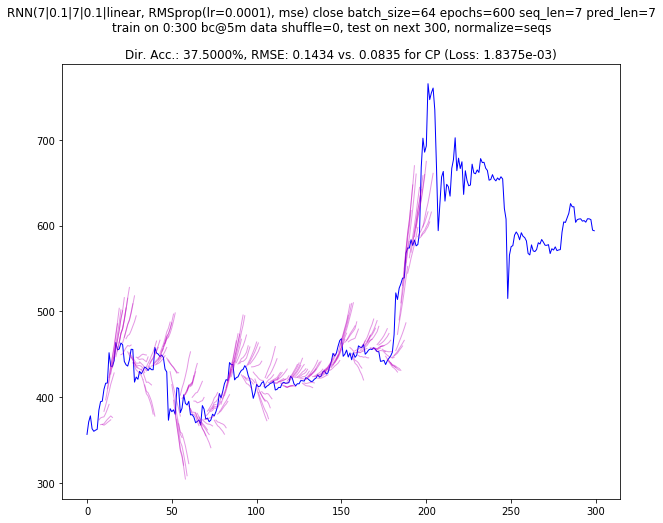

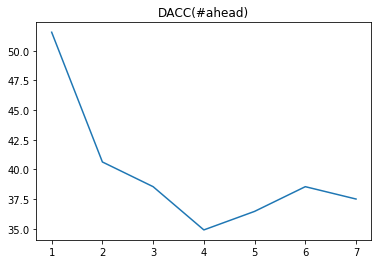

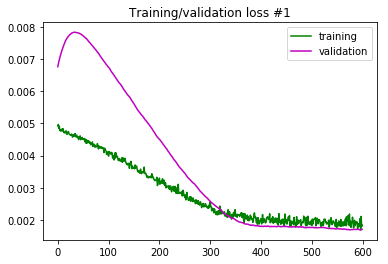

--- 72.756s to run experiment



In [6]:
with timing('run experiment'):
    res = run_walk_forward_validation_rnn(
        # data to extract:
        data24h,
        features=['close'],
        from_i=0,
        train_sz=300,
        test_sz=300,
        # data processing:
        normalize='seqs',  # 'seqs' | 'data'
        detrend=False,
        # model and prediction arrangement:
        seq_len=7,
        pred_len=7,
        model_maker=make_rnn_model_constructor(
            [7, 0.1, 7, 0.1],
            lr=1e-4,
        ),
        # training:
        epochs=600,
        batch_size=64,
        shuffle=False,
        # experiment setup:
        times=1,
        skip=False,
        fix_all_rngs_to=False,
        fix_rngs_before_each=False,
        # plotting:
        fig_size=(10, 8),
        fast=True,
    )
    plot_train_val_losses(res['train_val_losses'])

data ~ (600, 1)
--- 0.015s to model compilation time


--- Created model id: 139624238375056
Tensor("lstm_11_input:0", shape=(?, 7, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_11 (LSTM)               (None, 7, 7)              252       
_________________________________________________________________
dropout_11 (Dropout)         (None, 7, 7)              0         
_________________________________________________________________
lstm_12 (LSTM)               (None, 7)                 420       
_________________________________________________________________
dropout_12 (Dropout)         (None, 7)                 0         
_________________________________________________________________
dense_6 (Dense)              (None, 1)                 8         
Total params: 680
Trainable params: 680
Non-trainable params: 0
___________________________________________________________

Epoch 68/200
277/277 [==============================] - 0s 389us/step - loss: 0.0052 - val_loss: 0.0096
Epoch 69/200
277/277 [==============================] - 0s 397us/step - loss: 0.0053 - val_loss: 0.0096
Epoch 70/200
277/277 [==============================] - 0s 400us/step - loss: 0.0052 - val_loss: 0.0096
Epoch 71/200
277/277 [==============================] - 0s 400us/step - loss: 0.0053 - val_loss: 0.0096
Epoch 72/200
277/277 [==============================] - 0s 406us/step - loss: 0.0052 - val_loss: 0.0095
Epoch 73/200
277/277 [==============================] - 0s 401us/step - loss: 0.0052 - val_loss: 0.0095
Epoch 74/200
277/277 [==============================] - 0s 408us/step - loss: 0.0052 - val_loss: 0.0095
Epoch 75/200
277/277 [==============================] - 0s 406us/step - loss: 0.0052 - val_loss: 0.0095
Epoch 76/200
277/277 [==============================] - 0s 399us/step - loss: 0.0052 - val_loss: 0.0095
Epoch 77/200
277/277 [==============================] - 0s 404us

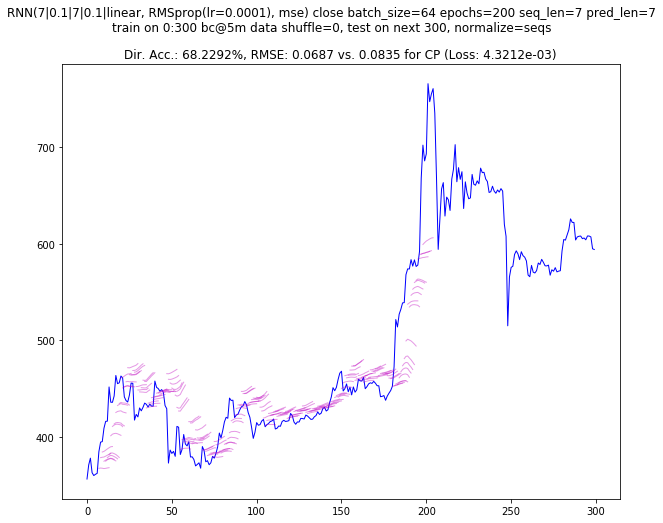

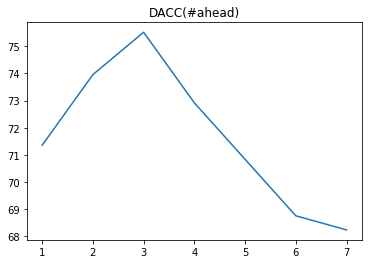

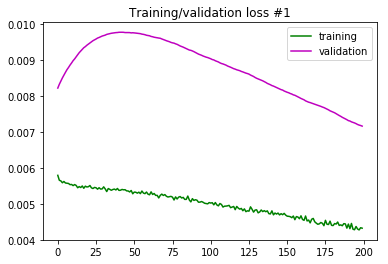

--- 27.259s to run experiment



In [8]:
with timing('run experiment'):
    res = run_walk_forward_validation_rnn(
        # data to extract:
        data24h,
        features=['close'],
        from_i=0,
        train_sz=300,
        test_sz=300,
        # data processing:
        normalize='seqs',  # 'seqs' | 'data'
        detrend=False,
        # model and prediction arrangement:
        seq_len=7,
        pred_len=7,
        model_maker=make_rnn_model_constructor(
            [7, 0.1, 7, 0.1],
            lr=1e-4,
        ),
        # training:
        epochs=200,
        batch_size=64,
        shuffle=False,
        # experiment setup:
        times=1,
        skip=False,
        fix_all_rngs_to=False,
        fix_rngs_before_each=False,
        # plotting:
        fig_size=(10, 8),
        fast=True,
    )
    plot_train_val_losses(res['train_val_losses'])

#### batch_sz=128

data ~ (600, 1)
--- 0.015s to model compilation time


--- Created model id: 139624123922320
Tensor("lstm_15_input:0", shape=(?, 7, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_15 (LSTM)               (None, 7, 7)              252       
_________________________________________________________________
dropout_15 (Dropout)         (None, 7, 7)              0         
_________________________________________________________________
lstm_16 (LSTM)               (None, 7)                 420       
_________________________________________________________________
dropout_16 (Dropout)         (None, 7)                 0         
_________________________________________________________________
dense_8 (Dense)              (None, 1)                 8         
Total params: 680
Trainable params: 680
Non-trainable params: 0
___________________________________________________________

277/277 [==============================] - 0s 264us/step - loss: 0.0057 - val_loss: 0.0110
Epoch 145/1200
277/277 [==============================] - 0s 248us/step - loss: 0.0056 - val_loss: 0.0110
Epoch 146/1200
277/277 [==============================] - 0s 257us/step - loss: 0.0055 - val_loss: 0.0110
Epoch 147/1200
277/277 [==============================] - 0s 244us/step - loss: 0.0056 - val_loss: 0.0110
Epoch 148/1200
277/277 [==============================] - 0s 243us/step - loss: 0.0056 - val_loss: 0.0109
Epoch 149/1200
277/277 [==============================] - 0s 237us/step - loss: 0.0055 - val_loss: 0.0109
Epoch 150/1200
277/277 [==============================] - 0s 243us/step - loss: 0.0056 - val_loss: 0.0109
Epoch 151/1200
277/277 [==============================] - 0s 249us/step - loss: 0.0055 - val_loss: 0.0109
Epoch 152/1200
277/277 [==============================] - 0s 241us/step - loss: 0.0055 - val_loss: 0.0109
Epoch 153/1200
277/277 [==============================] - 0s 

277/277 [==============================] - 0s 260us/step - loss: 0.0046 - val_loss: 0.0083
Epoch 299/1200
277/277 [==============================] - 0s 253us/step - loss: 0.0045 - val_loss: 0.0083
Epoch 300/1200
277/277 [==============================] - 0s 240us/step - loss: 0.0046 - val_loss: 0.0082
Epoch 301/1200
277/277 [==============================] - 0s 241us/step - loss: 0.0045 - val_loss: 0.0082
Epoch 302/1200
277/277 [==============================] - 0s 248us/step - loss: 0.0046 - val_loss: 0.0082
Epoch 303/1200
277/277 [==============================] - 0s 254us/step - loss: 0.0046 - val_loss: 0.0082
Epoch 304/1200
277/277 [==============================] - 0s 259us/step - loss: 0.0045 - val_loss: 0.0082
Epoch 305/1200
277/277 [==============================] - 0s 256us/step - loss: 0.0045 - val_loss: 0.0082
Epoch 306/1200
277/277 [==============================] - 0s 235us/step - loss: 0.0046 - val_loss: 0.0081
Epoch 307/1200
277/277 [==============================] - 0s 

277/277 [==============================] - 0s 240us/step - loss: 0.0034 - val_loss: 0.0052
Epoch 453/1200
277/277 [==============================] - 0s 245us/step - loss: 0.0034 - val_loss: 0.0052
Epoch 454/1200
277/277 [==============================] - 0s 241us/step - loss: 0.0034 - val_loss: 0.0052
Epoch 455/1200
277/277 [==============================] - 0s 243us/step - loss: 0.0034 - val_loss: 0.0052
Epoch 456/1200
277/277 [==============================] - 0s 250us/step - loss: 0.0036 - val_loss: 0.0052
Epoch 457/1200
277/277 [==============================] - 0s 229us/step - loss: 0.0034 - val_loss: 0.0051
Epoch 458/1200
277/277 [==============================] - 0s 262us/step - loss: 0.0034 - val_loss: 0.0051
Epoch 459/1200
277/277 [==============================] - 0s 243us/step - loss: 0.0034 - val_loss: 0.0051
Epoch 460/1200
277/277 [==============================] - 0s 257us/step - loss: 0.0034 - val_loss: 0.0051
Epoch 461/1200
277/277 [==============================] - 0s 

277/277 [==============================] - 0s 263us/step - loss: 0.0025 - val_loss: 0.0027
Epoch 607/1200
277/277 [==============================] - 0s 257us/step - loss: 0.0024 - val_loss: 0.0027
Epoch 608/1200
277/277 [==============================] - 0s 250us/step - loss: 0.0024 - val_loss: 0.0027
Epoch 609/1200
277/277 [==============================] - 0s 259us/step - loss: 0.0025 - val_loss: 0.0027
Epoch 610/1200
277/277 [==============================] - 0s 257us/step - loss: 0.0024 - val_loss: 0.0027
Epoch 611/1200
277/277 [==============================] - 0s 254us/step - loss: 0.0024 - val_loss: 0.0026
Epoch 612/1200
277/277 [==============================] - 0s 253us/step - loss: 0.0023 - val_loss: 0.0026
Epoch 613/1200
277/277 [==============================] - 0s 267us/step - loss: 0.0025 - val_loss: 0.0026
Epoch 614/1200
277/277 [==============================] - 0s 247us/step - loss: 0.0024 - val_loss: 0.0026
Epoch 615/1200
277/277 [==============================] - 0s 

277/277 [==============================] - 0s 247us/step - loss: 0.0023 - val_loss: 0.0023
Epoch 761/1200
277/277 [==============================] - 0s 256us/step - loss: 0.0021 - val_loss: 0.0023
Epoch 762/1200
277/277 [==============================] - 0s 239us/step - loss: 0.0022 - val_loss: 0.0023
Epoch 763/1200
277/277 [==============================] - 0s 241us/step - loss: 0.0022 - val_loss: 0.0023
Epoch 764/1200
277/277 [==============================] - 0s 237us/step - loss: 0.0023 - val_loss: 0.0023
Epoch 765/1200
277/277 [==============================] - 0s 245us/step - loss: 0.0023 - val_loss: 0.0023
Epoch 766/1200
277/277 [==============================] - 0s 236us/step - loss: 0.0023 - val_loss: 0.0023
Epoch 767/1200
277/277 [==============================] - 0s 243us/step - loss: 0.0021 - val_loss: 0.0023
Epoch 768/1200
277/277 [==============================] - 0s 265us/step - loss: 0.0021 - val_loss: 0.0023
Epoch 769/1200
277/277 [==============================] - 0s 

277/277 [==============================] - 0s 242us/step - loss: 0.0021 - val_loss: 0.0023
Epoch 915/1200
277/277 [==============================] - 0s 246us/step - loss: 0.0021 - val_loss: 0.0023
Epoch 916/1200
277/277 [==============================] - 0s 241us/step - loss: 0.0019 - val_loss: 0.0023
Epoch 917/1200
277/277 [==============================] - 0s 240us/step - loss: 0.0022 - val_loss: 0.0023
Epoch 918/1200
277/277 [==============================] - 0s 274us/step - loss: 0.0020 - val_loss: 0.0023
Epoch 919/1200
277/277 [==============================] - 0s 245us/step - loss: 0.0020 - val_loss: 0.0024
Epoch 920/1200
277/277 [==============================] - 0s 242us/step - loss: 0.0022 - val_loss: 0.0024
Epoch 921/1200
277/277 [==============================] - 0s 256us/step - loss: 0.0022 - val_loss: 0.0023
Epoch 922/1200
277/277 [==============================] - 0s 249us/step - loss: 0.0022 - val_loss: 0.0023
Epoch 923/1200
277/277 [==============================] - 0s 

Epoch 1068/1200
277/277 [==============================] - 0s 265us/step - loss: 0.0021 - val_loss: 0.0024
Epoch 1069/1200
277/277 [==============================] - 0s 283us/step - loss: 0.0022 - val_loss: 0.0024
Epoch 1070/1200
277/277 [==============================] - 0s 252us/step - loss: 0.0021 - val_loss: 0.0024
Epoch 1071/1200
277/277 [==============================] - 0s 259us/step - loss: 0.0021 - val_loss: 0.0024
Epoch 1072/1200
277/277 [==============================] - 0s 266us/step - loss: 0.0019 - val_loss: 0.0024
Epoch 1073/1200
277/277 [==============================] - 0s 265us/step - loss: 0.0022 - val_loss: 0.0024
Epoch 1074/1200
277/277 [==============================] - 0s 267us/step - loss: 0.0020 - val_loss: 0.0024
Epoch 1075/1200
277/277 [==============================] - 0s 284us/step - loss: 0.0021 - val_loss: 0.0024
Epoch 1076/1200
277/277 [==============================] - 0s 247us/step - loss: 0.0021 - val_loss: 0.0024
Epoch 1077/1200
277/277 [============

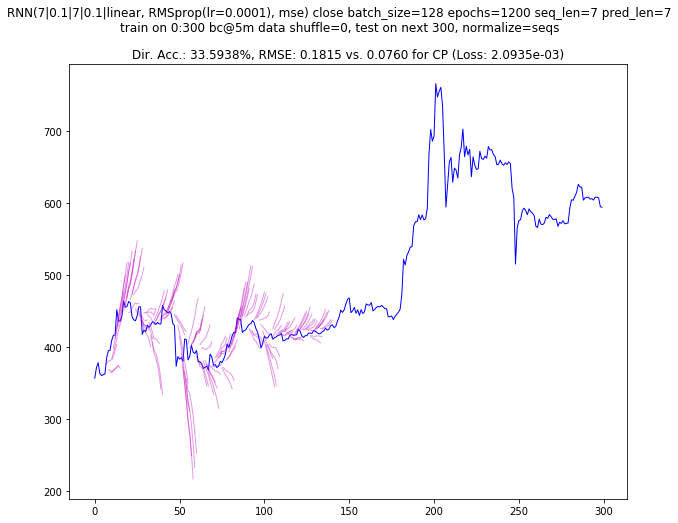

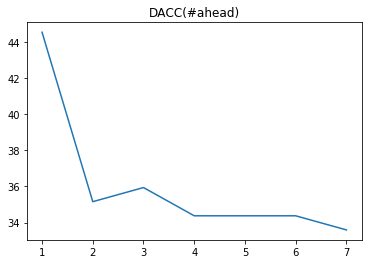

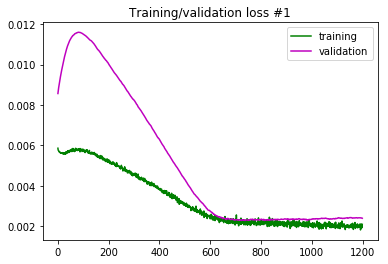

--- 90.837s to run experiment



In [10]:
with timing('run experiment'):
    res = run_walk_forward_validation_rnn(
        # data to extract:
        data24h,
        features=['close'],
        from_i=0,
        train_sz=300,
        test_sz=300,
        # data processing:
        normalize='seqs',  # 'seqs' | 'data'
        detrend=False,
        # model and prediction arrangement:
        seq_len=7,
        pred_len=7,
        model_maker=make_rnn_model_constructor(
            [7, 0.1, 7, 0.1],
            lr=1e-4,
        ),
        # training:
        epochs=1200,
        batch_size=128,
        shuffle=False,
        # experiment setup:
        times=1,
        skip=False,
        fix_all_rngs_to=False,
        fix_rngs_before_each=False,
        # plotting:
        fig_size=(10, 8),
        fast=True,
    )
    plot_train_val_losses(res['train_val_losses'])

data ~ (600, 1)
--- 0.015s to model compilation time


--- Created model id: 139624148048272
Tensor("lstm_17_input:0", shape=(?, 7, 1), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_17 (LSTM)               (None, 7, 7)              252       
_________________________________________________________________
dropout_17 (Dropout)         (None, 7, 7)              0         
_________________________________________________________________
lstm_18 (LSTM)               (None, 7)                 420       
_________________________________________________________________
dropout_18 (Dropout)         (None, 7)                 0         
_________________________________________________________________
dense_9 (Dense)              (None, 1)                 8         
Total params: 680
Trainable params: 680
Non-trainable params: 0
___________________________________________________________

Epoch 68/500
277/277 [==============================] - 0s 256us/step - loss: 0.0051 - val_loss: 0.0097
Epoch 69/500
277/277 [==============================] - 0s 261us/step - loss: 0.0051 - val_loss: 0.0098
Epoch 70/500
277/277 [==============================] - 0s 249us/step - loss: 0.0052 - val_loss: 0.0098
Epoch 71/500
277/277 [==============================] - 0s 266us/step - loss: 0.0051 - val_loss: 0.0098
Epoch 72/500
277/277 [==============================] - 0s 289us/step - loss: 0.0051 - val_loss: 0.0098
Epoch 73/500
277/277 [==============================] - 0s 244us/step - loss: 0.0052 - val_loss: 0.0098
Epoch 74/500
277/277 [==============================] - 0s 254us/step - loss: 0.0052 - val_loss: 0.0098
Epoch 75/500
277/277 [==============================] - 0s 255us/step - loss: 0.0051 - val_loss: 0.0098
Epoch 76/500
277/277 [==============================] - 0s 243us/step - loss: 0.0051 - val_loss: 0.0099
Epoch 77/500
277/277 [==============================] - 0s 249us

277/277 [==============================] - 0s 255us/step - loss: 0.0047 - val_loss: 0.0084
Epoch 225/500
277/277 [==============================] - 0s 248us/step - loss: 0.0045 - val_loss: 0.0083
Epoch 226/500
277/277 [==============================] - 0s 239us/step - loss: 0.0046 - val_loss: 0.0083
Epoch 227/500
277/277 [==============================] - 0s 245us/step - loss: 0.0046 - val_loss: 0.0083
Epoch 228/500
277/277 [==============================] - 0s 238us/step - loss: 0.0047 - val_loss: 0.0083
Epoch 229/500
277/277 [==============================] - 0s 256us/step - loss: 0.0046 - val_loss: 0.0083
Epoch 230/500
277/277 [==============================] - 0s 258us/step - loss: 0.0046 - val_loss: 0.0082
Epoch 231/500
277/277 [==============================] - 0s 258us/step - loss: 0.0045 - val_loss: 0.0082
Epoch 232/500
277/277 [==============================] - 0s 240us/step - loss: 0.0045 - val_loss: 0.0082
Epoch 233/500
277/277 [==============================] - 0s 237us/ste

277/277 [==============================] - 0s 257us/step - loss: 0.0036 - val_loss: 0.0054
Epoch 381/500
277/277 [==============================] - 0s 278us/step - loss: 0.0036 - val_loss: 0.0054
Epoch 382/500
277/277 [==============================] - 0s 261us/step - loss: 0.0035 - val_loss: 0.0054
Epoch 383/500
277/277 [==============================] - 0s 238us/step - loss: 0.0036 - val_loss: 0.0053
Epoch 384/500
277/277 [==============================] - 0s 259us/step - loss: 0.0034 - val_loss: 0.0053
Epoch 385/500
277/277 [==============================] - 0s 245us/step - loss: 0.0035 - val_loss: 0.0053
Epoch 386/500
277/277 [==============================] - 0s 239us/step - loss: 0.0034 - val_loss: 0.0053
Epoch 387/500
277/277 [==============================] - 0s 253us/step - loss: 0.0034 - val_loss: 0.0053
Epoch 388/500
277/277 [==============================] - 0s 252us/step - loss: 0.0034 - val_loss: 0.0053
Epoch 389/500
277/277 [==============================] - 0s 256us/ste

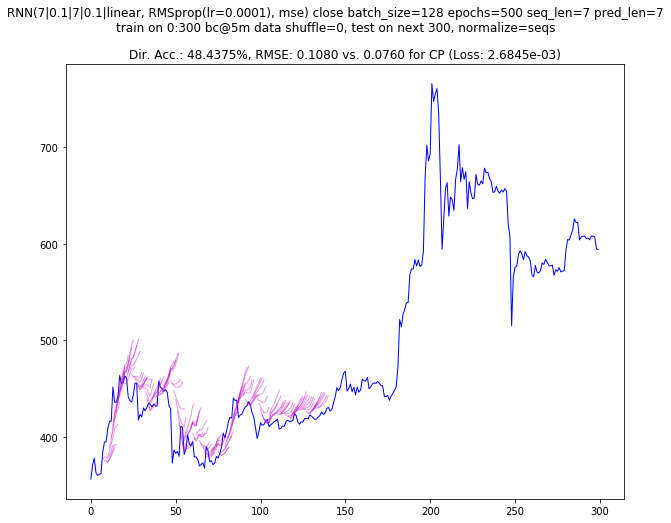

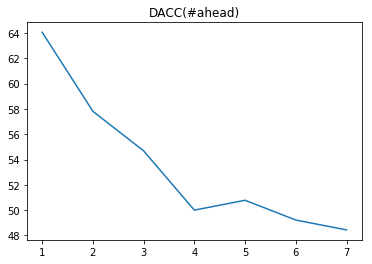

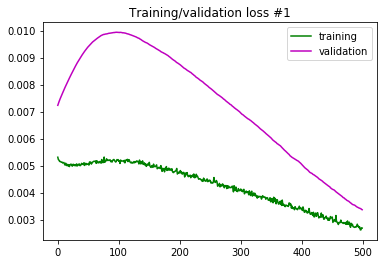

--- 40.545s to run experiment



In [11]:
with timing('run experiment'):
    res = run_walk_forward_validation_rnn(
        # data to extract:
        data24h,
        features=['close'],
        from_i=0,
        train_sz=300,
        test_sz=300,
        # data processing:
        normalize='seqs',  # 'seqs' | 'data'
        detrend=False,
        # model and prediction arrangement:
        seq_len=7,
        pred_len=7,
        model_maker=make_rnn_model_constructor(
            [7, 0.1, 7, 0.1],
            lr=1e-4,
        ),
        # training:
        epochs=500,
        batch_size=128,
        shuffle=False,
        # experiment setup:
        times=1,
        skip=False,
        fix_all_rngs_to=False,
        fix_rngs_before_each=False,
        # plotting:
        fig_size=(10, 8),
        fast=True,
    )
    plot_train_val_losses(res['train_val_losses'])

## +OHLV

Compare to: 72-74% for using "close" only (4.4e-3 - 5.5e-3 loss).

data ~ (600, 5)
--- 0.015s to model compilation time


--- Created model id: 139624010224144
Tensor("lstm_33_input:0", shape=(?, 7, 5), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_33 (LSTM)               (None, 7, 7)              364       
_________________________________________________________________
dropout_33 (Dropout)         (None, 7, 7)              0         
_________________________________________________________________
lstm_34 (LSTM)               (None, 7)                 420       
_________________________________________________________________
dropout_34 (Dropout)         (None, 7)                 0         
_________________________________________________________________
dense_17 (Dense)             (None, 1)                 8         
Total params: 792
Trainable params: 792
Non-trainable params: 0
___________________________________________________________

Epoch 68/600
277/277 [==============================] - 0s 768us/step - loss: 0.0039 - val_loss: 0.0042
Epoch 69/600
277/277 [==============================] - 0s 699us/step - loss: 0.0040 - val_loss: 0.0042
Epoch 70/600
277/277 [==============================] - 0s 724us/step - loss: 0.0037 - val_loss: 0.0042
Epoch 71/600
277/277 [==============================] - 0s 722us/step - loss: 0.0041 - val_loss: 0.0042
Epoch 72/600
277/277 [==============================] - 0s 785us/step - loss: 0.0040 - val_loss: 0.0041
Epoch 73/600
277/277 [==============================] - 0s 731us/step - loss: 0.0037 - val_loss: 0.0041
Epoch 74/600
277/277 [==============================] - 0s 721us/step - loss: 0.0038 - val_loss: 0.0041
Epoch 75/600
277/277 [==============================] - 0s 758us/step - loss: 0.0040 - val_loss: 0.0041
Epoch 76/600
277/277 [==============================] - 0s 709us/step - loss: 0.0045 - val_loss: 0.0040
Epoch 77/600
277/277 [==============================] - 0s 705us

277/277 [==============================] - 0s 690us/step - loss: 0.0028 - val_loss: 0.0026
Epoch 224/600
277/277 [==============================] - 0s 712us/step - loss: 0.0026 - val_loss: 0.0025
Epoch 225/600
277/277 [==============================] - 0s 721us/step - loss: 0.0027 - val_loss: 0.0025
Epoch 226/600
277/277 [==============================] - 0s 705us/step - loss: 0.0025 - val_loss: 0.0025
Epoch 227/600
277/277 [==============================] - 0s 703us/step - loss: 0.0024 - val_loss: 0.0025
Epoch 228/600
277/277 [==============================] - 0s 705us/step - loss: 0.0031 - val_loss: 0.0025
Epoch 229/600
277/277 [==============================] - 0s 702us/step - loss: 0.0026 - val_loss: 0.0026
Epoch 230/600
277/277 [==============================] - 0s 693us/step - loss: 0.0025 - val_loss: 0.0026
Epoch 231/600
277/277 [==============================] - 0s 731us/step - loss: 0.0027 - val_loss: 0.0026
Epoch 232/600
277/277 [==============================] - 0s 728us/ste

277/277 [==============================] - 0s 690us/step - loss: 0.0022 - val_loss: 0.0025
Epoch 380/600
277/277 [==============================] - 0s 724us/step - loss: 0.0023 - val_loss: 0.0025
Epoch 381/600
277/277 [==============================] - 0s 742us/step - loss: 0.0023 - val_loss: 0.0025
Epoch 382/600
277/277 [==============================] - 0s 737us/step - loss: 0.0026 - val_loss: 0.0025
Epoch 383/600
277/277 [==============================] - 0s 742us/step - loss: 0.0022 - val_loss: 0.0025
Epoch 384/600
277/277 [==============================] - 0s 704us/step - loss: 0.0024 - val_loss: 0.0025
Epoch 385/600
277/277 [==============================] - 0s 699us/step - loss: 0.0024 - val_loss: 0.0025
Epoch 386/600
277/277 [==============================] - 0s 715us/step - loss: 0.0024 - val_loss: 0.0025
Epoch 387/600
277/277 [==============================] - 0s 704us/step - loss: 0.0022 - val_loss: 0.0025
Epoch 388/600
277/277 [==============================] - 0s 703us/ste

Epoch 457/600
277/277 [==============================] - 0s 710us/step - loss: 0.0022 - val_loss: 0.0023
Epoch 458/600
277/277 [==============================] - 0s 710us/step - loss: 0.0020 - val_loss: 0.0024
Epoch 459/600
277/277 [==============================] - 0s 707us/step - loss: 0.0021 - val_loss: 0.0023
Epoch 460/600
277/277 [==============================] - 0s 722us/step - loss: 0.0023 - val_loss: 0.0024
Epoch 461/600
277/277 [==============================] - 0s 713us/step - loss: 0.0021 - val_loss: 0.0024
Epoch 462/600
277/277 [==============================] - 0s 716us/step - loss: 0.0022 - val_loss: 0.0024
Epoch 463/600
277/277 [==============================] - 0s 720us/step - loss: 0.0022 - val_loss: 0.0023
Epoch 464/600
277/277 [==============================] - 0s 732us/step - loss: 0.0022 - val_loss: 0.0023
Epoch 465/600
277/277 [==============================] - 0s 761us/step - loss: 0.0024 - val_loss: 0.0023
Epoch 466/600
277/277 [==============================] 

277/277 [==============================] - ETA: 0s - loss: 0.001 - 0s 718us/step - loss: 0.0022 - val_loss: 0.0022
Epoch 536/600
277/277 [==============================] - 0s 684us/step - loss: 0.0021 - val_loss: 0.0022
Epoch 537/600
277/277 [==============================] - 0s 717us/step - loss: 0.0022 - val_loss: 0.0022
Epoch 538/600
277/277 [==============================] - 0s 698us/step - loss: 0.0020 - val_loss: 0.0022
Epoch 539/600
277/277 [==============================] - 0s 676us/step - loss: 0.0022 - val_loss: 0.0022
Epoch 540/600
277/277 [==============================] - 0s 767us/step - loss: 0.0020 - val_loss: 0.0022
Epoch 541/600
277/277 [==============================] - 0s 780us/step - loss: 0.0021 - val_loss: 0.0022
Epoch 542/600
277/277 [==============================] - 0s 721us/step - loss: 0.0019 - val_loss: 0.0022
Epoch 543/600
277/277 [==============================] - 0s 709us/step - loss: 0.0021 - val_loss: 0.0022
Epoch 544/600
277/277 [======================

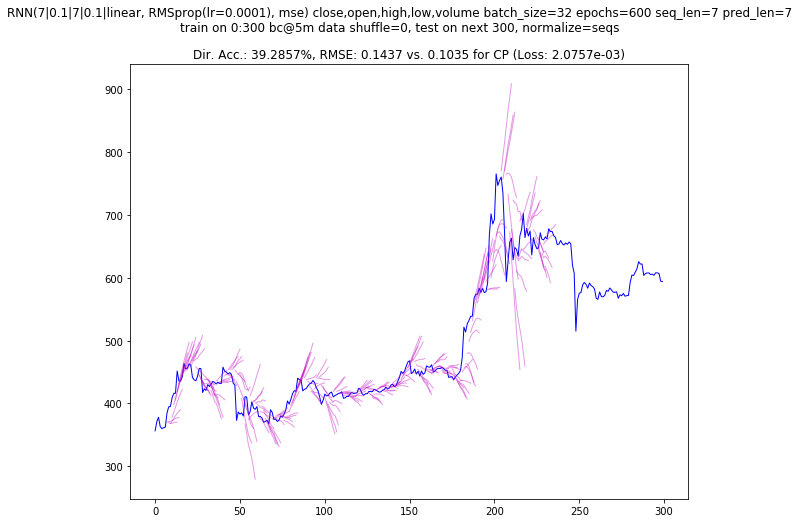

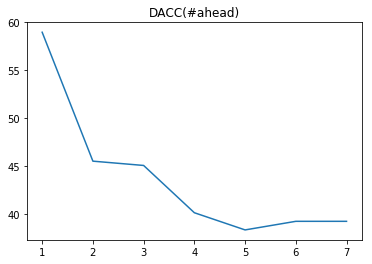

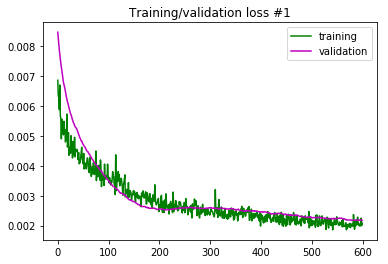

--- 128.004s to run experiment



In [16]:
with timing('run experiment'):
    res = run_walk_forward_validation_rnn(
        # data to extract:
        data24h,
        features=[
            'close',
            'open', 'high', 'low', 'volume',
        ],
        from_i=0,
        train_sz=300,
        test_sz=300,
        # data processing:
        normalize='seqs',  # 'seqs' | 'data'
        detrend=False,
        # model and prediction arrangement:
        seq_len=7,
        pred_len=7,
        model_maker=make_rnn_model_constructor(
            [7, 0.1, 7, 0.1],
            lr=1e-4,
        ),
        # training:
        epochs=600,
        batch_size=32,
        shuffle=False,
        # experiment setup:
        times=1,
        skip=False,
        fix_all_rngs_to=False,
        fix_rngs_before_each=False,
        # plotting:
        fig_size=(10, 8),
        fast=True,
    )
    plot_train_val_losses(res['train_val_losses'])

data ~ (600, 5)
--- 0.015s to model compilation time


--- Created model id: 139623759352912
Tensor("lstm_35_input:0", shape=(?, 7, 5), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_35 (LSTM)               (None, 7, 7)              364       
_________________________________________________________________
dropout_35 (Dropout)         (None, 7, 7)              0         
_________________________________________________________________
lstm_36 (LSTM)               (None, 7)                 420       
_________________________________________________________________
dropout_36 (Dropout)         (None, 7)                 0         
_________________________________________________________________
dense_18 (Dense)             (None, 1)                 8         
Total params: 792
Trainable params: 792
Non-trainable params: 0
___________________________________________________________

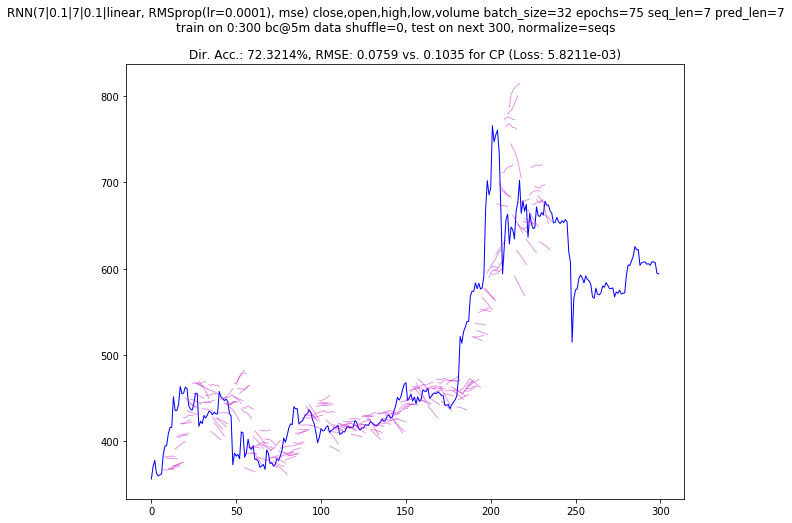

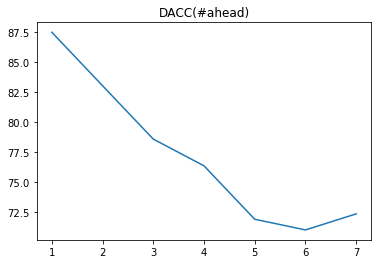

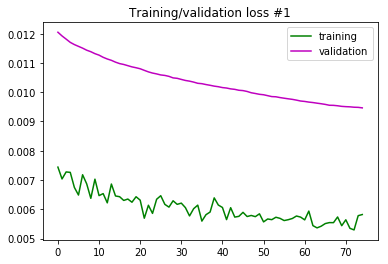

--- 23.127s to run experiment



In [17]:
with timing('run experiment'):
    res = run_walk_forward_validation_rnn(
        # data to extract:
        data24h,
        features=[
            'close',
            'open', 'high', 'low', 'volume',
        ],
        from_i=0,
        train_sz=300,
        test_sz=300,
        # data processing:
        normalize='seqs',  # 'seqs' | 'data'
        detrend=False,
        # model and prediction arrangement:
        seq_len=7,
        pred_len=7,
        model_maker=make_rnn_model_constructor(
            [7, 0.1, 7, 0.1],
            lr=1e-4,
        ),
        # training:
        epochs=75,
        batch_size=32,
        shuffle=False,
        # experiment setup:
        times=1,
        skip=False,
        fix_all_rngs_to=False,
        fix_rngs_before_each=False,
        # plotting:
        fig_size=(10, 8),
        fast=True,
    )
    plot_train_val_losses(res['train_val_losses'])

data ~ (600, 5)
--- 0.015s to model compilation time


--- Created model id: 139623764982800
Tensor("lstm_37_input:0", shape=(?, 7, 5), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_37 (LSTM)               (None, 7, 7)              364       
_________________________________________________________________
dropout_37 (Dropout)         (None, 7, 7)              0         
_________________________________________________________________
lstm_38 (LSTM)               (None, 7)                 420       
_________________________________________________________________
dropout_38 (Dropout)         (None, 7)                 0         
_________________________________________________________________
dense_19 (Dense)             (None, 1)                 8         
Total params: 792
Trainable params: 792
Non-trainable params: 0
___________________________________________________________

262/262 [==============================] - 0s 754us/step - loss: 0.0022 - val_loss: 0.0115
Epoch 146/150
262/262 [==============================] - 0s 777us/step - loss: 0.0020 - val_loss: 0.0115
Epoch 147/150
262/262 [==============================] - 0s 751us/step - loss: 0.0020 - val_loss: 0.0114
Epoch 148/150
262/262 [==============================] - 0s 736us/step - loss: 0.0022 - val_loss: 0.0113
Epoch 149/150
262/262 [==============================] - 0s 786us/step - loss: 0.0020 - val_loss: 0.0113
Epoch 150/150
262/262 [==============================] - 0s 739us/step - loss: 0.0021 - val_loss: 0.0112
--- 34.912s to train model

> Predicting (now at 0)...
> Predicting (now at 32)...
> Predicting (now at 64)...
> Predicting (now at 96)...
> Predicting (now at 128)...
> Predicting (now at 160)...
> Predicting (now at 192)...
--- 1.770s to walk and predict

--- 0.265s to plot incremental predictions



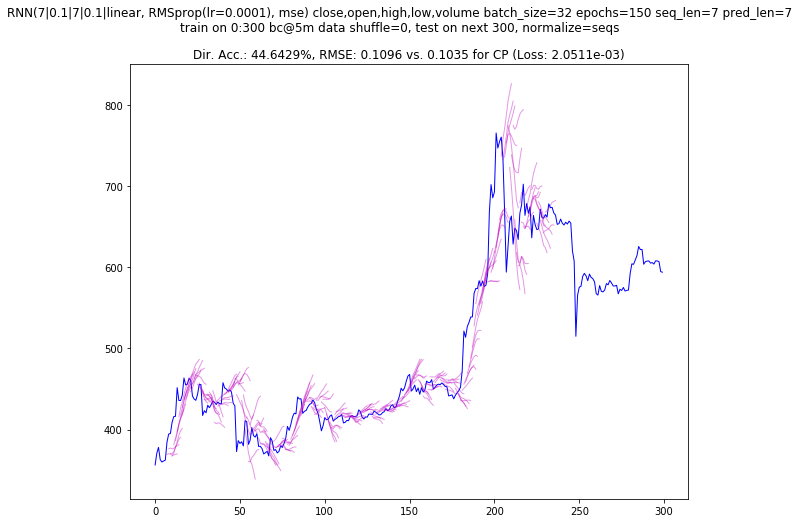

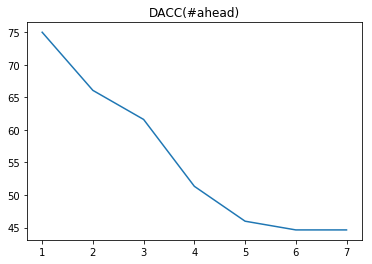

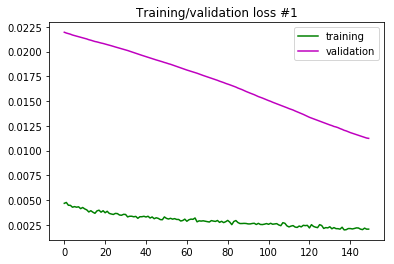

--- 37.705s to run experiment



In [18]:
with timing('run experiment'):
    res = run_walk_forward_validation_rnn(
        # data to extract:
        data24h,
        features=[
            'close',
            'open', 'high', 'low', 'volume',
        ],
        from_i=0,
        train_sz=300,
        test_sz=300,
        # data processing:
        normalize='seqs',  # 'seqs' | 'data'
        detrend=False,
        # model and prediction arrangement:
        seq_len=7,
        pred_len=7,
        model_maker=make_rnn_model_constructor(
            [7, 0.1, 7, 0.1],
            lr=1e-4,
        ),
        # training:
        epochs=150,
        batch_size=32,
        shuffle=False,
        # experiment setup:
        times=1,
        skip=False,
        fix_all_rngs_to=False,
        fix_rngs_before_each=False,
        # plotting:
        fig_size=(10, 8),
        fast=True,
    )
    plot_train_val_losses(res['train_val_losses'])

#### Size 28|28

data ~ (900, 5)
--- 0.014s to model compilation time


--- Created model id: 140690174816976
Tensor("lstm_27_input:0", shape=(?, 7, 5), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_27 (LSTM)               (None, 7, 28)             3808      
_________________________________________________________________
dropout_27 (Dropout)         (None, 7, 28)             0         
_________________________________________________________________
lstm_28 (LSTM)               (None, 28)                6384      
_________________________________________________________________
dropout_28 (Dropout)         (None, 28)                0         
_________________________________________________________________
dense_14 (Dense)             (None, 1)                 29        
Total params: 10,221
Trainable params: 10,221
Non-trainable params: 0
_____________________________________________________

532/532 [==============================] - 1s 1ms/step - loss: 0.0047 - val_loss: 0.0038
Epoch 70/100
532/532 [==============================] - 1s 1ms/step - loss: 0.0046 - val_loss: 0.0038
Epoch 71/100
532/532 [==============================] - 1s 1ms/step - loss: 0.0049 - val_loss: 0.0038
Epoch 72/100
532/532 [==============================] - 1s 1ms/step - loss: 0.0047 - val_loss: 0.0038
Epoch 73/100
532/532 [==============================] - 1s 1ms/step - loss: 0.0048 - val_loss: 0.0038
Epoch 74/100
532/532 [==============================] - 1s 1ms/step - loss: 0.0045 - val_loss: 0.0037
Epoch 75/100
532/532 [==============================] - 1s 1ms/step - loss: 0.0047 - val_loss: 0.0037
Epoch 76/100
532/532 [==============================] - 1s 1ms/step - loss: 0.0048 - val_loss: 0.0037
Epoch 77/100
532/532 [==============================] - 1s 1ms/step - loss: 0.0045 - val_loss: 0.0037
Epoch 78/100
532/532 [==============================] - 1s 1ms/step - loss: 0.0045 - val_loss: 

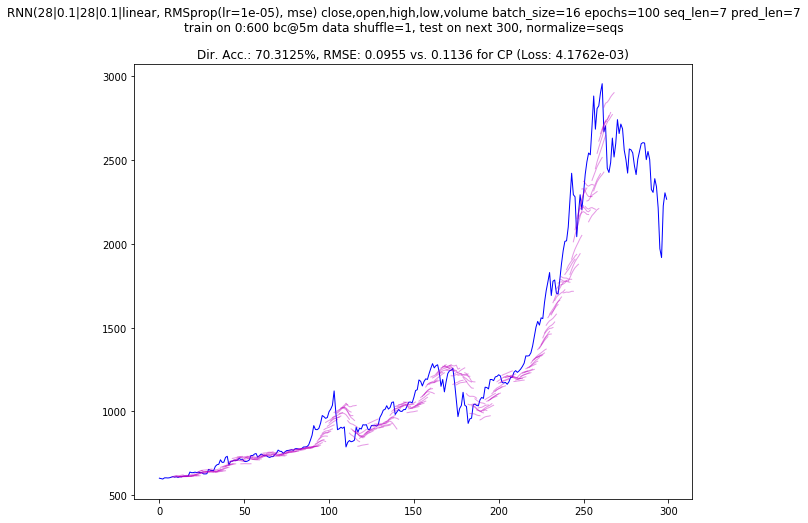

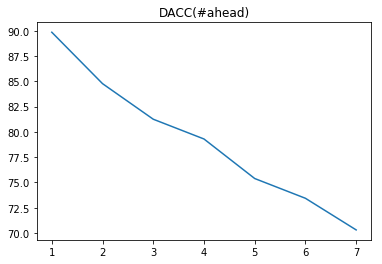

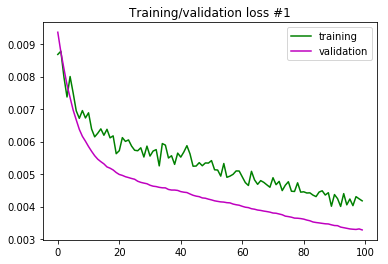

--- 82.115s to run experiment



In [14]:
with timing('run experiment'):
    res = run_walk_forward_validation_rnn(
        # data to extract:
        data24h,
        features=[
            'close',
            'open', 'high', 'low', 'volume',
        ],
        from_i=0,
        train_sz=600,
        test_sz=300,
        # data processing:
        normalize='seqs',  # 'seqs' | 'data'
        detrend=False,
        # model and prediction arrangement:
        seq_len=7,
        pred_len=7,
        model_maker=make_rnn_model_constructor(
            [28, 0.1, 28, 0.1],
            lr=1e-5,
        ),
        # training:
        epochs=100,
        batch_size=16,
        shuffle=True,
        # experiment setup:
        times=1,
        skip=False,
        fix_all_rngs_to=False,
        fix_rngs_before_each=False,
        # plotting:
        fig_size=(10, 8),
        fast=True,
    )
    plot_train_val_losses(res['train_val_losses'])

data ~ (900, 5)
--- 0.015s to model compilation time


--- Created model id: 140696723184400
Tensor("lstm_87_input:0", shape=(?, 7, 5), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_87 (LSTM)               (None, 7, 28)             3808      
_________________________________________________________________
dropout_87 (Dropout)         (None, 7, 28)             0         
_________________________________________________________________
lstm_88 (LSTM)               (None, 28)                6384      
_________________________________________________________________
dropout_88 (Dropout)         (None, 28)                0         
_________________________________________________________________
dense_44 (Dense)             (None, 1)                 29        
Total params: 10,221
Trainable params: 10,221
Non-trainable params: 0
_____________________________________________________

Epoch 68/100
532/532 [==============================] - 0s 748us/step - loss: 0.0020 - val_loss: 0.0021
Epoch 69/100
532/532 [==============================] - 0s 737us/step - loss: 0.0021 - val_loss: 0.0021
Epoch 70/100
532/532 [==============================] - 0s 735us/step - loss: 0.0022 - val_loss: 0.0021
Epoch 71/100
532/532 [==============================] - 0s 733us/step - loss: 0.0021 - val_loss: 0.0021
Epoch 72/100
532/532 [==============================] - 0s 671us/step - loss: 0.0021 - val_loss: 0.0021
Epoch 73/100
532/532 [==============================] - 0s 748us/step - loss: 0.0021 - val_loss: 0.0021
Epoch 74/100
532/532 [==============================] - 0s 753us/step - loss: 0.0021 - val_loss: 0.0021
Epoch 75/100
532/532 [==============================] - 0s 674us/step - loss: 0.0020 - val_loss: 0.0021
Epoch 76/100
532/532 [==============================] - 0s 696us/step - loss: 0.0020 - val_loss: 0.0020
Epoch 77/100
532/532 [==============================] - 0s 738us

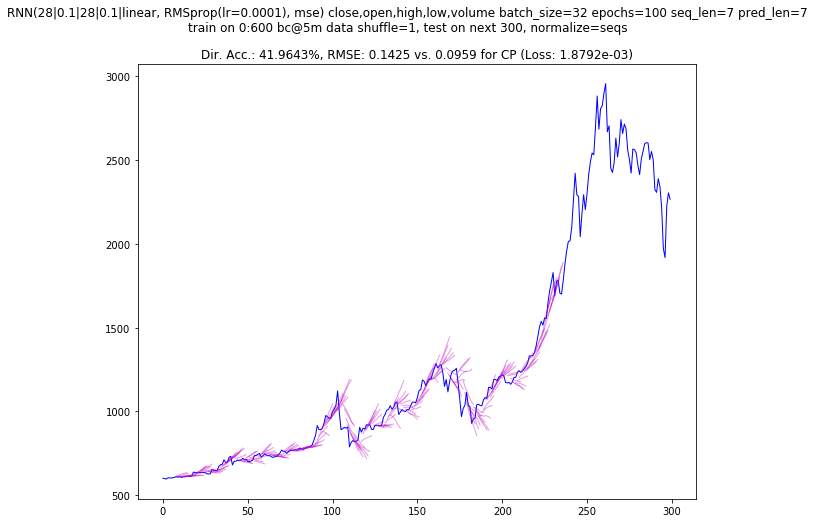

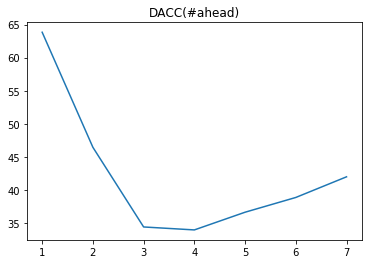

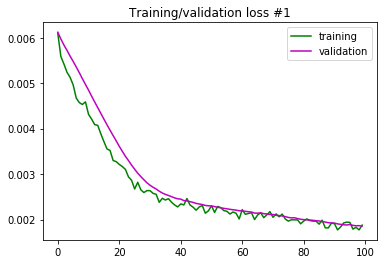

--- 51.709s to run experiment



In [32]:
with timing('run experiment'):
    res = run_walk_forward_validation_rnn(
        # data to extract:
        data24h,
        features=[
            'close',
            'open', 'high', 'low', 'volume',
        ],
        from_i=0,
        train_sz=600,
        test_sz=300,
        # data processing:
        normalize='seqs',  # 'seqs' | 'data'
        detrend=False,
        # model and prediction arrangement:
        seq_len=7,
        pred_len=7,
        model_maker=make_rnn_model_constructor(
            [28, 0.1, 28, 0.1],
            lr=1e-4,
        ),
        # training:
        epochs=100,
        batch_size=32,
        shuffle=True,
        # experiment setup:
        times=1,
        skip=False,
        fix_all_rngs_to=False,
        fix_rngs_before_each=False,
        # plotting:
        fig_size=(10, 8),
        fast=True,
    )
    plot_train_val_losses(res['train_val_losses'])

data ~ (900, 5)
--- 0.015s to model compilation time


--- Created model id: 140696882993168
Tensor("lstm_81_input:0", shape=(?, 7, 5), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_81 (LSTM)               (None, 7, 28)             3808      
_________________________________________________________________
dropout_81 (Dropout)         (None, 7, 28)             0         
_________________________________________________________________
lstm_82 (LSTM)               (None, 28)                6384      
_________________________________________________________________
dropout_82 (Dropout)         (None, 28)                0         
_________________________________________________________________
dense_41 (Dense)             (None, 1)                 29        
Total params: 10,221
Trainable params: 10,221
Non-trainable params: 0
_____________________________________________________

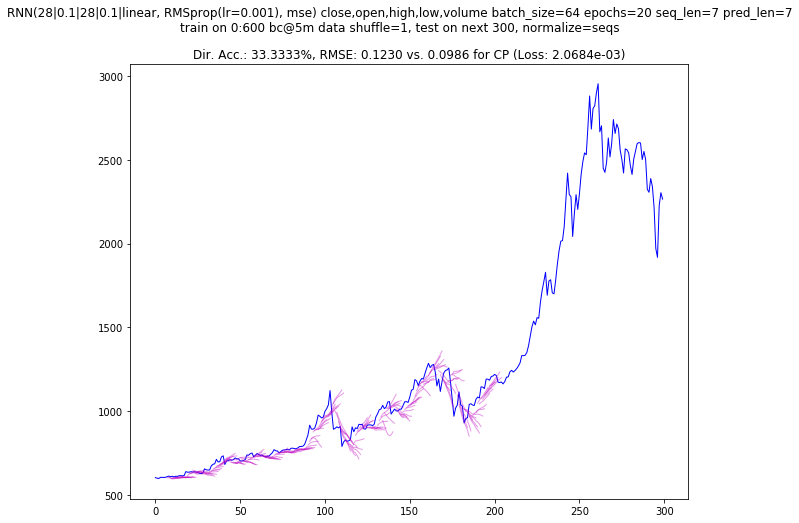

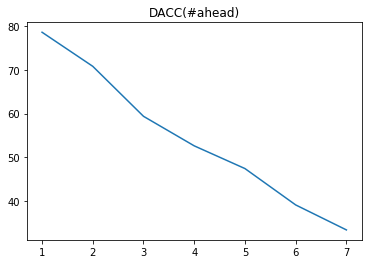

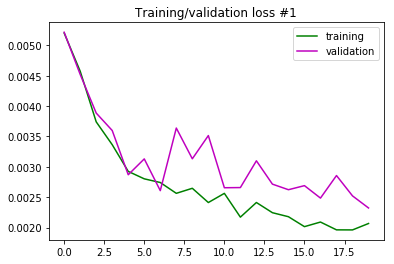

--- 15.768s to run experiment



In [29]:
with timing('run experiment'):
    res = run_walk_forward_validation_rnn(
        # data to extract:
        data24h,
        features=[
            'close',
            'open', 'high', 'low', 'volume',
        ],
        from_i=0,
        train_sz=600,
        test_sz=300,
        # data processing:
        normalize='seqs',  # 'seqs' | 'data'
        detrend=False,
        # model and prediction arrangement:
        seq_len=7,
        pred_len=7,
        model_maker=make_rnn_model_constructor(
            [28, 0.1, 28, 0.1],
            lr=1e-3,
        ),
        # training:
        epochs=20,
        batch_size=64,
        shuffle=True,
        # experiment setup:
        times=1,
        skip=False,
        fix_all_rngs_to=False,
        fix_rngs_before_each=False,
        # plotting:
        fig_size=(10, 8),
        fast=True,
    )
    plot_train_val_losses(res['train_val_losses'])

data ~ (900, 5)
--- 0.015s to model compilation time


--- Created model id: 140696671129552
Tensor("lstm_91_input:0", shape=(?, 7, 5), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_91 (LSTM)               (None, 7, 28)             3808      
_________________________________________________________________
dropout_91 (Dropout)         (None, 7, 28)             0         
_________________________________________________________________
lstm_92 (LSTM)               (None, 28)                6384      
_________________________________________________________________
dropout_92 (Dropout)         (None, 28)                0         
_________________________________________________________________
dense_46 (Dense)             (None, 1)                 29        
Total params: 10,221
Trainable params: 10,221
Non-trainable params: 0
_____________________________________________________

Train on 532 samples, validate on 60 samples
Epoch 1/20
532/532 [==============================] - 9s 16ms/step - loss: 0.0067 - val_loss: 0.0067
Epoch 2/20
532/532 [==============================] - 0s 734us/step - loss: 0.0062 - val_loss: 0.0065
Epoch 3/20
532/532 [==============================] - 0s 734us/step - loss: 0.0060 - val_loss: 0.0064
Epoch 4/20
532/532 [==============================] - 0s 727us/step - loss: 0.0059 - val_loss: 0.0061
Epoch 5/20
532/532 [==============================] - 0s 726us/step - loss: 0.0057 - val_loss: 0.0059
Epoch 6/20
532/532 [==============================] - 0s 716us/step - loss: 0.0055 - val_loss: 0.0057
Epoch 7/20
532/532 [==============================] - 0s 720us/step - loss: 0.0055 - val_loss: 0.0056
Epoch 8/20
532/532 [==============================] - 0s 685us/step - loss: 0.0052 - val_loss: 0.0054
Epoch 9/20
532/532 [==============================] - 0s 702us/step - loss: 0.0051 - val_loss: 0.0052
Epoch 10/20
532/532 [=================

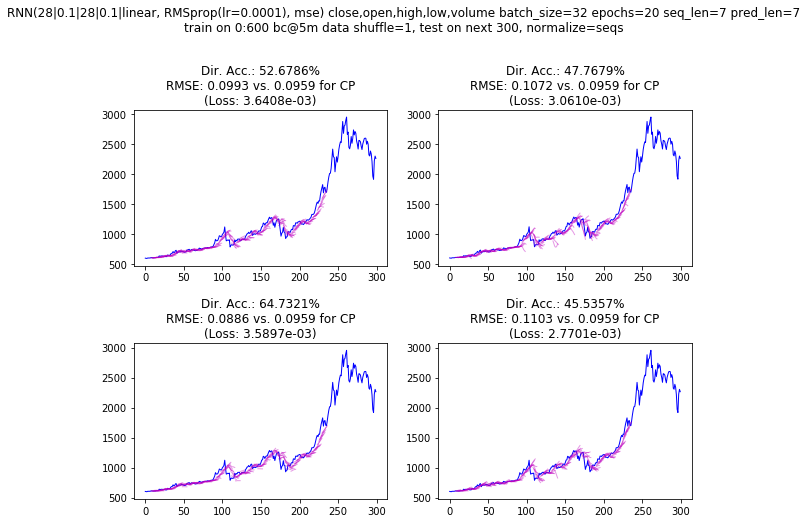

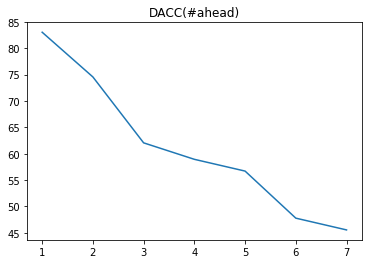

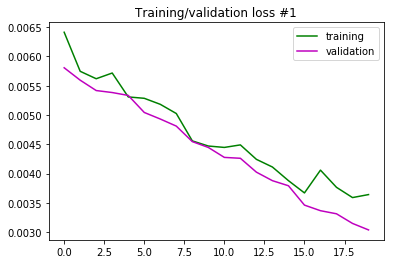

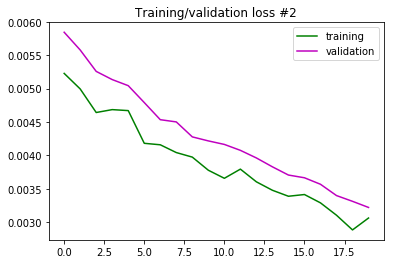

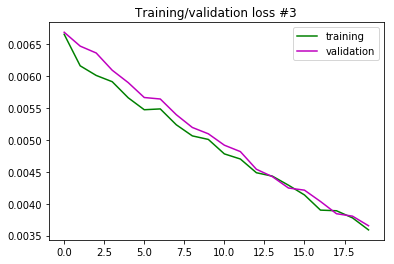

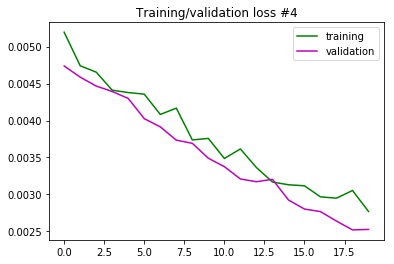

--- 87.306s to run experiment



In [34]:
with timing('run experiment'):
    res = run_walk_forward_validation_rnn(
        # data to extract:
        data24h,
        features=[
            'close',
            'open', 'high', 'low', 'volume',
        ],
        from_i=0,
        train_sz=600,
        test_sz=300,
        # data processing:
        normalize='seqs',  # 'seqs' | 'data'
        detrend=False,
        # model and prediction arrangement:
        seq_len=7,
        pred_len=7,
        model_maker=make_rnn_model_constructor(
            [28, 0.1, 28, 0.1],
            lr=1e-4,
        ),
        # training:
        epochs=20,
        batch_size=32,
        shuffle=True,
        # experiment setup:
        times=4,
        skip=False,
        fix_all_rngs_to=False,
        fix_rngs_before_each=False,
        # plotting:
        fig_size=(10, 8),
        fast=True,
    )
    plot_train_val_losses(res['train_val_losses'])

data ~ (900, 5)
--- 0.015s to model compilation time


--- Created model id: 140691861943696
Tensor("lstm_3_input:0", shape=(?, 7, 5), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_3 (LSTM)                (None, 7, 28)             3808      
_________________________________________________________________
dropout_3 (Dropout)          (None, 7, 28)             0         
_________________________________________________________________
lstm_4 (LSTM)                (None, 28)                6384      
_________________________________________________________________
dropout_4 (Dropout)          (None, 28)                0         
_________________________________________________________________
dense_2 (Dense)              (None, 1)                 29        
Total params: 10,221
Trainable params: 10,221
Non-trainable params: 0
______________________________________________________

Train on 532 samples, validate on 60 samples
Epoch 1/20
532/532 [==============================] - 2s 4ms/step - loss: 0.0070 - val_loss: 0.0080
Epoch 2/20
532/532 [==============================] - 0s 739us/step - loss: 0.0066 - val_loss: 0.0072
Epoch 3/20
532/532 [==============================] - 0s 719us/step - loss: 0.0064 - val_loss: 0.0066
Epoch 4/20
532/532 [==============================] - 0s 691us/step - loss: 0.0062 - val_loss: 0.0063
Epoch 5/20
532/532 [==============================] - 0s 677us/step - loss: 0.0063 - val_loss: 0.0060
Epoch 6/20
532/532 [==============================] - 0s 694us/step - loss: 0.0059 - val_loss: 0.0058
Epoch 7/20
532/532 [==============================] - 0s 747us/step - loss: 0.0059 - val_loss: 0.0057
Epoch 8/20
532/532 [==============================] - 0s 715us/step - loss: 0.0060 - val_loss: 0.0056
Epoch 9/20
532/532 [==============================] - 0s 732us/step - loss: 0.0057 - val_loss: 0.0056
Epoch 10/20
532/532 [==================

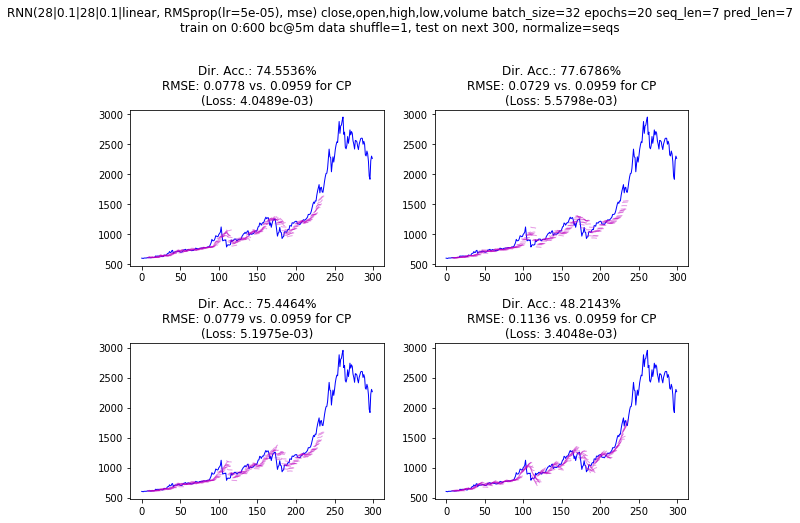

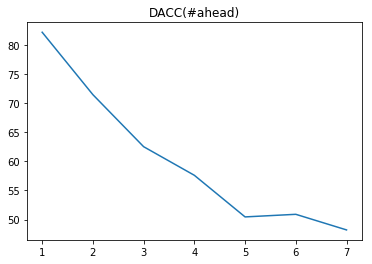

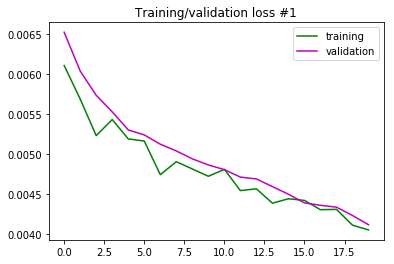

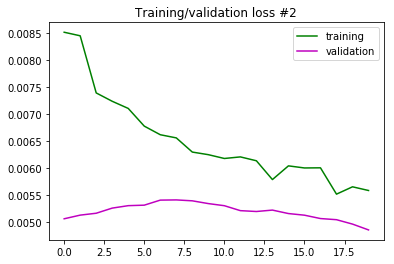

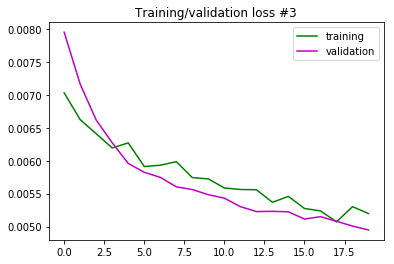

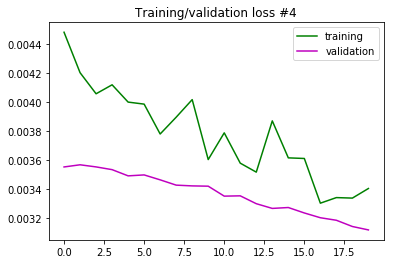

--- 46.929s to run experiment



In [5]:
with timing('run experiment'):
    res = run_walk_forward_validation_rnn(
        # data to extract:
        data24h,
        features=[
            'close',
            'open', 'high', 'low', 'volume',
        ],
        from_i=0,
        train_sz=600,
        test_sz=300,
        # data processing:
        normalize='seqs',  # 'seqs' | 'data'
        detrend=False,
        # model and prediction arrangement:
        seq_len=7,
        pred_len=7,
        model_maker=make_rnn_model_constructor(
            [28, 0.1, 28, 0.1],
            lr=5e-5,
        ),
        # training:
        epochs=20,
        batch_size=32,
        shuffle=True,
        # experiment setup:
        times=4,
        skip=False,
        fix_all_rngs_to=False,
        fix_rngs_before_each=False,
        # plotting:
        fig_size=(10, 8),
        fast=True,
    )
    plot_train_val_losses(res['train_val_losses'])

## +OHLV+W

data ~ (600, 6)
--- 0.016s to model compilation time


--- Created model id: 140690146813968
Tensor("lstm_29_input:0", shape=(?, 7, 6), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_29 (LSTM)               (None, 7, 7)              392       
_________________________________________________________________
dropout_29 (Dropout)         (None, 7, 7)              0         
_________________________________________________________________
lstm_30 (LSTM)               (None, 7)                 420       
_________________________________________________________________
dropout_30 (Dropout)         (None, 7)                 0         
_________________________________________________________________
dense_15 (Dense)             (None, 1)                 8         
Total params: 820
Trainable params: 820
Non-trainable params: 0
___________________________________________________________

Epoch 68/300
262/262 [==============================] - 0s 816us/step - loss: 0.0042 - val_loss: 0.0193
Epoch 69/300
262/262 [==============================] - 0s 749us/step - loss: 0.0036 - val_loss: 0.0192
Epoch 70/300
262/262 [==============================] - 0s 747us/step - loss: 0.0045 - val_loss: 0.0192
Epoch 71/300
262/262 [==============================] - ETA: 0s - loss: 0.004 - 0s 765us/step - loss: 0.0041 - val_loss: 0.0192
Epoch 72/300
262/262 [==============================] - 0s 735us/step - loss: 0.0039 - val_loss: 0.0191
Epoch 73/300
262/262 [==============================] - 0s 725us/step - loss: 0.0039 - val_loss: 0.0191
Epoch 74/300
262/262 [==============================] - 0s 765us/step - loss: 0.0042 - val_loss: 0.0190
Epoch 75/300
262/262 [==============================] - 0s 768us/step - loss: 0.0042 - val_loss: 0.0190
Epoch 76/300
262/262 [==============================] - 0s 765us/step - loss: 0.0042 - val_loss: 0.0190
Epoch 77/300
262/262 [==================

262/262 [==============================] - 0s 756us/step - loss: 0.0029 - val_loss: 0.0162
Epoch 147/300
262/262 [==============================] - 0s 787us/step - loss: 0.0034 - val_loss: 0.0162
Epoch 148/300
262/262 [==============================] - 0s 844us/step - loss: 0.0029 - val_loss: 0.0161
Epoch 149/300
262/262 [==============================] - 0s 785us/step - loss: 0.0032 - val_loss: 0.0161
Epoch 150/300
262/262 [==============================] - 0s 783us/step - loss: 0.0030 - val_loss: 0.0161
Epoch 151/300
262/262 [==============================] - 0s 761us/step - loss: 0.0032 - val_loss: 0.0161
Epoch 152/300
262/262 [==============================] - 0s 777us/step - loss: 0.0029 - val_loss: 0.0160
Epoch 153/300
262/262 [==============================] - 0s 769us/step - loss: 0.0031 - val_loss: 0.0160
Epoch 154/300
262/262 [==============================] - 0s 766us/step - loss: 0.0028 - val_loss: 0.0159
Epoch 155/300
262/262 [==============================] - 0s 748us/ste

> Predicting (now at 128)...
> Predicting (now at 160)...
> Predicting (now at 192)...
--- 1.467s to walk and predict

--- 0.256s to plot incremental predictions



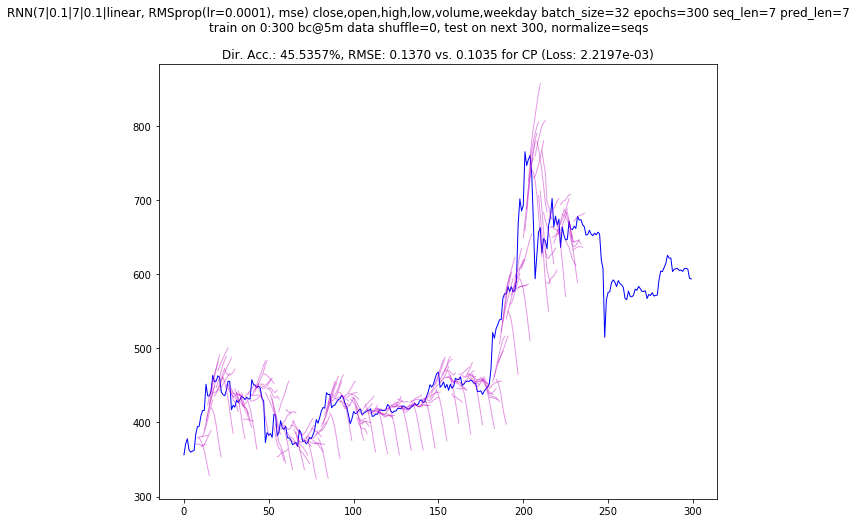

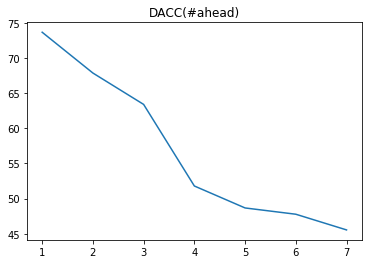

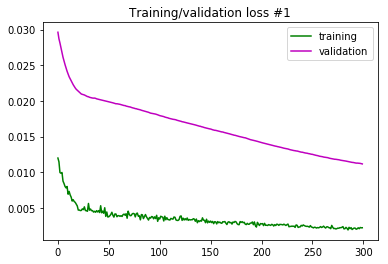

--- 67.716s to run experiment



In [15]:
with timing('run experiment'):
    res = run_walk_forward_validation_rnn(
        # data to extract:
        data24h,
        features=[
            'close',
            'open', 'high', 'low',
            'volume',
            'weekday'
        ],
        from_i=0,
        train_sz=300,
        test_sz=300,
        # data processing:
        normalize='seqs',  # 'seqs' | 'data'
        detrend=False,
        # model and prediction arrangement:
        seq_len=7,
        pred_len=7,
        model_maker=make_rnn_model_constructor(
            [7, 0.1, 7, 0.1],
            lr=1e-4,
        ),
        # training:
        epochs=300,
        batch_size=32,
        shuffle=False,
        # experiment setup:
        times=1,
        skip=False,
        fix_all_rngs_to=False,
        fix_rngs_before_each=False,
        # plotting:
        fig_size=(10, 8),
        fast=True,
    )
    plot_train_val_losses(res['train_val_losses'])

data ~ (600, 6)
--- 0.015s to model compilation time


--- Created model id: 140690080373136
Tensor("lstm_35_input:0", shape=(?, 7, 6), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_35 (LSTM)               (None, 7, 7)              392       
_________________________________________________________________
dropout_35 (Dropout)         (None, 7, 7)              0         
_________________________________________________________________
lstm_36 (LSTM)               (None, 7)                 420       
_________________________________________________________________
dropout_36 (Dropout)         (None, 7)                 0         
_________________________________________________________________
dense_18 (Dense)             (None, 1)                 8         
Total params: 820
Trainable params: 820
Non-trainable params: 0
___________________________________________________________

Epoch 58/75
262/262 [==============================] - 0s 722us/step - loss: 0.0044 - val_loss: 0.0186
Epoch 59/75
262/262 [==============================] - 0s 741us/step - loss: 0.0040 - val_loss: 0.0186
Epoch 60/75
262/262 [==============================] - 0s 722us/step - loss: 0.0042 - val_loss: 0.0186
Epoch 61/75
262/262 [==============================] - 0s 718us/step - loss: 0.0042 - val_loss: 0.0185
Epoch 62/75
262/262 [==============================] - 0s 738us/step - loss: 0.0042 - val_loss: 0.0185
Epoch 63/75
262/262 [==============================] - 0s 788us/step - loss: 0.0042 - val_loss: 0.0185
Epoch 64/75
262/262 [==============================] - 0s 763us/step - loss: 0.0044 - val_loss: 0.0184
Epoch 65/75
262/262 [==============================] - 0s 730us/step - loss: 0.0041 - val_loss: 0.0183
Epoch 66/75
262/262 [==============================] - 0s 755us/step - loss: 0.0044 - val_loss: 0.0183
Epoch 67/75
262/262 [==============================] - 0s 796us/step - lo

Epoch 37/75
262/262 [==============================] - 0s 759us/step - loss: 0.0042 - val_loss: 0.0195
Epoch 38/75
262/262 [==============================] - 0s 797us/step - loss: 0.0039 - val_loss: 0.0195
Epoch 39/75
262/262 [==============================] - 0s 744us/step - loss: 0.0042 - val_loss: 0.0194
Epoch 40/75
262/262 [==============================] - 0s 756us/step - loss: 0.0039 - val_loss: 0.0193
Epoch 41/75
262/262 [==============================] - 0s 755us/step - loss: 0.0043 - val_loss: 0.0193
Epoch 42/75
262/262 [==============================] - 0s 743us/step - loss: 0.0041 - val_loss: 0.0192
Epoch 43/75
262/262 [==============================] - 0s 727us/step - loss: 0.0040 - val_loss: 0.0192
Epoch 44/75
262/262 [==============================] - 0s 715us/step - loss: 0.0039 - val_loss: 0.0192
Epoch 45/75
262/262 [==============================] - 0s 743us/step - loss: 0.0042 - val_loss: 0.0191
Epoch 46/75
262/262 [==============================] - 0s 741us/step - lo

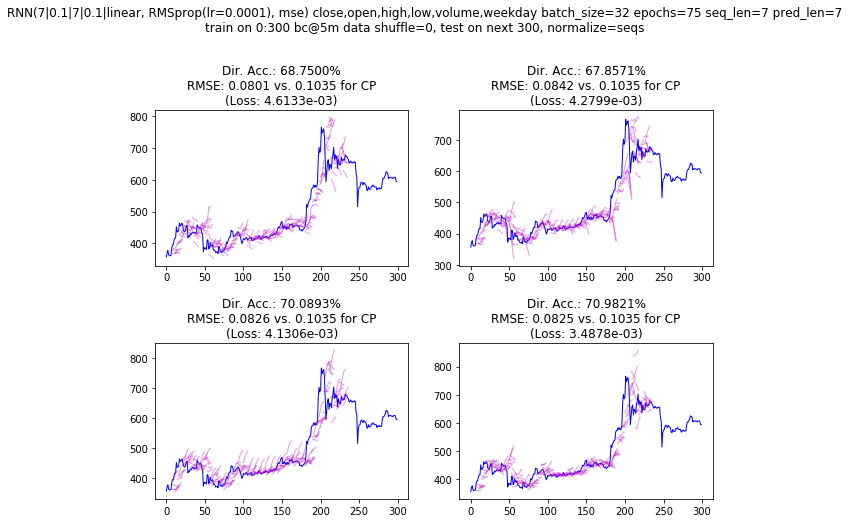

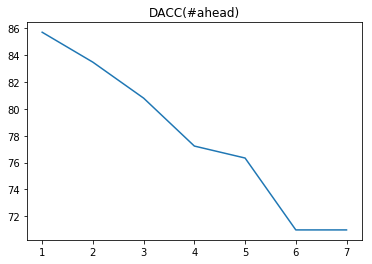

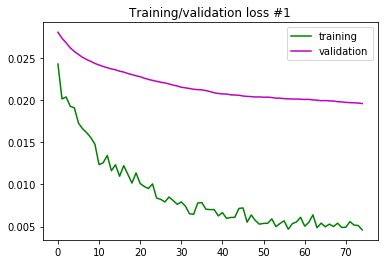

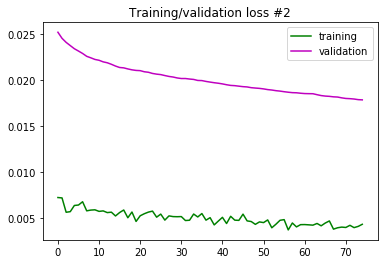

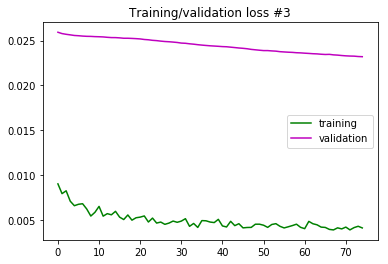

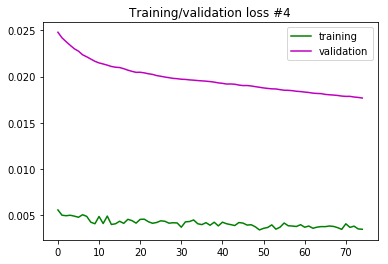

--- 90.097s to run experiment



In [18]:
with timing('run experiment'):
    res = run_walk_forward_validation_rnn(
        # data to extract:
        data24h,
        features=[
            'close',
            'open', 'high', 'low',
            'volume',
            'weekday'
        ],
        from_i=0,
        train_sz=300,
        test_sz=300,
        # data processing:
        normalize='seqs',  # 'seqs' | 'data'
        detrend=False,
        # model and prediction arrangement:
        seq_len=7,
        pred_len=7,
        model_maker=make_rnn_model_constructor(
            [7, 0.1, 7, 0.1],
            lr=1e-4,
        ),
        # training:
        epochs=75,
        batch_size=32,
        shuffle=False,
        # experiment setup:
        times=4,
        skip=False,
        fix_all_rngs_to=False,
        fix_rngs_before_each=False,
        # plotting:
        fig_size=(10, 8),
        fast=True,
    )
    plot_train_val_losses(res['train_val_losses'])

data ~ (600, 6)
--- 0.015s to model compilation time


--- Created model id: 140689985866128
Tensor("lstm_43_input:0", shape=(?, 7, 6), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_43 (LSTM)               (None, 7, 7)              392       
_________________________________________________________________
dropout_43 (Dropout)         (None, 7, 7)              0         
_________________________________________________________________
lstm_44 (LSTM)               (None, 7)                 420       
_________________________________________________________________
dropout_44 (Dropout)         (None, 7)                 0         
_________________________________________________________________
dense_22 (Dense)             (None, 1)                 8         
Total params: 820
Trainable params: 820
Non-trainable params: 0
___________________________________________________________

Epoch 43/90
262/262 [==============================] - 0s 753us/step - loss: 0.0089 - val_loss: 0.0220
Epoch 44/90
262/262 [==============================] - 0s 764us/step - loss: 0.0078 - val_loss: 0.0218
Epoch 45/90
262/262 [==============================] - 0s 766us/step - loss: 0.0080 - val_loss: 0.0216
Epoch 46/90
262/262 [==============================] - 0s 786us/step - loss: 0.0075 - val_loss: 0.0213
Epoch 47/90
262/262 [==============================] - 0s 766us/step - loss: 0.0072 - val_loss: 0.0211
Epoch 48/90
262/262 [==============================] - 0s 760us/step - loss: 0.0076 - val_loss: 0.0209
Epoch 49/90
262/262 [==============================] - 0s 743us/step - loss: 0.0064 - val_loss: 0.0207
Epoch 50/90
262/262 [==============================] - 0s 798us/step - loss: 0.0063 - val_loss: 0.0205
Epoch 51/90
262/262 [==============================] - 0s 799us/step - loss: 0.0068 - val_loss: 0.0203
Epoch 52/90
262/262 [==============================] - 0s 764us/step - lo

Train on 262 samples, validate on 30 samples
Epoch 1/90
262/262 [==============================] - 4s 17ms/step - loss: 0.0109 - val_loss: 0.0310
Epoch 2/90
262/262 [==============================] - 0s 813us/step - loss: 0.0088 - val_loss: 0.0301
Epoch 3/90
262/262 [==============================] - 0s 741us/step - loss: 0.0091 - val_loss: 0.0293
Epoch 4/90
262/262 [==============================] - 0s 726us/step - loss: 0.0095 - val_loss: 0.0286
Epoch 5/90
262/262 [==============================] - 0s 758us/step - loss: 0.0061 - val_loss: 0.0280
Epoch 6/90
262/262 [==============================] - 0s 795us/step - loss: 0.0066 - val_loss: 0.0275
Epoch 7/90
262/262 [==============================] - 0s 755us/step - loss: 0.0076 - val_loss: 0.0269
Epoch 8/90
262/262 [==============================] - 0s 793us/step - loss: 0.0071 - val_loss: 0.0265
Epoch 9/90
262/262 [==============================] - 0s 763us/step - loss: 0.0073 - val_loss: 0.0260
Epoch 10/90
262/262 [=================

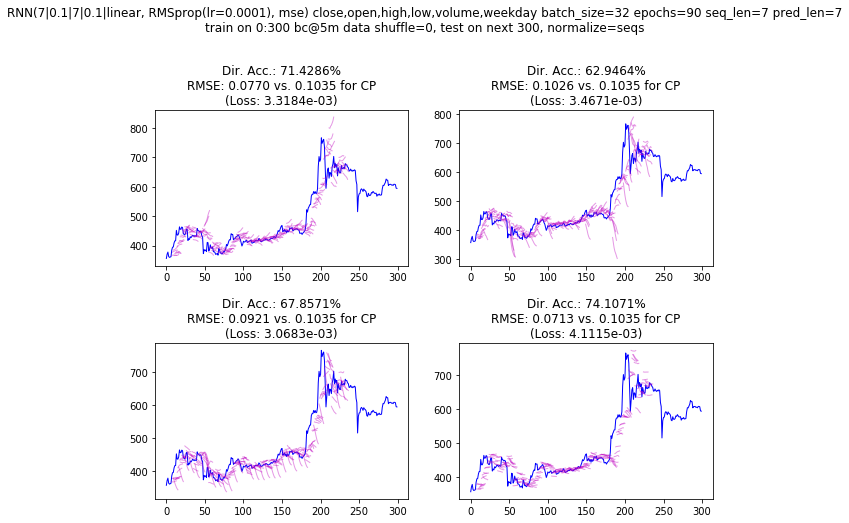

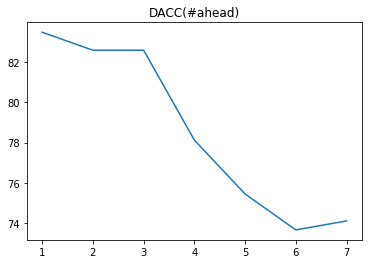

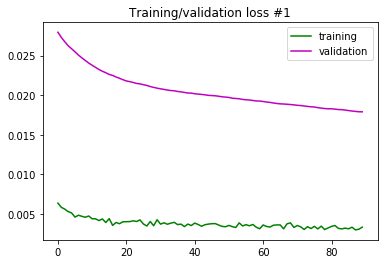

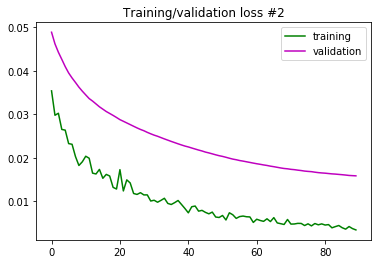

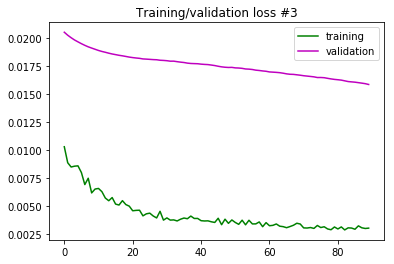

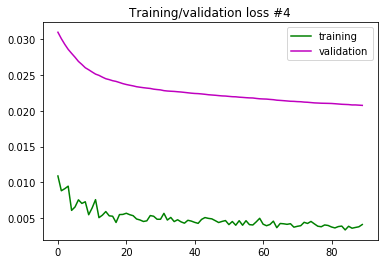

--- 107.074s to run experiment



In [19]:
with timing('run experiment'):
    res = run_walk_forward_validation_rnn(
        # data to extract:
        data24h,
        features=[
            'close',
            'open', 'high', 'low',
            'volume',
            'weekday'
        ],
        from_i=0,
        train_sz=300,
        test_sz=300,
        # data processing:
        normalize='seqs',  # 'seqs' | 'data'
        detrend=False,
        # model and prediction arrangement:
        seq_len=7,
        pred_len=7,
        model_maker=make_rnn_model_constructor(
            [7, 0.1, 7, 0.1],
            lr=1e-4,
        ),
        # training:
        epochs=90,
        batch_size=32,
        shuffle=False,
        # experiment setup:
        times=4,
        skip=False,
        fix_all_rngs_to=False,
        fix_rngs_before_each=False,
        # plotting:
        fig_size=(10, 8),
        fast=True,
    )
    plot_train_val_losses(res['train_val_losses'])

data ~ (600, 6)
--- 0.015s to model compilation time


--- Created model id: 140689898029456
Tensor("lstm_53_input:0", shape=(?, 7, 6), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_53 (LSTM)               (None, 7, 7)              392       
_________________________________________________________________
dropout_53 (Dropout)         (None, 7, 7)              0         
_________________________________________________________________
lstm_54 (LSTM)               (None, 7)                 420       
_________________________________________________________________
dropout_54 (Dropout)         (None, 7)                 0         
_________________________________________________________________
dense_27 (Dense)             (None, 1)                 8         
Total params: 820
Trainable params: 820
Non-trainable params: 0
___________________________________________________________

Train on 262 samples, validate on 30 samples
Epoch 1/60
262/262 [==============================] - 5s 20ms/step - loss: 0.0177 - val_loss: 0.0365
Epoch 2/60
262/262 [==============================] - 0s 718us/step - loss: 0.0177 - val_loss: 0.0357
Epoch 3/60
262/262 [==============================] - 0s 724us/step - loss: 0.0149 - val_loss: 0.0350
Epoch 4/60
262/262 [==============================] - 0s 734us/step - loss: 0.0166 - val_loss: 0.0343
Epoch 5/60
262/262 [==============================] - 0s 743us/step - loss: 0.0146 - val_loss: 0.0336
Epoch 6/60
262/262 [==============================] - 0s 713us/step - loss: 0.0134 - val_loss: 0.0330
Epoch 7/60
262/262 [==============================] - 0s 774us/step - loss: 0.0129 - val_loss: 0.0325
Epoch 8/60
262/262 [==============================] - 0s 748us/step - loss: 0.0117 - val_loss: 0.0320
Epoch 9/60
262/262 [==============================] - 0s 766us/step - loss: 0.0108 - val_loss: 0.0314
Epoch 10/60
262/262 [=================

Epoch 10/60
262/262 [==============================] - 0s 747us/step - loss: 0.0156 - val_loss: 0.0335
Epoch 11/60
262/262 [==============================] - 0s 804us/step - loss: 0.0140 - val_loss: 0.0328
Epoch 12/60
262/262 [==============================] - 0s 730us/step - loss: 0.0136 - val_loss: 0.0322
Epoch 13/60
262/262 [==============================] - 0s 766us/step - loss: 0.0133 - val_loss: 0.0315
Epoch 14/60
262/262 [==============================] - 0s 791us/step - loss: 0.0132 - val_loss: 0.0310
Epoch 15/60
262/262 [==============================] - 0s 761us/step - loss: 0.0122 - val_loss: 0.0305
Epoch 16/60
262/262 [==============================] - 0s 795us/step - loss: 0.0123 - val_loss: 0.0299
Epoch 17/60
262/262 [==============================] - 0s 834us/step - loss: 0.0112 - val_loss: 0.0295
Epoch 18/60
262/262 [==============================] - 0s 755us/step - loss: 0.0111 - val_loss: 0.0290
Epoch 19/60
262/262 [==============================] - 0s 826us/step - lo

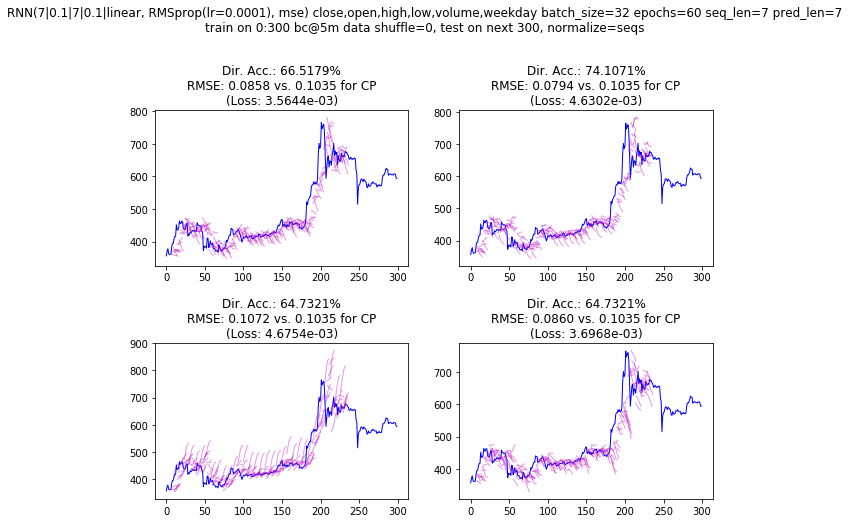

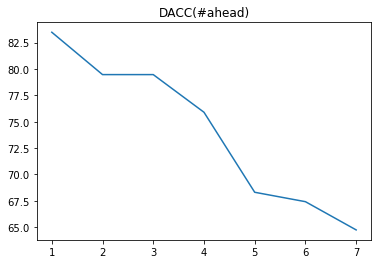

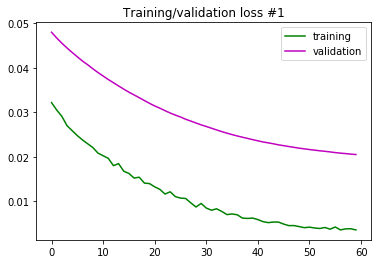

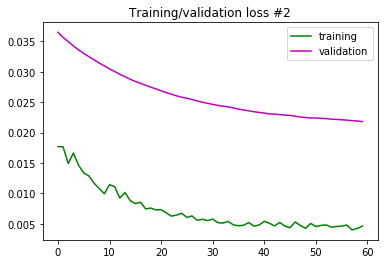

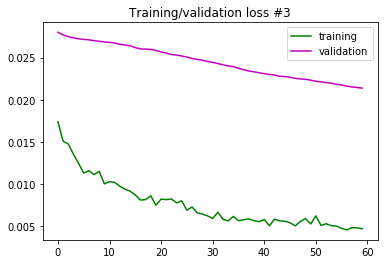

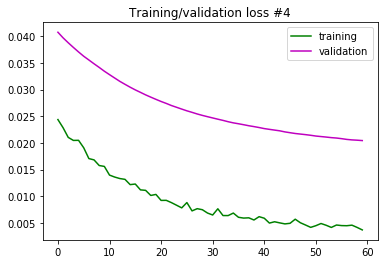

--- 86.129s to run experiment



In [21]:
with timing('run experiment'):
    res = run_walk_forward_validation_rnn(
        # data to extract:
        data24h,
        features=[
            'close',
            'open', 'high', 'low',
            'volume',
            'weekday'
        ],
        from_i=0,
        train_sz=300,
        test_sz=300,
        # data processing:
        normalize='seqs',  # 'seqs' | 'data'
        detrend=False,
        # model and prediction arrangement:
        seq_len=7,
        pred_len=7,
        model_maker=make_rnn_model_constructor(
            [7, 0.1, 7, 0.1],
            lr=1e-4,
        ),
        # training:
        epochs=60,
        batch_size=32,
        shuffle=False,
        # experiment setup:
        times=4,
        skip=False,
        fix_all_rngs_to=False,
        fix_rngs_before_each=False,
        # plotting:
        fig_size=(10, 8),
        fast=True,
    )
    plot_train_val_losses(res['train_val_losses'])

## tuning

Starting from a `7|0.1|7|0.1`, lr=1e-4, trained on 300, epochs=100, batch_size=32, giving 70.5  - 73.5 %.

### SGD with dropout:

data ~ (600, 6)
--- 0.019s to model compilation time


--- Created model id: 140513202955216
Tensor("lstm_1_input:0", shape=(?, 7, 6), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 7, 7)              392       
_________________________________________________________________
dropout_1 (Dropout)          (None, 7, 7)              0         
_________________________________________________________________
lstm_2 (LSTM)                (None, 7)                 420       
_________________________________________________________________
dropout_2 (Dropout)          (None, 7)                 0         
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 8         
Total params: 820
Trainable params: 820
Non-trainable params: 0
____________________________________________________________

Epoch 68/300
262/262 [==============================] - 0s 873us/step - loss: 0.0054 - val_loss: 0.0310
Epoch 69/300
262/262 [==============================] - 0s 836us/step - loss: 0.0056 - val_loss: 0.0310
Epoch 70/300
262/262 [==============================] - 0s 997us/step - loss: 0.0063 - val_loss: 0.0308
Epoch 71/300
262/262 [==============================] - 0s 1ms/step - loss: 0.0055 - val_loss: 0.0308
Epoch 72/300
262/262 [==============================] - 0s 1ms/step - loss: 0.0053 - val_loss: 0.0308
Epoch 73/300
262/262 [==============================] - 0s 1ms/step - loss: 0.0052 - val_loss: 0.0307
Epoch 74/300
262/262 [==============================] - 0s 988us/step - loss: 0.0053 - val_loss: 0.0307
Epoch 75/300
262/262 [==============================] - 0s 969us/step - loss: 0.0054 - val_loss: 0.0307
Epoch 76/300
262/262 [==============================] - 0s 968us/step - loss: 0.0064 - val_loss: 0.0307
Epoch 77/300
262/262 [==============================] - 0s 967us/step 

262/262 [==============================] - 0s 921us/step - loss: 0.0050 - val_loss: 0.0291
Epoch 147/300
262/262 [==============================] - 0s 911us/step - loss: 0.0052 - val_loss: 0.0291
Epoch 148/300
262/262 [==============================] - 0s 874us/step - loss: 0.0046 - val_loss: 0.0290
Epoch 149/300
262/262 [==============================] - 0s 862us/step - loss: 0.0049 - val_loss: 0.0290
Epoch 150/300
262/262 [==============================] - 0s 889us/step - loss: 0.0051 - val_loss: 0.0290
Epoch 151/300
262/262 [==============================] - 0s 884us/step - loss: 0.0055 - val_loss: 0.0289
Epoch 152/300
262/262 [==============================] - 0s 906us/step - loss: 0.0047 - val_loss: 0.0289
Epoch 153/300
262/262 [==============================] - 0s 925us/step - loss: 0.0052 - val_loss: 0.0288
Epoch 154/300
262/262 [==============================] - 0s 848us/step - loss: 0.0045 - val_loss: 0.0288
Epoch 155/300
262/262 [==============================] - 0s 818us/ste

262/262 [==============================] - 0s 783us/step - loss: 0.0045 - val_loss: 0.0280
Epoch 225/300
262/262 [==============================] - 0s 786us/step - loss: 0.0048 - val_loss: 0.0280
Epoch 226/300
262/262 [==============================] - 0s 763us/step - loss: 0.0048 - val_loss: 0.0281
Epoch 227/300
262/262 [==============================] - 0s 775us/step - loss: 0.0050 - val_loss: 0.0280
Epoch 228/300
262/262 [==============================] - 0s 754us/step - loss: 0.0048 - val_loss: 0.0280
Epoch 229/300
262/262 [==============================] - 0s 817us/step - loss: 0.0049 - val_loss: 0.0280
Epoch 230/300
262/262 [==============================] - 0s 781us/step - loss: 0.0050 - val_loss: 0.0280
Epoch 231/300
262/262 [==============================] - 0s 790us/step - loss: 0.0045 - val_loss: 0.0281
Epoch 232/300
262/262 [==============================] - 0s 803us/step - loss: 0.0047 - val_loss: 0.0280
Epoch 233/300
262/262 [==============================] - 0s 821us/ste

> Predicting (now at 128)...
> Predicting (now at 160)...
> Predicting (now at 192)...
--- 0.729s to walk and predict

--- 0.391s to plot incremental predictions



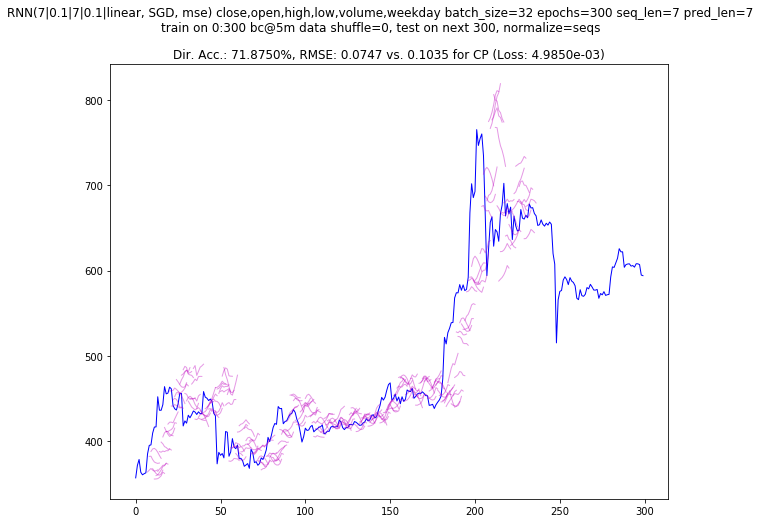

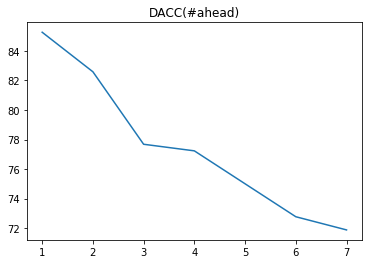

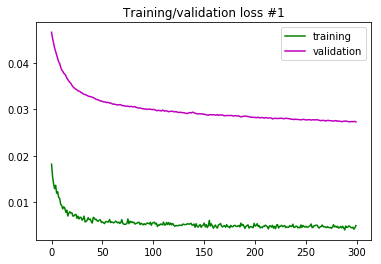

--- 73.699s to run experiment



In [3]:
with timing('run experiment'):
    res = run_walk_forward_validation_rnn(
        # data to extract:
        data24h,
        features=[
            'close',
            'open', 'high', 'low',
            'volume',
            'weekday'
        ],
        from_i=0,
        train_sz=300,
        test_sz=300,
        # data processing:
        normalize='seqs',  # 'seqs' | 'data'
        detrend=False,
        # model and prediction arrangement:
        seq_len=7,
        pred_len=7,
        model_maker=make_rnn_model_constructor(
            [7, 0.1, 7, 0.1],
#             lr=1e-2,
            optimizer=keras.optimizers.SGD
        ),
        # training:
        epochs=300,
        batch_size=32,
        shuffle=False,
        # experiment setup:
        times=1,
        skip=False,
        fix_all_rngs_to=False,
        fix_rngs_before_each=False,
        # plotting:
        fig_size=(10, 8),
        fast=True,
    )
    plot_train_val_losses(res['train_val_losses'])

data ~ (600, 6)
--- 0.015s to model compilation time


--- Created model id: 140629450417104
Tensor("lstm_39_input:0", shape=(?, 7, 6), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_39 (LSTM)               (None, 7, 7)              392       
_________________________________________________________________
dropout_39 (Dropout)         (None, 7, 7)              0         
_________________________________________________________________
lstm_40 (LSTM)               (None, 7)                 420       
_________________________________________________________________
dropout_40 (Dropout)         (None, 7)                 0         
_________________________________________________________________
dense_20 (Dense)             (None, 1)                 8         
Total params: 820
Trainable params: 820
Non-trainable params: 0
___________________________________________________________

262/262 [==============================] - 0s 769us/step - loss: 0.0052 - val_loss: 0.0224
Epoch 32/100
262/262 [==============================] - 0s 763us/step - loss: 0.0052 - val_loss: 0.0223
Epoch 33/100
262/262 [==============================] - 0s 752us/step - loss: 0.0050 - val_loss: 0.0223
Epoch 34/100
262/262 [==============================] - 0s 784us/step - loss: 0.0048 - val_loss: 0.0223
Epoch 35/100
262/262 [==============================] - 0s 790us/step - loss: 0.0049 - val_loss: 0.0223
Epoch 36/100
262/262 [==============================] - 0s 769us/step - loss: 0.0053 - val_loss: 0.0222
Epoch 37/100
262/262 [==============================] - 0s 755us/step - loss: 0.0048 - val_loss: 0.0222
Epoch 38/100
262/262 [==============================] - 0s 721us/step - loss: 0.0049 - val_loss: 0.0222
Epoch 39/100
262/262 [==============================] - 0s 773us/step - loss: 0.0045 - val_loss: 0.0222
Epoch 40/100
262/262 [==============================] - 0s 774us/step - loss:

Train on 262 samples, validate on 30 samples
Epoch 1/100
262/262 [==============================] - 4s 17ms/step - loss: 0.0219 - val_loss: 0.0295
Epoch 2/100
262/262 [==============================] - 0s 726us/step - loss: 0.0193 - val_loss: 0.0278
Epoch 3/100
262/262 [==============================] - 0s 750us/step - loss: 0.0160 - val_loss: 0.0265
Epoch 4/100
262/262 [==============================] - 0s 754us/step - loss: 0.0147 - val_loss: 0.0254
Epoch 5/100
262/262 [==============================] - 0s 748us/step - loss: 0.0140 - val_loss: 0.0244
Epoch 6/100
262/262 [==============================] - 0s 745us/step - loss: 0.0133 - val_loss: 0.0235
Epoch 7/100
262/262 [==============================] - 0s 769us/step - loss: 0.0109 - val_loss: 0.0228
Epoch 8/100
262/262 [==============================] - 0s 728us/step - loss: 0.0108 - val_loss: 0.0221
Epoch 9/100
262/262 [==============================] - 0s 794us/step - loss: 0.0099 - val_loss: 0.0216
Epoch 10/100
262/262 [=======

262/262 [==============================] - 0s 752us/step - loss: 0.0047 - val_loss: 0.0239
Epoch 44/100
262/262 [==============================] - 0s 782us/step - loss: 0.0050 - val_loss: 0.0239
Epoch 45/100
262/262 [==============================] - 0s 791us/step - loss: 0.0049 - val_loss: 0.0239
Epoch 46/100
262/262 [==============================] - 0s 771us/step - loss: 0.0045 - val_loss: 0.0239
Epoch 47/100
262/262 [==============================] - 0s 741us/step - loss: 0.0046 - val_loss: 0.0239
Epoch 48/100
262/262 [==============================] - 0s 721us/step - loss: 0.0045 - val_loss: 0.0239
Epoch 49/100
262/262 [==============================] - 0s 745us/step - loss: 0.0047 - val_loss: 0.0239
Epoch 50/100
262/262 [==============================] - 0s 757us/step - loss: 0.0046 - val_loss: 0.0238
Epoch 51/100
262/262 [==============================] - 0s 772us/step - loss: 0.0040 - val_loss: 0.0237
Epoch 52/100
262/262 [==============================] - 0s 833us/step - loss:

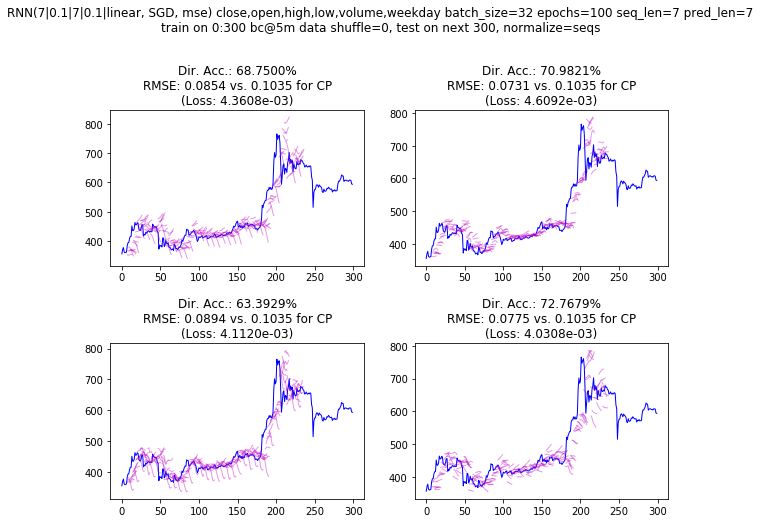

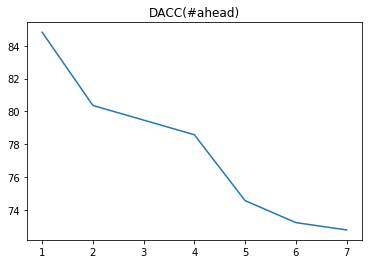

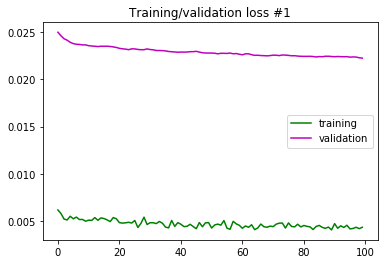

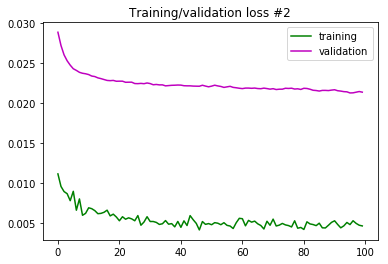

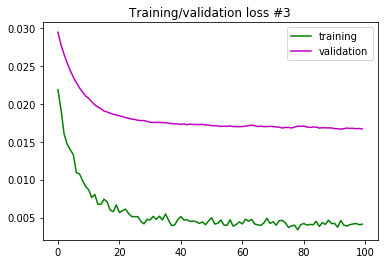

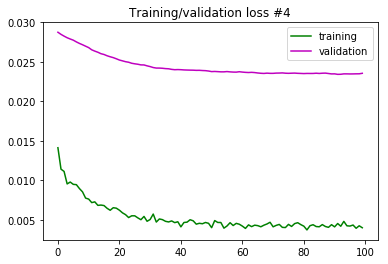

--- 110.896s to run experiment



In [11]:
with timing('run experiment'):
    res = run_walk_forward_validation_rnn(
        # data to extract:
        data24h,
        features=[
            'close',
            'open', 'high', 'low',
            'volume',
            'weekday'
        ],
        from_i=0,
        train_sz=300,
        test_sz=300,
        # data processing:
        normalize='seqs',  # 'seqs' | 'data'
        detrend=False,
        # model and prediction arrangement:
        seq_len=7,
        pred_len=7,
        model_maker=make_rnn_model_constructor(
            [7, 0.1, 7, 0.1],
#             lr=1e-2,
            optimizer=keras.optimizers.SGD
        ),
        # training:
        epochs=100,
        batch_size=32,
        shuffle=False,
        # experiment setup:
        times=4,
        skip=False,
        fix_all_rngs_to=False,
        fix_rngs_before_each=False,
        # plotting:
        fig_size=(10, 8),
        fast=True,
    )
    plot_train_val_losses(res['train_val_losses'])

### SGD without dropout

data ~ (600, 6)
--- 0.015s to model compilation time


--- Created model id: 140629273916240
Tensor("lstm_55_input:0", shape=(?, 7, 6), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_55 (LSTM)               (None, 7, 7)              392       
_________________________________________________________________
lstm_56 (LSTM)               (None, 7)                 420       
_________________________________________________________________
dense_28 (Dense)             (None, 1)                 8         
Total params: 820
Trainable params: 820
Non-trainable params: 0
_________________________________________________________________
None
Tensor("dense_28/BiasAdd:0", shape=(?, 1), dtype=float32)

Train on 262 samples, validate on 30 samples
Epoch 1/100
262/262 [==============================] - 5s 20ms/step - loss: 0.0153 - val_loss: 0.0289
Epoch 2/100
262/262 [=========================

Epoch 70/100
262/262 [==============================] - 0s 744us/step - loss: 0.0045 - val_loss: 0.0222
Epoch 71/100
262/262 [==============================] - 0s 726us/step - loss: 0.0045 - val_loss: 0.0222
Epoch 72/100
262/262 [==============================] - 0s 720us/step - loss: 0.0045 - val_loss: 0.0222
Epoch 73/100
262/262 [==============================] - 0s 697us/step - loss: 0.0045 - val_loss: 0.0222
Epoch 74/100
262/262 [==============================] - 0s 755us/step - loss: 0.0045 - val_loss: 0.0222
Epoch 75/100
262/262 [==============================] - 0s 721us/step - loss: 0.0044 - val_loss: 0.0222
Epoch 76/100
262/262 [==============================] - 0s 711us/step - loss: 0.0044 - val_loss: 0.0222
Epoch 77/100
262/262 [==============================] - 0s 698us/step - loss: 0.0044 - val_loss: 0.0222
Epoch 78/100
262/262 [==============================] - 0s 722us/step - loss: 0.0044 - val_loss: 0.0222
Epoch 79/100
262/262 [==============================] - 0s 728us

262/262 [==============================] - 0s 736us/step - loss: 0.0050 - val_loss: 0.0255
Epoch 3/100
262/262 [==============================] - 0s 724us/step - loss: 0.0049 - val_loss: 0.0257
Epoch 4/100
262/262 [==============================] - 0s 770us/step - loss: 0.0049 - val_loss: 0.0257
Epoch 5/100
262/262 [==============================] - 0s 722us/step - loss: 0.0048 - val_loss: 0.0258
Epoch 6/100
262/262 [==============================] - 0s 721us/step - loss: 0.0048 - val_loss: 0.0258
Epoch 7/100
262/262 [==============================] - 0s 737us/step - loss: 0.0048 - val_loss: 0.0258
Epoch 8/100
262/262 [==============================] - 0s 751us/step - loss: 0.0047 - val_loss: 0.0258
Epoch 9/100
262/262 [==============================] - 0s 782us/step - loss: 0.0047 - val_loss: 0.0258
Epoch 10/100
262/262 [==============================] - 0s 733us/step - loss: 0.0047 - val_loss: 0.0258
Epoch 11/100
262/262 [==============================] - 0s 722us/step - loss: 0.0047

Epoch 81/100
262/262 [==============================] - 0s 755us/step - loss: 0.0043 - val_loss: 0.0259
Epoch 82/100
262/262 [==============================] - 0s 755us/step - loss: 0.0043 - val_loss: 0.0259
Epoch 83/100
262/262 [==============================] - 0s 716us/step - loss: 0.0043 - val_loss: 0.0259
Epoch 84/100
262/262 [==============================] - 0s 806us/step - loss: 0.0043 - val_loss: 0.0259
Epoch 85/100
262/262 [==============================] - 0s 763us/step - loss: 0.0043 - val_loss: 0.0259
Epoch 86/100
262/262 [==============================] - 0s 738us/step - loss: 0.0043 - val_loss: 0.0259
Epoch 87/100
262/262 [==============================] - 0s 756us/step - loss: 0.0043 - val_loss: 0.0259
Epoch 88/100
262/262 [==============================] - 0s 764us/step - loss: 0.0043 - val_loss: 0.0259
Epoch 89/100
262/262 [==============================] - 0s 767us/step - loss: 0.0043 - val_loss: 0.0259
Epoch 90/100
262/262 [==============================] - 0s 712us

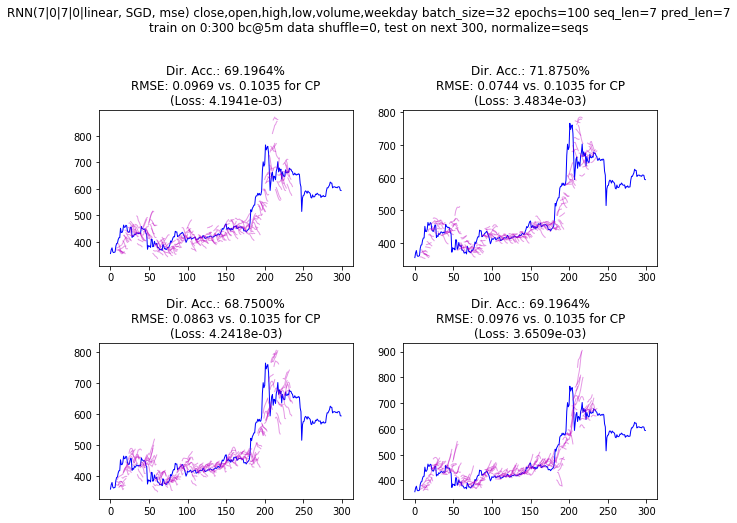

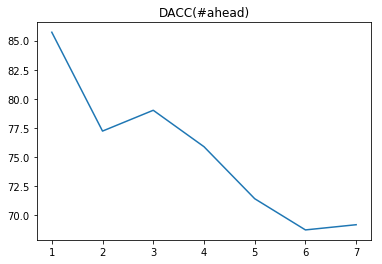

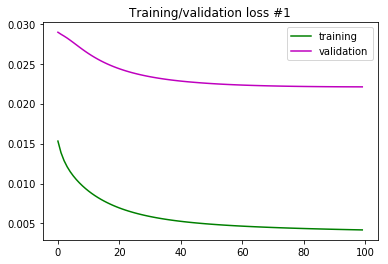

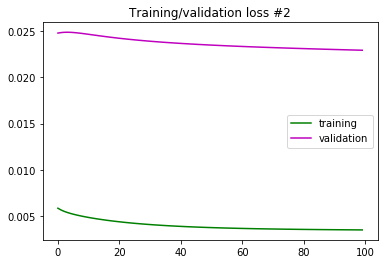

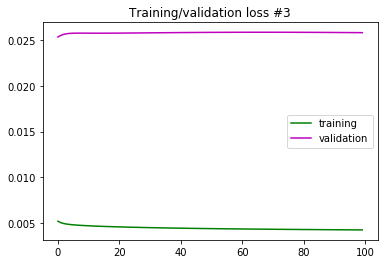

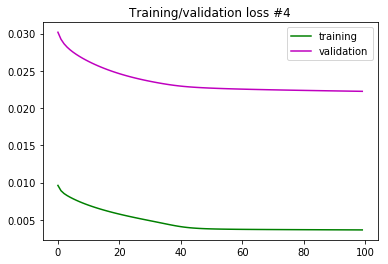

--- 117.264s to run experiment



In [13]:
with timing('run experiment'):
    res = run_walk_forward_validation_rnn(
        # data to extract:
        data24h,
        features=[
            'close',
            'open', 'high', 'low',
            'volume',
            'weekday'
        ],
        from_i=0,
        train_sz=300,
        test_sz=300,
        # data processing:
        normalize='seqs',  # 'seqs' | 'data'
        detrend=False,
        # model and prediction arrangement:
        seq_len=7,
        pred_len=7,
        model_maker=make_rnn_model_constructor(
            [7, 0, 7, 0],
#             lr=1e-2,
            optimizer=keras.optimizers.SGD
        ),
        # training:
        epochs=100,
        batch_size=32,
        shuffle=False,
        # experiment setup:
        times=4,
        skip=False,
        fix_all_rngs_to=False,
        fix_rngs_before_each=False,
        # plotting:
        fig_size=(10, 8),
        fast=True,
    )
    plot_train_val_losses(res['train_val_losses'])

### RMSprop with dropout

data ~ (600, 6)
--- 0.017s to model compilation time


--- Created model id: 140513202915664
Tensor("lstm_3_input:0", shape=(?, 7, 6), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_3 (LSTM)                (None, 7, 7)              392       
_________________________________________________________________
dropout_3 (Dropout)          (None, 7, 7)              0         
_________________________________________________________________
lstm_4 (LSTM)                (None, 7)                 420       
_________________________________________________________________
dropout_4 (Dropout)          (None, 7)                 0         
_________________________________________________________________
dense_2 (Dense)              (None, 1)                 8         
Total params: 820
Trainable params: 820
Non-trainable params: 0
____________________________________________________________

Epoch 68/200
262/262 [==============================] - 0s 855us/step - loss: 0.0050 - val_loss: 0.0273
Epoch 69/200
262/262 [==============================] - 0s 872us/step - loss: 0.0049 - val_loss: 0.0272
Epoch 70/200
262/262 [==============================] - 0s 900us/step - loss: 0.0049 - val_loss: 0.0270
Epoch 71/200
262/262 [==============================] - 0s 873us/step - loss: 0.0049 - val_loss: 0.0269
Epoch 72/200
262/262 [==============================] - 0s 842us/step - loss: 0.0047 - val_loss: 0.0268
Epoch 73/200
262/262 [==============================] - 0s 850us/step - loss: 0.0049 - val_loss: 0.0267
Epoch 74/200
262/262 [==============================] - 0s 846us/step - loss: 0.0048 - val_loss: 0.0266
Epoch 75/200
262/262 [==============================] - 0s 889us/step - loss: 0.0050 - val_loss: 0.0265
Epoch 76/200
262/262 [==============================] - 0s 928us/step - loss: 0.0045 - val_loss: 0.0264
Epoch 77/200
262/262 [==============================] - 0s 883us

262/262 [==============================] - 0s 762us/step - loss: 0.0036 - val_loss: 0.0223
Epoch 147/200
262/262 [==============================] - 0s 792us/step - loss: 0.0035 - val_loss: 0.0223
Epoch 148/200
262/262 [==============================] - 0s 811us/step - loss: 0.0038 - val_loss: 0.0222
Epoch 149/200
262/262 [==============================] - 0s 834us/step - loss: 0.0036 - val_loss: 0.0222
Epoch 150/200
262/262 [==============================] - 0s 750us/step - loss: 0.0034 - val_loss: 0.0221
Epoch 151/200
262/262 [==============================] - 0s 844us/step - loss: 0.0036 - val_loss: 0.0221
Epoch 152/200
262/262 [==============================] - 0s 830us/step - loss: 0.0038 - val_loss: 0.0220
Epoch 153/200
262/262 [==============================] - 0s 822us/step - loss: 0.0036 - val_loss: 0.0220
Epoch 154/200
262/262 [==============================] - 0s 791us/step - loss: 0.0037 - val_loss: 0.0220
Epoch 155/200
262/262 [==============================] - 0s 789us/ste

Epoch 10/200
262/262 [==============================] - 0s 761us/step - loss: 0.0105 - val_loss: 0.0348
Epoch 11/200
262/262 [==============================] - 0s 767us/step - loss: 0.0101 - val_loss: 0.0345
Epoch 12/200
262/262 [==============================] - 0s 841us/step - loss: 0.0097 - val_loss: 0.0343
Epoch 13/200
262/262 [==============================] - 0s 815us/step - loss: 0.0092 - val_loss: 0.0340
Epoch 14/200
262/262 [==============================] - 0s 781us/step - loss: 0.0087 - val_loss: 0.0338
Epoch 15/200
262/262 [==============================] - 0s 812us/step - loss: 0.0085 - val_loss: 0.0336
Epoch 16/200
262/262 [==============================] - 0s 752us/step - loss: 0.0088 - val_loss: 0.0333
Epoch 17/200
262/262 [==============================] - 0s 785us/step - loss: 0.0086 - val_loss: 0.0331
Epoch 18/200
262/262 [==============================] - 0s 789us/step - loss: 0.0085 - val_loss: 0.0329
Epoch 19/200
262/262 [==============================] - 0s 783us

262/262 [==============================] - 0s 791us/step - loss: 0.0039 - val_loss: 0.0244
Epoch 89/200
262/262 [==============================] - 0s 804us/step - loss: 0.0044 - val_loss: 0.0244
Epoch 90/200
262/262 [==============================] - 0s 792us/step - loss: 0.0039 - val_loss: 0.0243
Epoch 91/200
262/262 [==============================] - 0s 749us/step - loss: 0.0041 - val_loss: 0.0243
Epoch 92/200
262/262 [==============================] - 0s 769us/step - loss: 0.0038 - val_loss: 0.0242
Epoch 93/200
262/262 [==============================] - 0s 788us/step - loss: 0.0038 - val_loss: 0.0242
Epoch 94/200
262/262 [==============================] - 0s 772us/step - loss: 0.0041 - val_loss: 0.0241
Epoch 95/200
262/262 [==============================] - 0s 779us/step - loss: 0.0036 - val_loss: 0.0240
Epoch 96/200
262/262 [==============================] - 0s 800us/step - loss: 0.0040 - val_loss: 0.0240
Epoch 97/200
262/262 [==============================] - 0s 799us/step - loss:

262/262 [==============================] - 0s 851us/step - loss: 0.0032 - val_loss: 0.0209
Epoch 167/200
262/262 [==============================] - 0s 768us/step - loss: 0.0032 - val_loss: 0.0209
Epoch 168/200
262/262 [==============================] - 0s 771us/step - loss: 0.0031 - val_loss: 0.0209
Epoch 169/200
262/262 [==============================] - 0s 820us/step - loss: 0.0030 - val_loss: 0.0208
Epoch 170/200
262/262 [==============================] - 0s 805us/step - loss: 0.0031 - val_loss: 0.0208
Epoch 171/200
262/262 [==============================] - 0s 808us/step - loss: 0.0030 - val_loss: 0.0207
Epoch 172/200
262/262 [==============================] - 0s 816us/step - loss: 0.0033 - val_loss: 0.0207
Epoch 173/200
262/262 [==============================] - 0s 811us/step - loss: 0.0034 - val_loss: 0.0206
Epoch 174/200
262/262 [==============================] - 0s 803us/step - loss: 0.0031 - val_loss: 0.0206
Epoch 175/200
262/262 [==============================] - 0s 772us/ste

262/262 [==============================] - 0s 973us/step - loss: 0.0040 - val_loss: 0.0233
Epoch 31/200
262/262 [==============================] - 0s 1ms/step - loss: 0.0037 - val_loss: 0.0232
Epoch 32/200
262/262 [==============================] - 0s 1ms/step - loss: 0.0040 - val_loss: 0.0232
Epoch 33/200
262/262 [==============================] - 0s 998us/step - loss: 0.0042 - val_loss: 0.0232
Epoch 34/200
262/262 [==============================] - 0s 968us/step - loss: 0.0037 - val_loss: 0.0232
Epoch 35/200
262/262 [==============================] - 0s 955us/step - loss: 0.0038 - val_loss: 0.0232
Epoch 36/200
262/262 [==============================] - 0s 878us/step - loss: 0.0038 - val_loss: 0.0232
Epoch 37/200
262/262 [==============================] - 0s 875us/step - loss: 0.0039 - val_loss: 0.0232
Epoch 38/200
262/262 [==============================] - 0s 924us/step - loss: 0.0040 - val_loss: 0.0232
Epoch 39/200
262/262 [==============================] - 0s 985us/step - loss: 0.0

Epoch 109/200
262/262 [==============================] - 0s 897us/step - loss: 0.0034 - val_loss: 0.0220
Epoch 110/200
262/262 [==============================] - 0s 911us/step - loss: 0.0034 - val_loss: 0.0220
Epoch 111/200
262/262 [==============================] - 0s 830us/step - loss: 0.0035 - val_loss: 0.0220
Epoch 112/200
262/262 [==============================] - 0s 876us/step - loss: 0.0035 - val_loss: 0.0219
Epoch 113/200
262/262 [==============================] - 0s 939us/step - loss: 0.0032 - val_loss: 0.0219
Epoch 114/200
262/262 [==============================] - 0s 905us/step - loss: 0.0035 - val_loss: 0.0219
Epoch 115/200
262/262 [==============================] - 0s 891us/step - loss: 0.0036 - val_loss: 0.0219
Epoch 116/200
262/262 [==============================] - 0s 910us/step - loss: 0.0036 - val_loss: 0.0218
Epoch 117/200
262/262 [==============================] - 0s 884us/step - loss: 0.0036 - val_loss: 0.0218
Epoch 118/200
262/262 [==============================] 

262/262 [==============================] - 0s 844us/step - loss: 0.0030 - val_loss: 0.0196
Epoch 188/200
262/262 [==============================] - 0s 857us/step - loss: 0.0030 - val_loss: 0.0195
Epoch 189/200
262/262 [==============================] - 0s 857us/step - loss: 0.0031 - val_loss: 0.0195
Epoch 190/200
262/262 [==============================] - 0s 840us/step - loss: 0.0030 - val_loss: 0.0195
Epoch 191/200
262/262 [==============================] - 0s 895us/step - loss: 0.0031 - val_loss: 0.0194
Epoch 192/200
262/262 [==============================] - 0s 830us/step - loss: 0.0030 - val_loss: 0.0194
Epoch 193/200
262/262 [==============================] - 0s 820us/step - loss: 0.0029 - val_loss: 0.0193
Epoch 194/200
262/262 [==============================] - 0s 814us/step - loss: 0.0030 - val_loss: 0.0193
Epoch 195/200
262/262 [==============================] - 0s 771us/step - loss: 0.0032 - val_loss: 0.0192
Epoch 196/200
262/262 [==============================] - 0s 857us/ste

262/262 [==============================] - 0s 811us/step - loss: 0.0050 - val_loss: 0.0213
Epoch 52/200
262/262 [==============================] - 0s 831us/step - loss: 0.0051 - val_loss: 0.0214
Epoch 53/200
262/262 [==============================] - 0s 805us/step - loss: 0.0048 - val_loss: 0.0213
Epoch 54/200
262/262 [==============================] - 0s 866us/step - loss: 0.0046 - val_loss: 0.0213
Epoch 55/200
262/262 [==============================] - 0s 774us/step - loss: 0.0050 - val_loss: 0.0212
Epoch 56/200
262/262 [==============================] - 0s 784us/step - loss: 0.0041 - val_loss: 0.0212
Epoch 57/200
262/262 [==============================] - 0s 816us/step - loss: 0.0047 - val_loss: 0.0212
Epoch 58/200
262/262 [==============================] - 0s 790us/step - loss: 0.0043 - val_loss: 0.0212
Epoch 59/200
262/262 [==============================] - 0s 815us/step - loss: 0.0048 - val_loss: 0.0212
Epoch 60/200
262/262 [==============================] - 0s 798us/step - loss:

262/262 [==============================] - 0s 972us/step - loss: 0.0039 - val_loss: 0.0196
Epoch 130/200
262/262 [==============================] - 0s 884us/step - loss: 0.0035 - val_loss: 0.0195
Epoch 131/200
262/262 [==============================] - 0s 899us/step - loss: 0.0034 - val_loss: 0.0195
Epoch 132/200
262/262 [==============================] - 0s 947us/step - loss: 0.0035 - val_loss: 0.0195
Epoch 133/200
262/262 [==============================] - 0s 882us/step - loss: 0.0036 - val_loss: 0.0194
Epoch 134/200
262/262 [==============================] - 0s 861us/step - loss: 0.0037 - val_loss: 0.0194
Epoch 135/200
262/262 [==============================] - 0s 880us/step - loss: 0.0040 - val_loss: 0.0193
Epoch 136/200
262/262 [==============================] - 0s 863us/step - loss: 0.0035 - val_loss: 0.0193
Epoch 137/200
262/262 [==============================] - 0s 812us/step - loss: 0.0034 - val_loss: 0.0192
Epoch 138/200
262/262 [==============================] - 0s 903us/ste

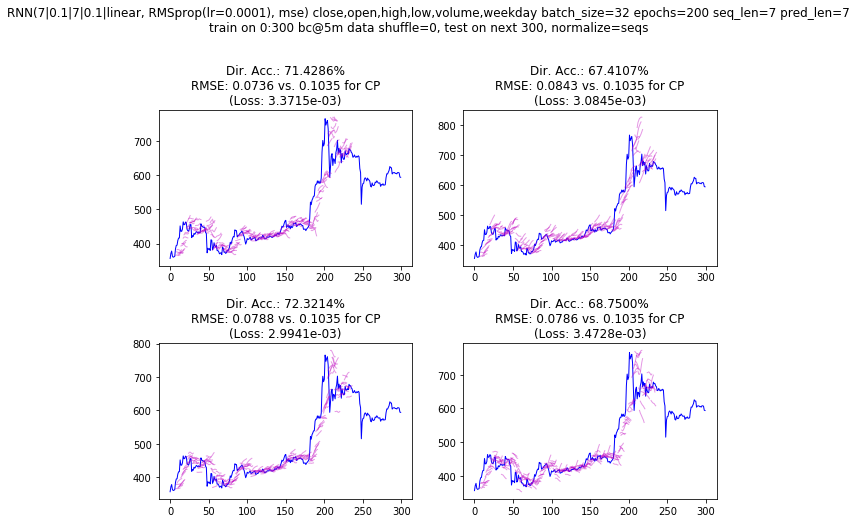

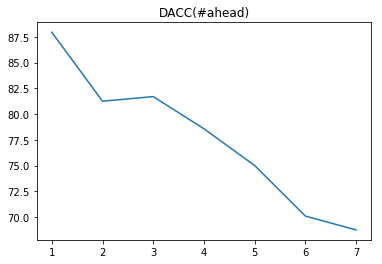

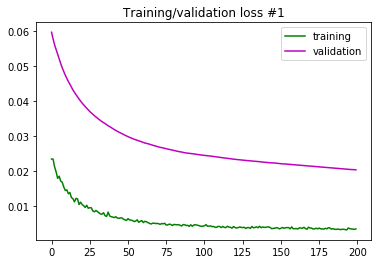

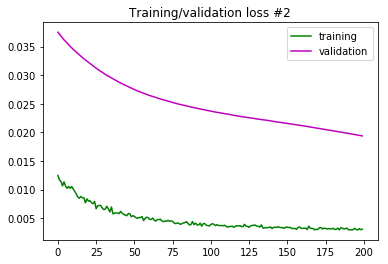

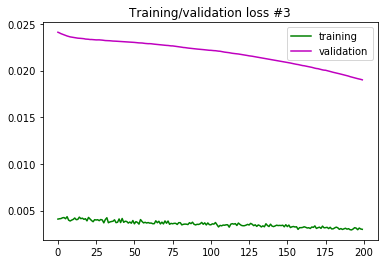

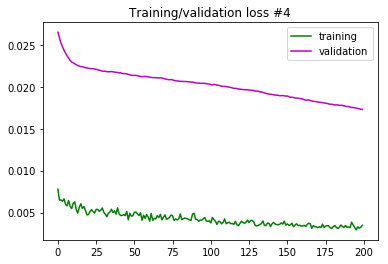

--- 200.355s to run experiment



In [4]:
with timing('run experiment'):
    res = run_walk_forward_validation_rnn(
        # data to extract:
        data24h,
        features=[
            'close',
            'open', 'high', 'low',
            'volume',
            'weekday'
        ],
        from_i=0,
        train_sz=300,
        test_sz=300,
        # data processing:
        normalize='seqs',  # 'seqs' | 'data'
        detrend=False,
        # model and prediction arrangement:
        seq_len=7,
        pred_len=7,
        model_maker=make_rnn_model_constructor(
            [7, 0.1, 7, 0.1],
            lr=1e-4,
            optimizer=keras.optimizers.RMSprop
        ),
        # training:
        epochs=200,
        batch_size=32,
        shuffle=False,
        # experiment setup:
        times=4,
        skip=False,
        fix_all_rngs_to=False,
        fix_rngs_before_each=False,
        # plotting:
        fig_size=(10, 8),
        fast=True,
    )
    plot_train_val_losses(res['train_val_losses'])

data ~ (600, 6)
--- 0.015s to model compilation time


--- Created model id: 140629450342032
Tensor("lstm_47_input:0", shape=(?, 7, 6), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_47 (LSTM)               (None, 7, 7)              392       
_________________________________________________________________
dropout_47 (Dropout)         (None, 7, 7)              0         
_________________________________________________________________
lstm_48 (LSTM)               (None, 7)                 420       
_________________________________________________________________
dropout_48 (Dropout)         (None, 7)                 0         
_________________________________________________________________
dense_24 (Dense)             (None, 1)                 8         
Total params: 820
Trainable params: 820
Non-trainable params: 0
___________________________________________________________

Epoch 68/100
262/262 [==============================] - 0s 798us/step - loss: 0.0042 - val_loss: 0.0256
Epoch 69/100
262/262 [==============================] - 0s 773us/step - loss: 0.0043 - val_loss: 0.0255
Epoch 70/100
262/262 [==============================] - 0s 753us/step - loss: 0.0043 - val_loss: 0.0254
Epoch 71/100
262/262 [==============================] - 0s 775us/step - loss: 0.0045 - val_loss: 0.0254
Epoch 72/100
262/262 [==============================] - 0s 844us/step - loss: 0.0043 - val_loss: 0.0253
Epoch 73/100
262/262 [==============================] - 0s 869us/step - loss: 0.0041 - val_loss: 0.0252
Epoch 74/100
262/262 [==============================] - 0s 801us/step - loss: 0.0042 - val_loss: 0.0251
Epoch 75/100
262/262 [==============================] - 0s 810us/step - loss: 0.0040 - val_loss: 0.0249
Epoch 76/100
262/262 [==============================] - 0s 771us/step - loss: 0.0044 - val_loss: 0.0248
Epoch 77/100
262/262 [==============================] - 0s 773us

262/262 [==============================] - 0s 806us/step - loss: 0.0051 - val_loss: 0.0278
Epoch 33/100
262/262 [==============================] - 0s 741us/step - loss: 0.0047 - val_loss: 0.0277
Epoch 34/100
262/262 [==============================] - 0s 844us/step - loss: 0.0046 - val_loss: 0.0276
Epoch 35/100
262/262 [==============================] - 0s 804us/step - loss: 0.0044 - val_loss: 0.0276
Epoch 36/100
262/262 [==============================] - 0s 783us/step - loss: 0.0044 - val_loss: 0.0275
Epoch 37/100
262/262 [==============================] - 0s 791us/step - loss: 0.0045 - val_loss: 0.0274
Epoch 38/100
262/262 [==============================] - 0s 752us/step - loss: 0.0044 - val_loss: 0.0273
Epoch 39/100
262/262 [==============================] - 0s 749us/step - loss: 0.0042 - val_loss: 0.0273
Epoch 40/100
262/262 [==============================] - 0s 728us/step - loss: 0.0045 - val_loss: 0.0272
Epoch 41/100
262/262 [==============================] - 0s 752us/step - loss:

Train on 262 samples, validate on 30 samples
Epoch 1/100
262/262 [==============================] - 5s 17ms/step - loss: 0.0081 - val_loss: 0.0199
Epoch 2/100
262/262 [==============================] - 0s 764us/step - loss: 0.0074 - val_loss: 0.0199
Epoch 3/100
262/262 [==============================] - 0s 776us/step - loss: 0.0079 - val_loss: 0.0200
Epoch 4/100
262/262 [==============================] - 0s 741us/step - loss: 0.0071 - val_loss: 0.0200
Epoch 5/100
262/262 [==============================] - 0s 762us/step - loss: 0.0061 - val_loss: 0.0201
Epoch 6/100
262/262 [==============================] - 0s 775us/step - loss: 0.0067 - val_loss: 0.0201
Epoch 7/100
262/262 [==============================] - 0s 791us/step - loss: 0.0056 - val_loss: 0.0202
Epoch 8/100
262/262 [==============================] - 0s 775us/step - loss: 0.0064 - val_loss: 0.0203
Epoch 9/100
262/262 [==============================] - 0s 812us/step - loss: 0.0057 - val_loss: 0.0203
Epoch 10/100
262/262 [=======

262/262 [==============================] - 0s 786us/step - loss: 0.0049 - val_loss: 0.0203
Epoch 44/100
262/262 [==============================] - 0s 734us/step - loss: 0.0056 - val_loss: 0.0201
Epoch 45/100
262/262 [==============================] - 0s 750us/step - loss: 0.0060 - val_loss: 0.0199
Epoch 46/100
262/262 [==============================] - 0s 746us/step - loss: 0.0067 - val_loss: 0.0199
Epoch 47/100
262/262 [==============================] - 0s 803us/step - loss: 0.0070 - val_loss: 0.0198
Epoch 48/100
262/262 [==============================] - 0s 721us/step - loss: 0.0058 - val_loss: 0.0197
Epoch 49/100
262/262 [==============================] - 0s 742us/step - loss: 0.0070 - val_loss: 0.0197
Epoch 50/100
262/262 [==============================] - 0s 763us/step - loss: 0.0064 - val_loss: 0.0195
Epoch 51/100
262/262 [==============================] - 0s 778us/step - loss: 0.0053 - val_loss: 0.0194
Epoch 52/100
262/262 [==============================] - 0s 807us/step - loss:

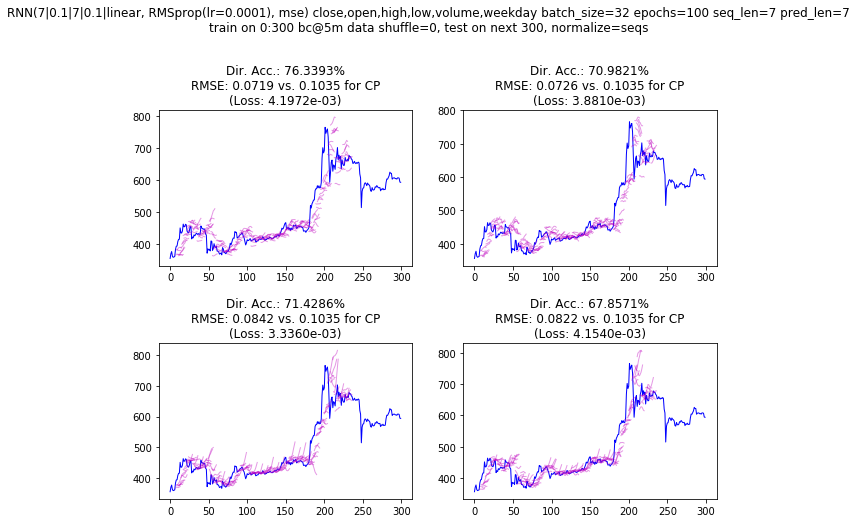

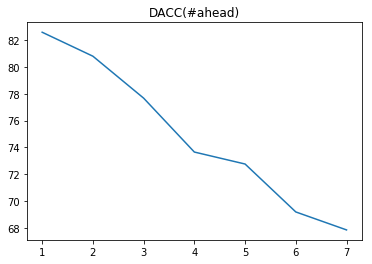

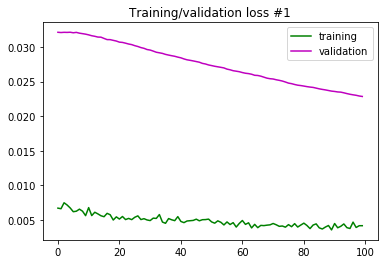

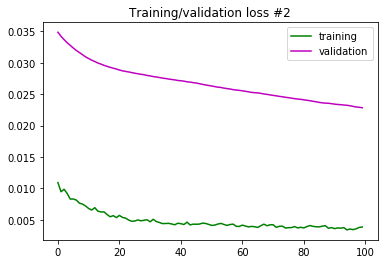

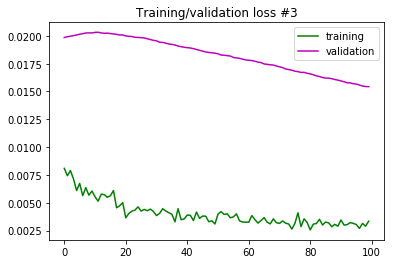

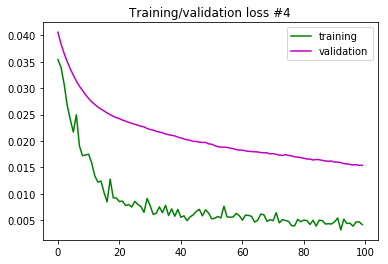

--- 116.912s to run experiment



In [12]:
with timing('run experiment'):
    res = run_walk_forward_validation_rnn(
        # data to extract:
        data24h,
        features=[
            'close',
            'open', 'high', 'low',
            'volume',
            'weekday'
        ],
        from_i=0,
        train_sz=300,
        test_sz=300,
        # data processing:
        normalize='seqs',  # 'seqs' | 'data'
        detrend=False,
        # model and prediction arrangement:
        seq_len=7,
        pred_len=7,
        model_maker=make_rnn_model_constructor(
            [7, 0.1, 7, 0.1],
            lr=1e-4,
            optimizer=keras.optimizers.RMSprop
        ),
        # training:
        epochs=100,
        batch_size=32,
        shuffle=False,
        # experiment setup:
        times=4,
        skip=False,
        fix_all_rngs_to=False,
        fix_rngs_before_each=False,
        # plotting:
        fig_size=(10, 8),
        fast=True,
    )
    plot_train_val_losses(res['train_val_losses'])

### RMSprop without dropout

data ~ (600, 6)
--- 0.014s to model compilation time


--- Created model id: 140629189850896
Tensor("lstm_63_input:0", shape=(?, 7, 6), dtype=float32)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_63 (LSTM)               (None, 7, 7)              392       
_________________________________________________________________
lstm_64 (LSTM)               (None, 7)                 420       
_________________________________________________________________
dense_32 (Dense)             (None, 1)                 8         
Total params: 820
Trainable params: 820
Non-trainable params: 0
_________________________________________________________________
None
Tensor("dense_32/BiasAdd:0", shape=(?, 1), dtype=float32)

Train on 262 samples, validate on 30 samples
Epoch 1/100
262/262 [==============================] - 5s 20ms/step - loss: 0.0058 - val_loss: 0.0239
Epoch 2/100
262/262 [=========================

Epoch 37/100
262/262 [==============================] - 0s 777us/step - loss: 0.0039 - val_loss: 0.0244
Epoch 38/100
262/262 [==============================] - 0s 760us/step - loss: 0.0038 - val_loss: 0.0244
Epoch 39/100
262/262 [==============================] - 0s 788us/step - loss: 0.0038 - val_loss: 0.0244
Epoch 40/100
262/262 [==============================] - 0s 862us/step - loss: 0.0038 - val_loss: 0.0244
Epoch 41/100
262/262 [==============================] - 0s 772us/step - loss: 0.0038 - val_loss: 0.0244
Epoch 42/100
262/262 [==============================] - 0s 752us/step - loss: 0.0038 - val_loss: 0.0244
Epoch 43/100
262/262 [==============================] - 0s 739us/step - loss: 0.0038 - val_loss: 0.0244
Epoch 44/100
262/262 [==============================] - 0s 759us/step - loss: 0.0038 - val_loss: 0.0243
Epoch 45/100
262/262 [==============================] - 0s 749us/step - loss: 0.0038 - val_loss: 0.0243
Epoch 46/100
262/262 [==============================] - 0s 729us

262/262 [==============================] - 0s 782us/step - loss: 0.0033 - val_loss: 0.0197
Epoch 82/100
262/262 [==============================] - 0s 764us/step - loss: 0.0033 - val_loss: 0.0197
Epoch 83/100
262/262 [==============================] - 0s 796us/step - loss: 0.0033 - val_loss: 0.0196
Epoch 84/100
262/262 [==============================] - 0s 784us/step - loss: 0.0033 - val_loss: 0.0196
Epoch 85/100
262/262 [==============================] - 0s 843us/step - loss: 0.0033 - val_loss: 0.0195
Epoch 86/100
262/262 [==============================] - 0s 799us/step - loss: 0.0033 - val_loss: 0.0195
Epoch 87/100
262/262 [==============================] - 0s 810us/step - loss: 0.0033 - val_loss: 0.0194
Epoch 88/100
262/262 [==============================] - 0s 727us/step - loss: 0.0033 - val_loss: 0.0194
Epoch 89/100
262/262 [==============================] - 0s 776us/step - loss: 0.0033 - val_loss: 0.0193
Epoch 90/100
262/262 [==============================] - 0s 771us/step - loss:

Epoch 48/100
262/262 [==============================] - 0s 728us/step - loss: 0.0036 - val_loss: 0.0191
Epoch 49/100
262/262 [==============================] - 0s 779us/step - loss: 0.0036 - val_loss: 0.0191
Epoch 50/100
262/262 [==============================] - 0s 816us/step - loss: 0.0036 - val_loss: 0.0190
Epoch 51/100
262/262 [==============================] - 0s 780us/step - loss: 0.0036 - val_loss: 0.0190
Epoch 52/100
262/262 [==============================] - 0s 733us/step - loss: 0.0035 - val_loss: 0.0190
Epoch 53/100
262/262 [==============================] - 0s 779us/step - loss: 0.0035 - val_loss: 0.0189
Epoch 54/100
262/262 [==============================] - 0s 747us/step - loss: 0.0035 - val_loss: 0.0189
Epoch 55/100
262/262 [==============================] - 0s 777us/step - loss: 0.0035 - val_loss: 0.0189
Epoch 56/100
262/262 [==============================] - 0s 746us/step - loss: 0.0035 - val_loss: 0.0188
Epoch 57/100
262/262 [==============================] - 0s 764us

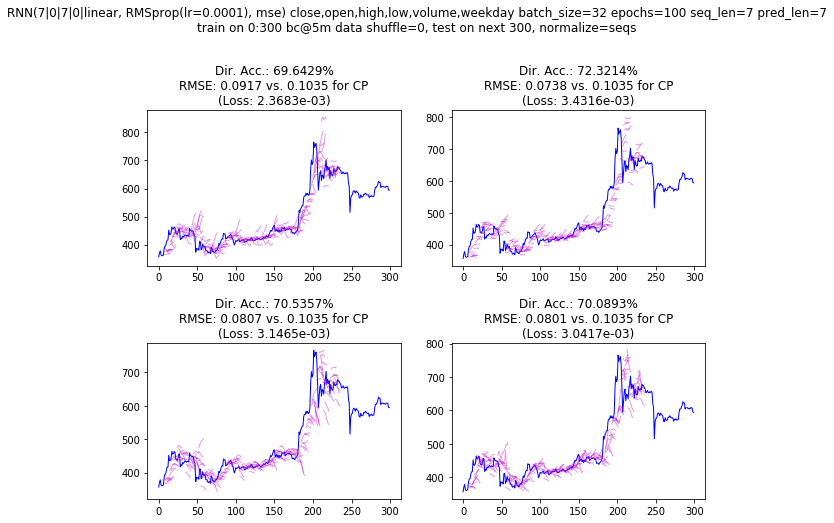

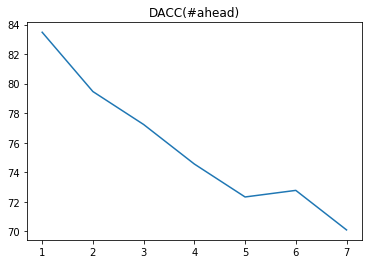

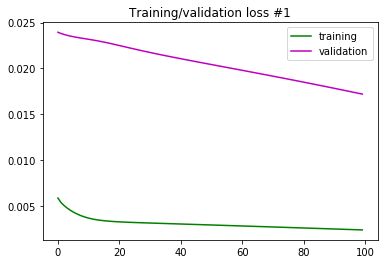

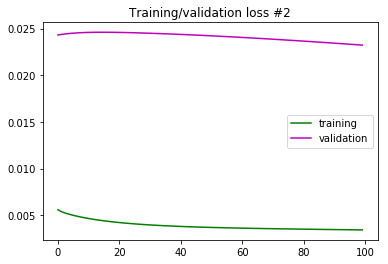

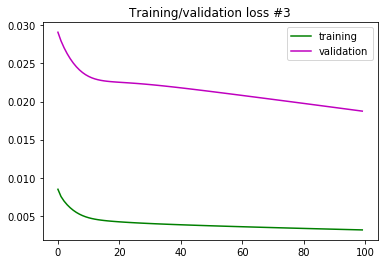

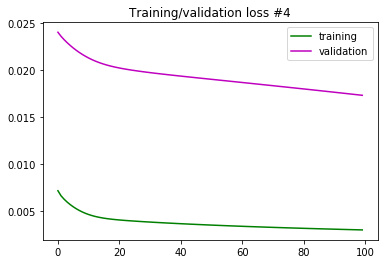

--- 120.223s to run experiment



In [15]:
with timing('run experiment'):
    res = run_walk_forward_validation_rnn(
        # data to extract:
        data24h,
        features=[
            'close',
            'open', 'high', 'low',
            'volume',
            'weekday'
        ],
        from_i=0,
        train_sz=300,
        test_sz=300,
        # data processing:
        normalize='seqs',  # 'seqs' | 'data'
        detrend=False,
        # model and prediction arrangement:
        seq_len=7,
        pred_len=7,
        model_maker=make_rnn_model_constructor(
            [7, 0, 7, 0],
            lr=1e-4,
            optimizer=keras.optimizers.RMSprop
        ),
        # training:
        epochs=100,
        batch_size=32,
        shuffle=False,
        # experiment setup:
        times=4,
        skip=False,
        fix_all_rngs_to=False,
        fix_rngs_before_each=False,
        # plotting:
        fig_size=(10, 8),
        fast=True,
    )
    plot_train_val_losses(res['train_val_losses'])